## Deep learning model for HAR with CNN

In [1]:
import os
os.environ['PYTHONHASHSEED'] = '0'
import pandas as pd
import numpy as np
import tensorflow as tf
import random as rn
from sklearn.preprocessing import StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin
import keras
from keras import backend as K
from keras.models import Sequential
from keras.layers import Dropout, Dense, Flatten
from keras.regularizers import L2
from keras.callbacks import LearningRateScheduler
from keras.layers.convolutional import Conv1D, MaxPooling1D

In [2]:
# Activities are the class labels
# It is a 6 class classification
ACTIVITIES = {
    0: 'WALKING',
    1: 'WALKING_UPSTAIRS',
    2: 'WALKING_DOWNSTAIRS',
    3: 'SITTING',
    4: 'STANDING',
    5: 'LAYING',
}

# Utility function to print the confusion matrix
def confusion_matrix(Y_true, Y_pred):
    Y_true = pd.Series([ACTIVITIES[y] for y in np.argmax(Y_true, axis=1)])
    Y_pred = pd.Series([ACTIVITIES[y] for y in np.argmax(Y_pred, axis=1)])

    return pd.crosstab(Y_true, Y_pred, rownames=['True'], colnames=['Pred'])

In [3]:
# Data directory
DATADIR= os.path.join(os.getcwd(), 'datasets', 'UCI_HAR_Dataset')
# Signals are from Accelerometer and Gyroscope
# The signals are in x,y,z directions
SIGNALS = ["body_acc_x", "body_acc_y", "body_acc_z",
    "body_gyro_x", "body_gyro_y", "body_gyro_z",
    "total_acc_x", "total_acc_y", "total_acc_z"]

In [4]:
# Utility function to load the load
def load_signals(subset):
    signals_data = []

    for signal in SIGNALS:
        filename= DATADIR + f'/UCI_HAR_Dataset/{subset}/Inertial Signals/{signal}_{subset}.txt'
        signals_data.append(pd.read_csv(filename, delim_whitespace=True, header=None).values) 
    # Resultant shape is (7352 train/2947 test samples, 128 timesteps, 9 signals)
    return np.transpose(signals_data, (1, 2, 0))

In [5]:
def load_y(subset):
    filename= DATADIR + f'/UCI_HAR_Dataset/{subset}/y_{subset}.txt'
    y = pd.read_csv(filename, delim_whitespace=True, header=None)[0]
    return pd.get_dummies(y).values

In [169]:
def load_data():
    X_train, X_test = load_signals('train'), load_signals('test')
    y_train, y_test = load_y('train'), load_y('test')
    return X_train, y_train, X_test,  y_test

In [170]:
# setting up seed for random values
np.random.seed(36)
rn.seed(36)
tf.random.set_seed(36)

In [171]:
# Utility function to count the number of classes
def _count_classes(y):
    return len(set([tuple(category) for category in y]))

In [172]:
# Loading the train and test data
X_train, Y_train, X_val, Y_val= load_data()

In [10]:
class scaling_tseries_data(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.scale = None

    def fit(self, X):
        # remove overlaping
        remove = int(X.shape[1] / 2)
        temp_X = X[:, -remove:, :]
        # flatten data
        temp_X = temp_X.reshape((temp_X.shape[0] * temp_X.shape[1], temp_X.shape[2]))
        scale = StandardScaler()
        scale.fit(temp_X)
        self.scale = scale
        return self

    def transform(self, X):
        temp_X1 = X.reshape((X.shape[0] * X.shape[1], X.shape[2]))
        temp_X1 = self.scale.transform(temp_X1)
        return temp_X1.reshape(X.shape)

In [11]:
Scale= scaling_tseries_data()
Scale.fit(X_train)
X_train_sc= Scale.transform(X_train)
X_val_sc= Scale.transform(X_val)

## Modelling with CNN

### Base model

In [136]:
def base_model():
        model= Sequential()
        model.add(Conv1D(filters=32, kernel_size=3, activation='relu', kernel_initializer='he_uniform', input_shape=(X_train_sc.shape[1], X_train_sc.shape[2])))
        model.add(Conv1D(filters=32, kernel_size=3, activation='relu', kernel_initializer='he_uniform'))
        model.add(Dropout(0.6))
        model.add(MaxPooling1D(pool_size=2))
        model.add(Flatten())
        model.add(Dense(50, activation='relu'))
        model.add(Dense(6, activation='softmax'))
        model.summary()

        model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

        history= model.fit(X_train_sc, Y_train, epochs=30, batch_size=16,validation_data=(X_val_sc, Y_val), verbose=1)
        return model, history

In [137]:
def regularized_cnn_model():
        model = Sequential()
        model.add(Conv1D(filters=32, kernel_size=3, activation='relu',kernel_initializer='he_uniform',
                        kernel_regularizer=L2(0.1),input_shape=(128,9)))
        model.add(Conv1D(filters=16, kernel_size=3, activation='relu',kernel_regularizer=L2(0.06),kernel_initializer='he_uniform'))
        model.add(Dropout(0.65))
        model.add(MaxPooling1D(pool_size=2))
        model.add(Flatten())
        model.add(Dense(32, activation='relu'))
        model.add(Dense(6, activation='softmax'))
        model.summary()

        adam = keras.optimizers.Adam(lr=0.001)
        rmsprop = keras.optimizers.RMSprop(lr=0.001)
        def step_decay(epoch):
            return float(0.001 * math.pow(0.6, math.floor((1+epoch)/10)))
        
        lrate = LearningRateScheduler(step_decay)
        callbacks_list = [lrate]

        model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])

        history= model.fit(X_train_sc, Y_train, epochs= 30, batch_size= 16, validation_data= (X_val_sc, Y_val), verbose=1)
        return model, history

In [138]:
cnn_base_model, history= base_model()

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_46 (Conv1D)          (None, 126, 32)           896       
                                                                 
 conv1d_47 (Conv1D)          (None, 124, 32)           3104      
                                                                 
 dropout_23 (Dropout)        (None, 124, 32)           0         
                                                                 
 max_pooling1d_23 (MaxPoolin  (None, 62, 32)           0         
 g1D)                                                            
                                                                 
 flatten_23 (Flatten)        (None, 1984)              0         
                                                                 
 dense_46 (Dense)            (None, 50)                99250     
                                                     

In [139]:
regularized_cnn_model, history= regularized_cnn_model()

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_48 (Conv1D)          (None, 126, 32)           896       
                                                                 
 conv1d_49 (Conv1D)          (None, 124, 16)           1552      
                                                                 
 dropout_24 (Dropout)        (None, 124, 16)           0         
                                                                 
 max_pooling1d_24 (MaxPoolin  (None, 62, 16)           0         
 g1D)                                                            
                                                                 
 flatten_24 (Flatten)        (None, 992)               0         
                                                                 
 dense_48 (Dense)            (None, 32)                31776     
                                                     

C:\Users\vaiv\Documents\Git\ConvAE_LSTM\.convAE_lstm\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)
C:\Users\vaiv\Documents\Git\ConvAE_LSTM\.convAE_lstm\lib\site-packages\keras\optimizers\optimizer_v2\rmsprop.py:140: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Epoch 1/30
460/460 [==============================] - 6s 10ms/step - loss: 3.9676 - accuracy: 0.7565 - val_loss: 1.3318 - val_accuracy: 0.8558
Epoch 2/30
460/460 [==============================] - 4s 8ms/step - loss: 0.6506 - accuracy: 0.9147 - val_loss: 0.6331 - val_accuracy: 0.8748
Epoch 3/30
460/460 [==============================] - 4s 9ms/step - loss: 0.3678 - accuracy: 0.9237 - val_loss: 0.5013 - val_accuracy: 0.8660
Epoch 4/30
460/460 [==============================] - 4s 8ms/step - loss: 0.3038 - accuracy: 0.9293 - val_loss: 0.4667 - val_accuracy: 0.8795
Epoch 5/30
460/460 [==============================] - 4s 9ms/step - loss: 0.2796 - accuracy: 0.9302 - val_loss: 0.4261 - val_accuracy: 0.8972
Epoch 6/30
460/460 [==============================] - 4s 9ms/step - loss: 0.2540 - accuracy: 0.9369 - val_loss: 0.4314 - val_accuracy: 0.8792
Epoch 7/30
460/460 [==============================] - 4s 9ms/step - loss: 0.2441 - accuracy: 0.9378 - val_loss: 0.3995 - val_accuracy: 0.8836
Epoch

In [42]:
def confusion_matrix_rnn(Y_true, Y_pred):
    from sklearn import metrics
    ACTIVITIES = {
        0: 'WALKING',
        1: 'WALKING_UPSTAIRS',
        2: 'WALKING_DOWNSTAIRS',
        3: 'SITTING',
        4: 'STANDING',
        5: 'LAYING'}

    Y_true = pd.Series([ACTIVITIES[y] for y in np.argmax(Y_true, axis=1)])
    Y_pred = pd.Series([ACTIVITIES[y] for y in np.argmax(Y_pred, axis=1)])

    #return pd.crosstab(Y_true, Y_pred, rownames=['True'], colnames=['Pred'])
    return metrics.confusion_matrix(Y_true, Y_pred)

In [46]:
cm_result= confusion_matrix_rnn(Y_val, regularized_cnn_model.predict(X_val_sc))
cm_result

93/93 [==============================] - 1s 4ms/step


93/93 [==============================] - 0s 5ms/step


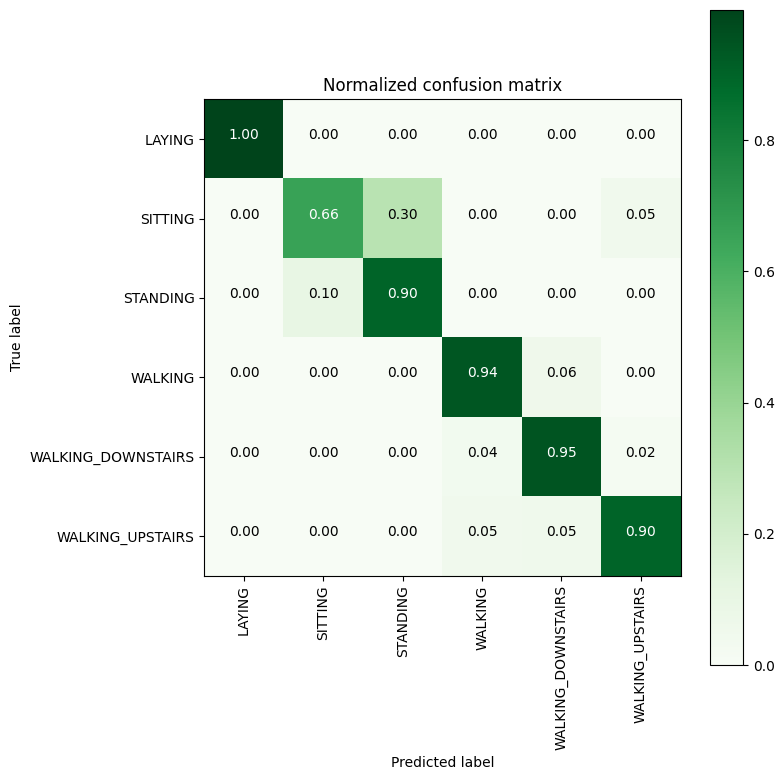

In [50]:
import matplotlib.pyplot as plt
import itertools

plt.figure(figsize=(8,8))

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    
cm = confusion_matrix_rnn(Y_val, regularized_cnn_model.predict(X_val_sc))
labels=['LAYING', 'SITTING','STANDING','WALKING','WALKING_DOWNSTAIRS','WALKING_UPSTAIRS']
plot_confusion_matrix(cm, classes= labels, normalize=True, title='Normalized confusion matrix', cmap = plt.cm.Greens)
plt.show()

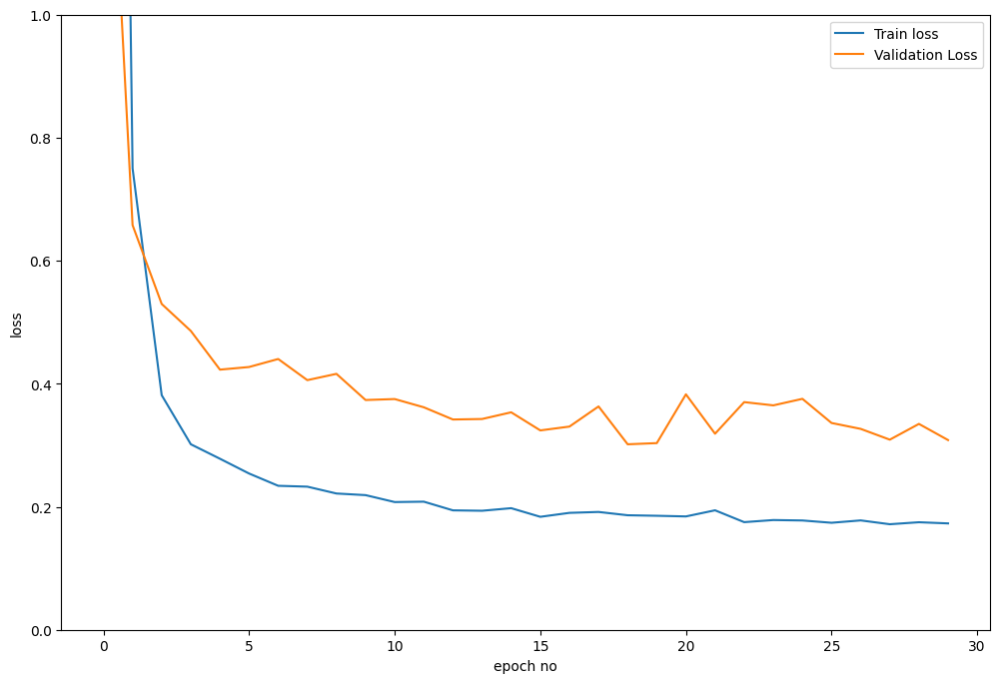

In [51]:
## train loss
plt.figure(figsize=(12,8))
plt.plot(history.history['loss'],label='Train loss')
plt.plot(history.history['val_loss'],label = 'Validation Loss')
plt.xlabel('epoch no')
plt.ylabel('loss')
plt.ylim(0,1)
plt.legend()
plt.show()

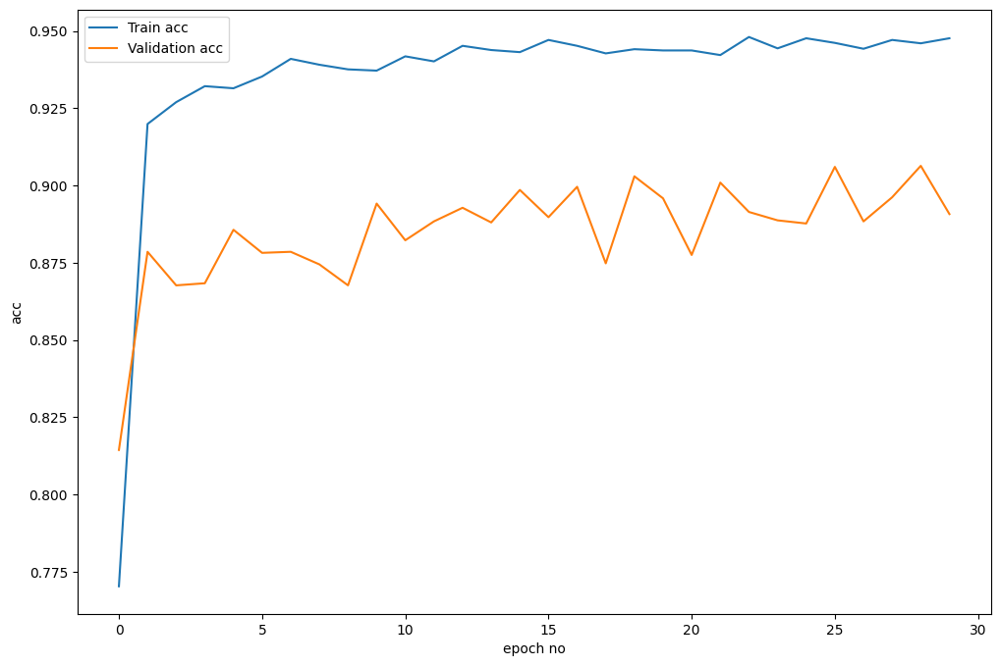

In [52]:
## train accuracy
plt.figure(figsize=(12,8))
plt.plot(history.history['accuracy'],label='Train acc')
plt.plot(history.history['val_accuracy'],label = 'Validation acc')
plt.xlabel('epoch no')
plt.ylabel('acc')
plt.legend()
plt.show()

## Hyperparameter tuning for performance improvement

In [19]:
import itertools
import pandas as pd
import math
import matplotlib.pyplot as plt

import keras
from keras.layers import LSTM
from keras.regularizers import L2
from keras.callbacks import EarlyStopping, CSVLogger

from hyperopt import hp, fmin, tpe, STATUS_OK, Trials
from hyperas.utils import eval_hyperopt_space 

In [14]:
space= {
    'epochs': hp.choice('epochs', np.arange(10, 30, 5, dtype= int)),
    'batch_size': hp.choice('batch_size', np.array([np.power(2, i) for i in range(3,7)], dtype=int)),
    'filters': hp.choice('filters', np.flip(np.array(sorted([np.power(2, i) for i in range(6,8)]), dtype=int))),
    'dropout': hp.choice('dropout', np.array([0.5, 0.4, 0.3], dtype=float)),
    'activation': hp.choice('activation', ['relu', 'selu', 'leaky_relu']),
    'pool': hp.choice('pool', np.arange(2, 4, 1, dtype= int))
    }
args= {
    'timesteps': X_train.shape[1],
    'input_dim': X_train.shape[2],
    'n_classes': _count_classes(Y_train)
}

In [15]:
def objective(space):
    model = Sequential()
    model.add(Conv1D(filters=space['filters'], kernel_size=3, activation=space['activation'], 
                    kernel_regularizer= L2(0.1), kernel_initializer='he_uniform', input_shape=(128,9)))
    model.add(Conv1D(filters=int(space['filters']/2), kernel_size=3, activation=space['activation'],\
                    kernel_regularizer= L2(0.06),kernel_initializer='he_uniform'))
    model.add(Dropout(space['dropout']))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(32, activation='relu'))
    model.add(Dense(6, activation='softmax'))
    model.summary()

    adam = keras.optimizers.Adam(lr=0.001)
    rmsprop = keras.optimizers.RMSprop(lr=0.001)
    def step_decay(epoch):
        return float(0.001 * math.pow(0.6, math.floor((1+epoch)/10)))
    
    lrate = keras.callbacks.LearningRateScheduler(step_decay)
    es= EarlyStopping(monitor= 'loss', mode= 'min', verbose= 1, patience= 15)
    csvlogger= CSVLogger('src/log/log_lstm.log')
    callbacks_list = [lrate, es, csvlogger]

    model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])

    history= model.fit(X_train_sc, Y_train, epochs= 30, batch_size= 16, \
        validation_data= (X_val_sc, Y_val), verbose=1, callbacks= callbacks_list)
    validation_loss = np.amin(history.history['val_loss'])
    print('Best validation loss of epoch:', validation_loss)    
    return {'loss': validation_loss, 'status' : STATUS_OK, 'model':model}

In [16]:
trials= Trials()
best= fmin(fn= objective,
        space= space,
        algo= tpe.suggest,
        max_evals= 50,
        trials= trials)

Model: "sequential"                                                                                                                                                                                                                                                              

_________________________________________________________________                                                                                                                                                                                                                

 Layer (type)                Output Shape              Param #                                                                                                                                                                                                                   


 conv1d (Conv1D)             (None, 126, 128)          3584                                                                                                                   

C:\Users\vaiv\Documents\Git\ConvAE_LSTM\.convAE_lstm\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)

C:\Users\vaiv\Documents\Git\ConvAE_LSTM\.convAE_lstm\lib\site-packages\keras\optimizers\optimizer_v2\rmsprop.py:140: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)



231/460 [==============>...............] - ETA: 3s - loss: 19.0225 - accuracy: 0.8236                                                                                                                                                                                            


460/460 [==============================] - 8s 16ms/step - loss: 11.5479 - accuracy: 0.8637 - val_loss: 2.1851 - val_accuracy: 0.6800 - lr: 0.0010                                                                                                                                

Epoch 2/30                                                                                                                                                                                                                                                                       

 16/460 [>.............................] - ETA: 6s - loss: 1.5505 - accuracy: 0.8828                                                                                                                                                                                            


296/460 [==================>...........] - ETA: 1s - loss: 0.8041 - accuracy: 0.9202                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.6616 - accuracy: 0.9196 - val_loss: 0.9381 - val_accuracy: 0.7014 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

 84/460 [====>.........................] - ETA: 4s - loss: 0.3434 - accuracy: 0.9263                                                                                                                                                                                            


358/460 [======================>.......] - ETA: 1s - loss: 0.3324 - accuracy: 0.9253                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.3257 - accuracy: 0.9260 - val_loss: 0.8515 - val_accuracy: 0.7581 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

147/460 [========>.....................] - ETA: 4s - loss: 0.2958 - accuracy: 0.9315                                                                                                                                                                                            


410/460 [=========================>....] - ETA: 0s - loss: 0.2884 - accuracy: 0.9322                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.2859 - accuracy: 0.9308 - val_loss: 0.9023 - val_accuracy: 0.7048 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

194/460 [===========>..................] - ETA: 3s - loss: 0.2500 - accuracy: 0.9346                                                                                                                                                                                            


434/460 [===========================>..] - ETA: 0s - loss: 0.2703 - accuracy: 0.9306                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.2713 - accuracy: 0.9302 - val_loss: 0.9308 - val_accuracy: 0.7350 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       

234/460 [==============>...............] - ETA: 2s - loss: 0.2214 - accuracy: 0.9428                                                                                                                                                                                            


429/460 [==========================>...] - ETA: 0s - loss: 0.2283 - accuracy: 0.9391                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.2288 - accuracy: 0.9391 - val_loss: 0.8500 - val_accuracy: 0.7465 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

145/460 [========>.....................] - ETA: 6s - loss: 0.2307 - accuracy: 0.9431                                                                                                                                                                                            


306/460 [==================>...........] - ETA: 3s - loss: 0.2509 - accuracy: 0.9346                                                                                                                                                                                            


460/460 [==============================] - 10s 21ms/step - loss: 0.2478 - accuracy: 0.9359 - val_loss: 0.9478 - val_accuracy: 0.7245 - lr: 0.0010                                                                                                                               

Epoch 8/30                                                                                                                                                                                                                                                                       

 47/460 [==>...........................] - ETA: 5s - loss: 0.2022 - accuracy: 0.9521                                                                                                                                                                                            


283/460 [=================>............] - ETA: 2s - loss: 0.2057 - accuracy: 0.9490                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.2062 - accuracy: 0.9476 - val_loss: 1.0731 - val_accuracy: 0.7004 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

 80/460 [====>.........................] - ETA: 4s - loss: 0.2204 - accuracy: 0.9453                                                                                                                                                                                            


354/460 [======================>.......] - ETA: 1s - loss: 0.2231 - accuracy: 0.9419                                                                                                                                                                                            


460/460 [==============================] - 7s 14ms/step - loss: 0.2166 - accuracy: 0.9427 - val_loss: 0.7600 - val_accuracy: 0.7706 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

156/460 [=========>....................] - ETA: 3s - loss: 0.1927 - accuracy: 0.9427                                                                                                                                                                                            


426/460 [==========================>...] - ETA: 0s - loss: 0.1751 - accuracy: 0.9523                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.1757 - accuracy: 0.9518 - val_loss: 0.8160 - val_accuracy: 0.7496 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

172/460 [==========>...................] - ETA: 4s - loss: 0.1817 - accuracy: 0.9520                                                                                                                                                                                            


359/460 [======================>.......] - ETA: 1s - loss: 0.1814 - accuracy: 0.9479                                                                                                                                                                                            


460/460 [==============================] - 11s 24ms/step - loss: 0.1754 - accuracy: 0.9498 - val_loss: 0.9349 - val_accuracy: 0.7275 - lr: 6.0000e-04                                                                                                                           

Epoch 12/30                                                                                                                                                                                                                                                                      

 20/460 [>.............................] - ETA: 14s - loss: 0.1474 - accuracy: 0.9656                                                                                                                                                                                            


117/460 [======>.......................] - ETA: 12s - loss: 0.1604 - accuracy: 0.9578                                                                                                                                                                                            


218/460 [=============>................] - ETA: 8s - loss: 0.1594 - accuracy: 0.9579                                                                                                                                                                                            


319/460 [===================>..........] - ETA: 5s - loss: 0.1620 - accuracy: 0.9567                                                                                                                                                                                            


414/460 [==========================>...] - ETA: 1s - loss: 0.1664 - accuracy: 0.9555                                                                                                                                                                                            


460/460 [==============================] - 19s 41ms/step - loss: 0.1680 - accuracy: 0.9546 - val_loss: 1.0795 - val_accuracy: 0.6983 - lr: 6.0000e-04                                                                                                                           

Epoch 13/30                                                                                                                                                                                                                                                                      

 53/460 [==>...........................] - ETA: 12s - loss: 0.1721 - accuracy: 0.9528                                                                                                                                                                                            


180/460 [==========>...................] - ETA: 7s - loss: 0.1763 - accuracy: 0.9490                                                                                                                                                                                            


303/460 [==================>...........] - ETA: 4s - loss: 0.1722 - accuracy: 0.9495                                                                                                                                                                                            


460/460 [==============================] - 13s 28ms/step - loss: 0.1720 - accuracy: 0.9484 - val_loss: 0.8259 - val_accuracy: 0.7577 - lr: 6.0000e-04                                                                                                                           

Epoch 14/30                                                                                                                                                                                                                                                                      

  7/460 [..............................] - ETA: 12s - loss: 0.1380 - accuracy: 0.9643                                                                                                                                                                                            


130/460 [=======>......................] - ETA: 9s - loss: 0.1698 - accuracy: 0.9519                                                                                                                                                                                            


227/460 [=============>................] - ETA: 7s - loss: 0.1636 - accuracy: 0.9529                                                                                                                                                                                            


342/460 [=====================>........] - ETA: 3s - loss: 0.1642 - accuracy: 0.9527                                                                                                                                                                                            


434/460 [===========================>..] - ETA: 0s - loss: 0.1640 - accuracy: 0.9533                                                                                                                                                                                            


460/460 [==============================] - 18s 40ms/step - loss: 0.1641 - accuracy: 0.9533 - val_loss: 0.7974 - val_accuracy: 0.7679 - lr: 6.0000e-04                                                                                                                           

Epoch 15/30                                                                                                                                                                                                                                                                      

 58/460 [==>...........................] - ETA: 16s - loss: 0.1937 - accuracy: 0.9418                                                                                                                                                                                            


159/460 [=========>....................] - ETA: 11s - loss: 0.1698 - accuracy: 0.9461                                                                                                                                                                                            


283/460 [=================>............] - ETA: 6s - loss: 0.1668 - accuracy: 0.9490                                                                                                                                                                                            


378/460 [=======================>......] - ETA: 3s - loss: 0.1821 - accuracy: 0.9478                                                                                                                                                                                            


460/460 [==============================] - 18s 38ms/step - loss: 0.1843 - accuracy: 0.9476 - val_loss: 0.8445 - val_accuracy: 0.7988 - lr: 6.0000e-04                                                                                                                           

Epoch 16/30                                                                                                                                                                                                                                                                      

 59/460 [==>...........................] - ETA: 8s - loss: 0.1740 - accuracy: 0.9470                                                                                                                                                                                            


219/460 [=============>................] - ETA: 5s - loss: 0.1629 - accuracy: 0.9546                                                                                                                                                                                            


368/460 [=======================>......] - ETA: 2s - loss: 0.1610 - accuracy: 0.9548                                                                                                                                                                                            


460/460 [==============================] - 11s 25ms/step - loss: 0.1607 - accuracy: 0.9532 - val_loss: 0.7095 - val_accuracy: 0.7845 - lr: 6.0000e-04                                                                                                                           

Epoch 17/30                                                                                                                                                                                                                                                                      

 77/460 [====>.........................] - ETA: 7s - loss: 0.1611 - accuracy: 0.9505                                                                                                                                                                                            


253/460 [===============>..............] - ETA: 4s - loss: 0.1547 - accuracy: 0.9511                                                                                                                                                                                            


460/460 [==============================] - 9s 20ms/step - loss: 0.1587 - accuracy: 0.9510 - val_loss: 0.7231 - val_accuracy: 0.7927 - lr: 6.0000e-04                                                                                                                            



Epoch 18/30                                                                                                                                                                                                                                                                      

218/460 [=============>................] - ETA: 3s - loss: 0.1514 - accuracy: 0.9561                                                                                                                                                                                            


451/460 [============================>.] - ETA: 0s - loss: 0.1701 - accuracy: 0.9494                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1706 - accuracy: 0.9494 - val_loss: 0.9157 - val_accuracy: 0.7866 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      

220/460 [=============>................] - ETA: 3s - loss: 0.1946 - accuracy: 0.9420                                                                                                                                                                                            


441/460 [===========================>..] - ETA: 0s - loss: 0.1738 - accuracy: 0.9477                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1732 - accuracy: 0.9480 - val_loss: 0.6159 - val_accuracy: 0.8219 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

158/460 [=========>....................] - ETA: 5s - loss: 0.1530 - accuracy: 0.9494                                                                                                                                                                                            


360/460 [======================>.......] - ETA: 1s - loss: 0.1430 - accuracy: 0.9554                                                                                                                                                                                            


460/460 [==============================] - 9s 20ms/step - loss: 0.1431 - accuracy: 0.9554 - val_loss: 0.6737 - val_accuracy: 0.7995 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

 91/460 [====>.........................] - ETA: 5s - loss: 0.1433 - accuracy: 0.9567                                                                                                                                                                                            


304/460 [==================>...........] - ETA: 2s - loss: 0.1343 - accuracy: 0.9576                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1400 - accuracy: 0.9553 - val_loss: 0.5610 - val_accuracy: 0.8269 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

 57/460 [==>...........................] - ETA: 5s - loss: 0.1342 - accuracy: 0.9605                                                                                                                                                                                            


289/460 [=================>............] - ETA: 2s - loss: 0.1391 - accuracy: 0.9548                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1437 - accuracy: 0.9536 - val_loss: 0.6906 - val_accuracy: 0.7981 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

 54/460 [==>...........................] - ETA: 5s - loss: 0.1211 - accuracy: 0.9699                                                                                                                                                                                            


282/460 [=================>............] - ETA: 2s - loss: 0.1331 - accuracy: 0.9583                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1373 - accuracy: 0.9555 - val_loss: 0.6393 - val_accuracy: 0.8157 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

 55/460 [==>...........................] - ETA: 5s - loss: 0.1427 - accuracy: 0.9545                                                                                                                                                                                            


298/460 [==================>...........] - ETA: 2s - loss: 0.1371 - accuracy: 0.9591                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1380 - accuracy: 0.9562 - val_loss: 0.7278 - val_accuracy: 0.7815 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

 31/460 [=>............................] - ETA: 5s - loss: 0.1202 - accuracy: 0.9637                                                                                                                                                                                            


231/460 [==============>...............] - ETA: 3s - loss: 0.1435 - accuracy: 0.9499                                                                                                                                                                                            


405/460 [=========================>....] - ETA: 0s - loss: 0.1388 - accuracy: 0.9532                                                                                                                                                                                            


460/460 [==============================] - 10s 22ms/step - loss: 0.1392 - accuracy: 0.9524 - val_loss: 0.7664 - val_accuracy: 0.7832 - lr: 3.6000e-04                                                                                                                           

Epoch 26/30                                                                                                                                                                                                                                                                      

 60/460 [==>...........................] - ETA: 13s - loss: 0.1269 - accuracy: 0.9604                                                                                                                                                                                            


168/460 [=========>....................] - ETA: 9s - loss: 0.1400 - accuracy: 0.9546                                                                                                                                                                                            


279/460 [=================>............] - ETA: 5s - loss: 0.1383 - accuracy: 0.9561                                                                                                                                                                                            


381/460 [=======================>......] - ETA: 2s - loss: 0.1442 - accuracy: 0.9528                                                                                                                                                                                            


460/460 [==============================] - 18s 40ms/step - loss: 0.1414 - accuracy: 0.9543 - val_loss: 0.7877 - val_accuracy: 0.7859 - lr: 3.6000e-04                                                                                                                           

Epoch 27/30                                                                                                                                                                                                                                                                      

 10/460 [..............................] - ETA: 23s - loss: 0.1187 - accuracy: 0.9688                                                                                                                                                                                            


101/460 [=====>........................] - ETA: 15s - loss: 0.1478 - accuracy: 0.9524                                                                                                                                                                                            


220/460 [=============>................] - ETA: 8s - loss: 0.1329 - accuracy: 0.9563                                                                                                                                                                                            


320/460 [===================>..........] - ETA: 5s - loss: 0.1335 - accuracy: 0.9563                                                                                                                                                                                            


424/460 [==========================>...] - ETA: 1s - loss: 0.1335 - accuracy: 0.9558                                                                                                                                                                                            


460/460 [==============================] - 18s 39ms/step - loss: 0.1354 - accuracy: 0.9544 - val_loss: 0.6304 - val_accuracy: 0.8191 - lr: 3.6000e-04                                                                                                                           

Epoch 28/30                                                                                                                                                                                                                                                                      

 73/460 [===>..........................] - ETA: 12s - loss: 0.1374 - accuracy: 0.9435                                                                                                                                                                                            


210/460 [============>.................] - ETA: 7s - loss: 0.1340 - accuracy: 0.9515                                                                                                                                                                                            


365/460 [======================>.......] - ETA: 2s - loss: 0.1317 - accuracy: 0.9536                                                                                                                                                                                            


460/460 [==============================] - 13s 28ms/step - loss: 0.1333 - accuracy: 0.9536 - val_loss: 1.0109 - val_accuracy: 0.7296 - lr: 3.6000e-04                                                                                                                           

Epoch 29/30                                                                                                                                                                                                                                                                      

 41/460 [=>............................] - ETA: 8s - loss: 0.1393 - accuracy: 0.9649                                                                                                                                                                                            


204/460 [============>.................] - ETA: 5s - loss: 0.1436 - accuracy: 0.9568                                                                                                                                                                                            


394/460 [========================>.....] - ETA: 1s - loss: 0.1404 - accuracy: 0.9546                                                                                                                                                                                            


460/460 [==============================] - 10s 22ms/step - loss: 0.1396 - accuracy: 0.9553 - val_loss: 0.8927 - val_accuracy: 0.7611 - lr: 3.6000e-04                                                                                                                           

Epoch 30/30                                                                                                                                                                                                                                                                      

136/460 [=======>......................] - ETA: 4s - loss: 0.1313 - accuracy: 0.9573                                                                                                                                                                                            


367/460 [======================>.......] - ETA: 1s - loss: 0.1289 - accuracy: 0.9571                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1278 - accuracy: 0.9576 - val_loss: 0.6946 - val_accuracy: 0.7957 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.561042308807373                                                                                                                                                                                                                                                                
Model: "sequential_1"                                                                                                                                                             

430/460 [===========================>..] - ETA: 0s - loss: 6.1484 - accuracy: 0.8172                                                                                                                                                                                            


460/460 [==============================] - 6s 11ms/step - loss: 5.8273 - accuracy: 0.8240 - val_loss: 1.2706 - val_accuracy: 0.8534 - lr: 0.0010                                                                                                                                

Epoch 2/30                                                                                                                                                                                                                                                                       

310/460 [===================>..........] - ETA: 1s - loss: 0.6524 - accuracy: 0.9218                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.5703 - accuracy: 0.9237 - val_loss: 0.5693 - val_accuracy: 0.8683 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

195/460 [===========>..................] - ETA: 2s - loss: 0.3766 - accuracy: 0.9218                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.3448 - accuracy: 0.9286 - val_loss: 0.4880 - val_accuracy: 0.8809 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

 73/460 [===>..........................] - ETA: 3s - loss: 0.2984 - accuracy: 0.9307                                                                                                                                                                                            


437/460 [===========================>..] - ETA: 0s - loss: 0.2936 - accuracy: 0.9316                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2933 - accuracy: 0.9319 - val_loss: 0.4630 - val_accuracy: 0.8795 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

320/460 [===================>..........] - ETA: 1s - loss: 0.2784 - accuracy: 0.9322                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.2778 - accuracy: 0.9327 - val_loss: 0.4137 - val_accuracy: 0.8911 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       

198/460 [===========>..................] - ETA: 2s - loss: 0.2401 - accuracy: 0.9413                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2442 - accuracy: 0.9368 - val_loss: 0.4255 - val_accuracy: 0.8816 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

 64/460 [===>..........................] - ETA: 4s - loss: 0.2255 - accuracy: 0.9424                                                                                                                                                                                            


407/460 [=========================>....] - ETA: 0s - loss: 0.2377 - accuracy: 0.9378                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2371 - accuracy: 0.9385 - val_loss: 0.3826 - val_accuracy: 0.8816 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

295/460 [==================>...........] - ETA: 1s - loss: 0.2299 - accuracy: 0.9403                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.2285 - accuracy: 0.9407 - val_loss: 0.3704 - val_accuracy: 0.8911 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

191/460 [===========>..................] - ETA: 2s - loss: 0.2098 - accuracy: 0.9431                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.2144 - accuracy: 0.9418 - val_loss: 0.3592 - val_accuracy: 0.8850 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

 75/460 [===>..........................] - ETA: 3s - loss: 0.2292 - accuracy: 0.9367                                                                                                                                                                                            


451/460 [============================>.] - ETA: 0s - loss: 0.1986 - accuracy: 0.9487                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1986 - accuracy: 0.9486 - val_loss: 0.3789 - val_accuracy: 0.8836 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

357/460 [======================>.......] - ETA: 0s - loss: 0.1959 - accuracy: 0.9450                                                                                                                                                                                            


460/460 [==============================] - 4s 10ms/step - loss: 0.1900 - accuracy: 0.9475 - val_loss: 0.3644 - val_accuracy: 0.8938 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

252/460 [===============>..............] - ETA: 1s - loss: 0.1755 - accuracy: 0.9534                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1850 - accuracy: 0.9498 - val_loss: 0.3595 - val_accuracy: 0.9006 - lr: 6.0000e-04                                                                                                                            

Epoch 13/30                                                                                                                                                                                                                                                                      

148/460 [========>.....................] - ETA: 2s - loss: 0.1765 - accuracy: 0.9557                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1812 - accuracy: 0.9489 - val_loss: 0.3722 - val_accuracy: 0.8863 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      

 38/460 [=>............................] - ETA: 3s - loss: 0.1801 - accuracy: 0.9457                                                                                                                                                                                            


401/460 [=========================>....] - ETA: 0s - loss: 0.1823 - accuracy: 0.9507                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1838 - accuracy: 0.9502 - val_loss: 0.3896 - val_accuracy: 0.8867 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

281/460 [=================>............] - ETA: 1s - loss: 0.1723 - accuracy: 0.9520                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1728 - accuracy: 0.9518 - val_loss: 0.3470 - val_accuracy: 0.8982 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      



361/460 [======================>.......] - ETA: 0s - loss: 0.1706 - accuracy: 0.9524                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1730 - accuracy: 0.9501 - val_loss: 0.2979 - val_accuracy: 0.8904 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

244/460 [==============>...............] - ETA: 1s - loss: 0.1658 - accuracy: 0.9521                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1722 - accuracy: 0.9505 - val_loss: 0.3637 - val_accuracy: 0.8823 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

131/460 [=======>......................] - ETA: 2s - loss: 0.1728 - accuracy: 0.9490                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1675 - accuracy: 0.9505 - val_loss: 0.3451 - val_accuracy: 0.8914 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      

 22/460 [>.............................] - ETA: 4s - loss: 0.1636 - accuracy: 0.9574                                                                                                                                                                                            


390/460 [========================>.....] - ETA: 0s - loss: 0.1652 - accuracy: 0.9519                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1669 - accuracy: 0.9510 - val_loss: 0.3778 - val_accuracy: 0.8711 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

276/460 [=================>............] - ETA: 1s - loss: 0.1580 - accuracy: 0.9547                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1567 - accuracy: 0.9555 - val_loss: 0.3203 - val_accuracy: 0.8890 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      



361/460 [======================>.......] - ETA: 0s - loss: 0.1521 - accuracy: 0.9555                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1535 - accuracy: 0.9539 - val_loss: 0.3276 - val_accuracy: 0.8992 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

255/460 [===============>..............] - ETA: 1s - loss: 0.1504 - accuracy: 0.9547                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1503 - accuracy: 0.9536 - val_loss: 0.3328 - val_accuracy: 0.8948 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

147/460 [========>.....................] - ETA: 2s - loss: 0.1431 - accuracy: 0.9571                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1572 - accuracy: 0.9542 - val_loss: 0.3213 - val_accuracy: 0.8979 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

 31/460 [=>............................] - ETA: 4s - loss: 0.1602 - accuracy: 0.9577                                                                                                                                                                                            


345/460 [=====================>........] - ETA: 1s - loss: 0.1518 - accuracy: 0.9551                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1522 - accuracy: 0.9547 - val_loss: 0.3672 - val_accuracy: 0.8921 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

188/460 [===========>..................] - ETA: 2s - loss: 0.1584 - accuracy: 0.9481                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1515 - accuracy: 0.9533 - val_loss: 0.3200 - val_accuracy: 0.9016 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

 60/460 [==>...........................] - ETA: 3s - loss: 0.1442 - accuracy: 0.9573                                                                                                                                                                                            


390/460 [========================>.....] - ETA: 0s - loss: 0.1544 - accuracy: 0.9524                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1516 - accuracy: 0.9536 - val_loss: 0.3328 - val_accuracy: 0.8979 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

239/460 [==============>...............] - ETA: 2s - loss: 0.1469 - accuracy: 0.9545                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1481 - accuracy: 0.9524 - val_loss: 0.3291 - val_accuracy: 0.9040 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      

 49/460 [==>...........................] - ETA: 4s - loss: 0.1360 - accuracy: 0.9554                                                                                                                                                                                            


409/460 [=========================>....] - ETA: 0s - loss: 0.1449 - accuracy: 0.9555                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1448 - accuracy: 0.9558 - val_loss: 0.3299 - val_accuracy: 0.8928 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

281/460 [=================>............] - ETA: 1s - loss: 0.1485 - accuracy: 0.9537                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1469 - accuracy: 0.9548 - val_loss: 0.3242 - val_accuracy: 0.8999 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      

163/460 [=========>....................] - ETA: 2s - loss: 0.1390 - accuracy: 0.9571                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1395 - accuracy: 0.9567 - val_loss: 0.3232 - val_accuracy: 0.9040 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.29792520403862                                                                                                                                                                                                                                                                 
Model: "sequential_2"                                                                                                                                                             

 dropout_2 (Dropout)         (None, 124, 64)           0                                                                                                                                                                                                                         

 max_pooling1d_2 (MaxPooling  (None, 62, 64)           0                                                                                                                                                                                                                         

 1D)                                                                                                                                                                                                                                                                             

 flatten_2 (Flatten)         (None, 3968)              0                                                                                                                       

421/460 [==========================>...] - ETA: 0s - loss: 10.8342 - accuracy: 0.8474                                                                                                                                                                                            


460/460 [==============================] - 8s 16ms/step - loss: 10.0604 - accuracy: 0.8532 - val_loss: 1.5856 - val_accuracy: 0.8453 - lr: 0.0010                                                                                                                                

Epoch 2/30                                                                                                                                                                                                                                                                       

186/460 [===========>..................] - ETA: 3s - loss: 0.9077 - accuracy: 0.9187                                                                                                                                                                                            


422/460 [==========================>...] - ETA: 0s - loss: 0.6689 - accuracy: 0.9190                                                                                                                                                                                            


460/460 [==============================] - 8s 16ms/step - loss: 0.6480 - accuracy: 0.9193 - val_loss: 0.5542 - val_accuracy: 0.8622 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

163/460 [=========>....................] - ETA: 4s - loss: 0.3927 - accuracy: 0.9160                                                                                                                                                                                            


384/460 [========================>.....] - ETA: 1s - loss: 0.3635 - accuracy: 0.9240                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.3551 - accuracy: 0.9251 - val_loss: 0.4717 - val_accuracy: 0.8843 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

145/460 [========>.....................] - ETA: 4s - loss: 0.3173 - accuracy: 0.9272                                                                                                                                                                                            


370/460 [=======================>......] - ETA: 1s - loss: 0.3069 - accuracy: 0.9285                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.3009 - accuracy: 0.9294 - val_loss: 0.4838 - val_accuracy: 0.8694 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

126/460 [=======>......................] - ETA: 5s - loss: 0.2554 - accuracy: 0.9425                                                                                                                                                                                            


347/460 [=====================>........] - ETA: 1s - loss: 0.2678 - accuracy: 0.9362                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.2712 - accuracy: 0.9353 - val_loss: 0.4020 - val_accuracy: 0.8890 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       



228/460 [=============>................] - ETA: 3s - loss: 0.2533 - accuracy: 0.9400                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.2499 - accuracy: 0.9382 - val_loss: 0.3980 - val_accuracy: 0.8839 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

  9/460 [..............................] - ETA: 6s - loss: 0.2811 - accuracy: 0.9444                                                                                                                                                                                            


266/460 [================>.............] - ETA: 2s - loss: 0.2420 - accuracy: 0.9396                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.2343 - accuracy: 0.9419 - val_loss: 0.4363 - val_accuracy: 0.8772 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

 43/460 [=>............................] - ETA: 5s - loss: 0.2073 - accuracy: 0.9564                                                                                                                                                                                            


292/460 [==================>...........] - ETA: 2s - loss: 0.2295 - accuracy: 0.9424                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.2295 - accuracy: 0.9411 - val_loss: 0.3963 - val_accuracy: 0.8755 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

 78/460 [====>.........................] - ETA: 5s - loss: 0.2056 - accuracy: 0.9487                                                                                                                                                                                            


331/460 [====================>.........] - ETA: 1s - loss: 0.2162 - accuracy: 0.9430                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.2158 - accuracy: 0.9437 - val_loss: 0.4165 - val_accuracy: 0.8497 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

 94/460 [=====>........................] - ETA: 4s - loss: 0.2224 - accuracy: 0.9362                                                                                                                                                                                            


344/460 [=====================>........] - ETA: 1s - loss: 0.1945 - accuracy: 0.9489                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1931 - accuracy: 0.9491 - val_loss: 0.3609 - val_accuracy: 0.8948 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

 89/460 [====>.........................] - ETA: 6s - loss: 0.1844 - accuracy: 0.9501                                                                                                                                                                                            


300/460 [==================>...........] - ETA: 2s - loss: 0.1977 - accuracy: 0.9433                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1889 - accuracy: 0.9476 - val_loss: 0.3411 - val_accuracy: 0.8941 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

 58/460 [==>...........................] - ETA: 5s - loss: 0.1633 - accuracy: 0.9634                                                                                                                                                                                            


310/460 [===================>..........] - ETA: 2s - loss: 0.1756 - accuracy: 0.9546                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1807 - accuracy: 0.9517 - val_loss: 0.3470 - val_accuracy: 0.8955 - lr: 6.0000e-04                                                                                                                            

Epoch 13/30                                                                                                                                                                                                                                                                      

 84/460 [====>.........................] - ETA: 5s - loss: 0.1749 - accuracy: 0.9531                                                                                                                                                                                            


330/460 [====================>.........] - ETA: 1s - loss: 0.1772 - accuracy: 0.9506                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1846 - accuracy: 0.9480 - val_loss: 0.3577 - val_accuracy: 0.8958 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      

102/460 [=====>........................] - ETA: 4s - loss: 0.1865 - accuracy: 0.9491                                                                                                                                                                                            


354/460 [======================>.......] - ETA: 1s - loss: 0.1744 - accuracy: 0.9518                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1751 - accuracy: 0.9502 - val_loss: 0.3731 - val_accuracy: 0.8890 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

127/460 [=======>......................] - ETA: 4s - loss: 0.1806 - accuracy: 0.9483                                                                                                                                                                                            


364/460 [======================>.......] - ETA: 1s - loss: 0.1690 - accuracy: 0.9528                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1708 - accuracy: 0.9516 - val_loss: 0.3553 - val_accuracy: 0.8962 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      

131/460 [=======>......................] - ETA: 4s - loss: 0.1484 - accuracy: 0.9609                                                                                                                                                                                            


380/460 [=======================>......] - ETA: 1s - loss: 0.1644 - accuracy: 0.9549                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1683 - accuracy: 0.9514 - val_loss: 0.3090 - val_accuracy: 0.8965 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

164/460 [=========>....................] - ETA: 3s - loss: 0.1764 - accuracy: 0.9455                                                                                                                                                                                            


403/460 [=========================>....] - ETA: 0s - loss: 0.1696 - accuracy: 0.9502                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1760 - accuracy: 0.9487 - val_loss: 0.3687 - val_accuracy: 0.8761 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

175/460 [==========>...................] - ETA: 3s - loss: 0.1697 - accuracy: 0.9536                                                                                                                                                                                            


430/460 [===========================>..] - ETA: 0s - loss: 0.1627 - accuracy: 0.9532                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1638 - accuracy: 0.9517 - val_loss: 0.3218 - val_accuracy: 0.8921 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      

199/460 [===========>..................] - ETA: 3s - loss: 0.1553 - accuracy: 0.9554                                                                                                                                                                                            


400/460 [=========================>....] - ETA: 0s - loss: 0.1612 - accuracy: 0.9516                                                                                                                                                                                            


460/460 [==============================] - 8s 18ms/step - loss: 0.1624 - accuracy: 0.9513 - val_loss: 0.3628 - val_accuracy: 0.8877 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

107/460 [=====>........................] - ETA: 7s - loss: 0.1726 - accuracy: 0.9357                                                                                                                                                                                            


314/460 [===================>..........] - ETA: 2s - loss: 0.1505 - accuracy: 0.9546                                                                                                                                                                                            


460/460 [==============================] - 9s 19ms/step - loss: 0.1512 - accuracy: 0.9550 - val_loss: 0.3330 - val_accuracy: 0.8924 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

 59/460 [==>...........................] - ETA: 5s - loss: 0.1495 - accuracy: 0.9523                                                                                                                                                                                            


295/460 [==================>...........] - ETA: 2s - loss: 0.1484 - accuracy: 0.9553                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1517 - accuracy: 0.9532 - val_loss: 0.3188 - val_accuracy: 0.8877 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

 69/460 [===>..........................] - ETA: 5s - loss: 0.1504 - accuracy: 0.9538                                                                                                                                                                                            


316/460 [===================>..........] - ETA: 1s - loss: 0.1473 - accuracy: 0.9529                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1493 - accuracy: 0.9532 - val_loss: 0.3296 - val_accuracy: 0.8931 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

 82/460 [====>.........................] - ETA: 5s - loss: 0.1366 - accuracy: 0.9627                                                                                                                                                                                            


309/460 [===================>..........] - ETA: 2s - loss: 0.1439 - accuracy: 0.9561                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1458 - accuracy: 0.9550 - val_loss: 0.3132 - val_accuracy: 0.8999 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

 72/460 [===>..........................] - ETA: 5s - loss: 0.1479 - accuracy: 0.9540                                                                                                                                                                                            


335/460 [====================>.........] - ETA: 1s - loss: 0.1495 - accuracy: 0.9567                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1485 - accuracy: 0.9559 - val_loss: 0.3361 - val_accuracy: 0.8972 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

110/460 [======>.......................] - ETA: 4s - loss: 0.1506 - accuracy: 0.9477                                                                                                                                                                                            


301/460 [==================>...........] - ETA: 2s - loss: 0.1477 - accuracy: 0.9539                                                                                                                                                                                            


460/460 [==============================] - 8s 18ms/step - loss: 0.1449 - accuracy: 0.9540 - val_loss: 0.3434 - val_accuracy: 0.8853 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

 56/460 [==>...........................] - ETA: 5s - loss: 0.1320 - accuracy: 0.9621                                                                                                                                                                                            


288/460 [=================>............] - ETA: 2s - loss: 0.1441 - accuracy: 0.9557                                                                                                                                                                                            


460/460 [==============================] - 8s 16ms/step - loss: 0.1444 - accuracy: 0.9547 - val_loss: 0.3365 - val_accuracy: 0.9026 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

 31/460 [=>............................] - ETA: 6s - loss: 0.1461 - accuracy: 0.9556                                                                                                                                                                                            


261/460 [================>.............] - ETA: 2s - loss: 0.1397 - accuracy: 0.9567                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1446 - accuracy: 0.9538 - val_loss: 0.3272 - val_accuracy: 0.8951 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      

  9/460 [..............................] - ETA: 6s - loss: 0.1332 - accuracy: 0.9583                                                                                                                                                                                            


226/460 [=============>................] - ETA: 3s - loss: 0.1431 - accuracy: 0.9538                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1420 - accuracy: 0.9547 - val_loss: 0.3669 - val_accuracy: 0.8829 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

  1/460 [..............................] - ETA: 7s - loss: 0.1284 - accuracy: 1.0000                                                                                                                                                                                             


243/460 [==============>...............] - ETA: 3s - loss: 0.1347 - accuracy: 0.9563                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1375 - accuracy: 0.9550 - val_loss: 0.3191 - val_accuracy: 0.9023 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      

  9/460 [..............................] - ETA: 6s - loss: 0.1500 - accuracy: 0.9514                                                                                                                                                                                            


266/460 [================>.............] - ETA: 2s - loss: 0.1321 - accuracy: 0.9608                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1339 - accuracy: 0.9582 - val_loss: 0.3172 - val_accuracy: 0.8968 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.30898919701576233                                                                                                                                                                                                                                                              
Model: "sequential_3"                                                                                                                                                             

 dropout_3 (Dropout)         (None, 124, 32)           0                                                                                                                                                                                                                         

 max_pooling1d_3 (MaxPooling  (None, 62, 32)           0                                                                                                                                                                                                                         

 1D)                                                                                                                                                                                                                                                                             

 flatten_3 (Flatten)         (None, 1984)              0                                                                                                                       

460/460 [==============================] - 6s 11ms/step - loss: 5.8774 - accuracy: 0.8113 - val_loss: 1.2696 - val_accuracy: 0.8134 - lr: 0.0010                                                                                                                                

Epoch 2/30                                                                                                                                                                                                                                                                       

170/460 [==========>...................] - ETA: 2s - loss: 0.7632 - accuracy: 0.9096                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.5722 - accuracy: 0.9123 - val_loss: 0.5687 - val_accuracy: 0.8616 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

 45/460 [=>............................] - ETA: 3s - loss: 0.3702 - accuracy: 0.9264                                                                                                                                                                                            


405/460 [=========================>....] - ETA: 0s - loss: 0.3504 - accuracy: 0.9248                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.3465 - accuracy: 0.9245 - val_loss: 0.4886 - val_accuracy: 0.8785 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

275/460 [================>.............] - ETA: 1s - loss: 0.3095 - accuracy: 0.9286                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2988 - accuracy: 0.9304 - val_loss: 0.4432 - val_accuracy: 0.8884 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

160/460 [=========>....................] - ETA: 2s - loss: 0.2779 - accuracy: 0.9309                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2679 - accuracy: 0.9361 - val_loss: 0.4125 - val_accuracy: 0.8928 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       

 37/460 [=>............................] - ETA: 3s - loss: 0.2388 - accuracy: 0.9493                                                                                                                                                                                            


390/460 [========================>.....] - ETA: 0s - loss: 0.2499 - accuracy: 0.9362                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2500 - accuracy: 0.9353 - val_loss: 0.4104 - val_accuracy: 0.8846 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

203/460 [============>.................] - ETA: 3s - loss: 0.2367 - accuracy: 0.9400                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.2344 - accuracy: 0.9397 - val_loss: 0.3961 - val_accuracy: 0.8816 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

  9/460 [..............................] - ETA: 5s - loss: 0.2517 - accuracy: 0.9097                                                                                                                                                                                            


354/460 [======================>.......] - ETA: 1s - loss: 0.2387 - accuracy: 0.9338                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2406 - accuracy: 0.9334 - val_loss: 0.3986 - val_accuracy: 0.8802 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

219/460 [=============>................] - ETA: 2s - loss: 0.2179 - accuracy: 0.9404                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2178 - accuracy: 0.9411 - val_loss: 0.3761 - val_accuracy: 0.8860 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

 73/460 [===>..........................] - ETA: 3s - loss: 0.2122 - accuracy: 0.9469                                                                                                                                                                                            


337/460 [====================>.........] - ETA: 1s - loss: 0.2005 - accuracy: 0.9431                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1985 - accuracy: 0.9448 - val_loss: 0.3691 - val_accuracy: 0.8914 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

219/460 [=============>................] - ETA: 2s - loss: 0.1974 - accuracy: 0.9455                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1929 - accuracy: 0.9468 - val_loss: 0.3436 - val_accuracy: 0.8938 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

108/460 [======>.......................] - ETA: 3s - loss: 0.1754 - accuracy: 0.9554                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1874 - accuracy: 0.9483 - val_loss: 0.3426 - val_accuracy: 0.8924 - lr: 6.0000e-04                                                                                                                            

Epoch 13/30                                                                                                                                                                                                                                                                      



313/460 [===================>..........] - ETA: 1s - loss: 0.1832 - accuracy: 0.9481                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1896 - accuracy: 0.9449 - val_loss: 0.3402 - val_accuracy: 0.8938 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      



337/460 [====================>.........] - ETA: 1s - loss: 0.1817 - accuracy: 0.9477                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1838 - accuracy: 0.9467 - val_loss: 0.3698 - val_accuracy: 0.8856 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

154/460 [=========>....................] - ETA: 3s - loss: 0.1764 - accuracy: 0.9456                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1770 - accuracy: 0.9484 - val_loss: 0.3353 - val_accuracy: 0.8948 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      



322/460 [====================>.........] - ETA: 1s - loss: 0.1662 - accuracy: 0.9530                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1750 - accuracy: 0.9490 - val_loss: 0.3263 - val_accuracy: 0.8904 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

168/460 [=========>....................] - ETA: 2s - loss: 0.1786 - accuracy: 0.9457                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1713 - accuracy: 0.9510 - val_loss: 0.3461 - val_accuracy: 0.8911 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

 26/460 [>.............................] - ETA: 3s - loss: 0.1705 - accuracy: 0.9423                                                                                                                                                                                            


364/460 [======================>.......] - ETA: 0s - loss: 0.1718 - accuracy: 0.9505                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1729 - accuracy: 0.9487 - val_loss: 0.3546 - val_accuracy: 0.8765 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      

152/460 [========>.....................] - ETA: 3s - loss: 0.1699 - accuracy: 0.9519                                                                                                                                                                                            


425/460 [==========================>...] - ETA: 0s - loss: 0.1739 - accuracy: 0.9482                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1743 - accuracy: 0.9480 - val_loss: 0.3239 - val_accuracy: 0.8982 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

281/460 [=================>............] - ETA: 1s - loss: 0.1567 - accuracy: 0.9548                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1564 - accuracy: 0.9553 - val_loss: 0.3281 - val_accuracy: 0.8816 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

153/460 [========>.....................] - ETA: 2s - loss: 0.1563 - accuracy: 0.9571                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1548 - accuracy: 0.9544 - val_loss: 0.3222 - val_accuracy: 0.8945 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

 13/460 [..............................] - ETA: 4s - loss: 0.1599 - accuracy: 0.9471                                                                                                                                                                                            


341/460 [=====================>........] - ETA: 1s - loss: 0.1525 - accuracy: 0.9551                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1538 - accuracy: 0.9535 - val_loss: 0.3251 - val_accuracy: 0.8924 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

218/460 [=============>................] - ETA: 2s - loss: 0.1492 - accuracy: 0.9541                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1555 - accuracy: 0.9517 - val_loss: 0.3356 - val_accuracy: 0.8924 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

 93/460 [=====>........................] - ETA: 3s - loss: 0.1495 - accuracy: 0.9536                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1496 - accuracy: 0.9554 - val_loss: 0.3416 - val_accuracy: 0.8938 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      



361/460 [======================>.......] - ETA: 0s - loss: 0.1506 - accuracy: 0.9539                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1486 - accuracy: 0.9542 - val_loss: 0.3157 - val_accuracy: 0.8928 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

248/460 [===============>..............] - ETA: 1s - loss: 0.1499 - accuracy: 0.9534                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1491 - accuracy: 0.9539 - val_loss: 0.3344 - val_accuracy: 0.8897 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

131/460 [=======>......................] - ETA: 2s - loss: 0.1496 - accuracy: 0.9518                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1513 - accuracy: 0.9501 - val_loss: 0.3250 - val_accuracy: 0.8965 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      

  6/460 [..............................] - ETA: 4s - loss: 0.1303 - accuracy: 0.9583                                                                                                                                                                                            


379/460 [=======================>......] - ETA: 0s - loss: 0.1463 - accuracy: 0.9540                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1466 - accuracy: 0.9540 - val_loss: 0.3240 - val_accuracy: 0.8955 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

275/460 [================>.............] - ETA: 1s - loss: 0.1439 - accuracy: 0.9534                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1452 - accuracy: 0.9532 - val_loss: 0.3159 - val_accuracy: 0.8975 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      

136/460 [=======>......................] - ETA: 3s - loss: 0.1389 - accuracy: 0.9563                                                                                                                                                                                            


440/460 [===========================>..] - ETA: 0s - loss: 0.1391 - accuracy: 0.9558                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1388 - accuracy: 0.9559 - val_loss: 0.3054 - val_accuracy: 0.8996 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.3054439425468445                                                                                                                                                                                                                                                               
Model: "sequential_4"                                                                                                                                                             

460/460 [==============================] - 6s 11ms/step - loss: 5.9452 - accuracy: 0.8564 - val_loss: 1.3750 - val_accuracy: 0.8602 - lr: 0.0010                                                                                                                                

Epoch 2/30                                                                                                                                                                                                                                                                       

 84/460 [====>.........................] - ETA: 3s - loss: 0.9862 - accuracy: 0.9115                                                                                                                                                                                            


456/460 [============================>.] - ETA: 0s - loss: 0.6233 - accuracy: 0.9230                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.6219 - accuracy: 0.9226 - val_loss: 0.6371 - val_accuracy: 0.8456 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

339/460 [=====================>........] - ETA: 1s - loss: 0.3542 - accuracy: 0.9281                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.3444 - accuracy: 0.9289 - val_loss: 0.4843 - val_accuracy: 0.8894 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

233/460 [==============>...............] - ETA: 1s - loss: 0.3111 - accuracy: 0.9289                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.2930 - accuracy: 0.9323 - val_loss: 0.4561 - val_accuracy: 0.8853 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

119/460 [======>.......................] - ETA: 3s - loss: 0.2449 - accuracy: 0.9459                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2575 - accuracy: 0.9373 - val_loss: 0.4188 - val_accuracy: 0.8948 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       



355/460 [======================>.......] - ETA: 0s - loss: 0.2378 - accuracy: 0.9400                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.2384 - accuracy: 0.9396 - val_loss: 0.3940 - val_accuracy: 0.8955 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

253/460 [===============>..............] - ETA: 1s - loss: 0.2333 - accuracy: 0.9397                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.2259 - accuracy: 0.9415 - val_loss: 0.4122 - val_accuracy: 0.8816 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

141/460 [========>.....................] - ETA: 2s - loss: 0.2369 - accuracy: 0.9344                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.2293 - accuracy: 0.9395 - val_loss: 0.3762 - val_accuracy: 0.8839 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

 32/460 [=>............................] - ETA: 3s - loss: 0.1971 - accuracy: 0.9492                                                                                                                                                                                            


397/460 [========================>.....] - ETA: 0s - loss: 0.2081 - accuracy: 0.9457                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.2106 - accuracy: 0.9450 - val_loss: 0.3768 - val_accuracy: 0.8809 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

270/460 [================>.............] - ETA: 1s - loss: 0.1915 - accuracy: 0.9447                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1869 - accuracy: 0.9484 - val_loss: 0.3597 - val_accuracy: 0.8996 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

156/460 [=========>....................] - ETA: 2s - loss: 0.1847 - accuracy: 0.9487                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1833 - accuracy: 0.9490 - val_loss: 0.3455 - val_accuracy: 0.8958 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

 10/460 [..............................] - ETA: 5s - loss: 0.1723 - accuracy: 0.9500                                                                                                                                                                                            


302/460 [==================>...........] - ETA: 1s - loss: 0.1778 - accuracy: 0.9507                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1811 - accuracy: 0.9489 - val_loss: 0.3311 - val_accuracy: 0.9063 - lr: 6.0000e-04                                                                                                                            

Epoch 13/30                                                                                                                                                                                                                                                                      



360/460 [======================>.......] - ETA: 0s - loss: 0.1727 - accuracy: 0.9505                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1752 - accuracy: 0.9483 - val_loss: 0.3288 - val_accuracy: 0.9040 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      

251/460 [===============>..............] - ETA: 1s - loss: 0.1764 - accuracy: 0.9487                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1758 - accuracy: 0.9482 - val_loss: 0.3840 - val_accuracy: 0.8850 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

138/460 [========>.....................] - ETA: 2s - loss: 0.1720 - accuracy: 0.9484                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1722 - accuracy: 0.9498 - val_loss: 0.3771 - val_accuracy: 0.8921 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      

 33/460 [=>............................] - ETA: 3s - loss: 0.1572 - accuracy: 0.9527                                                                                                                                                                                            


402/460 [=========================>....] - ETA: 0s - loss: 0.1656 - accuracy: 0.9532                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1673 - accuracy: 0.9512 - val_loss: 0.3238 - val_accuracy: 0.8982 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

283/460 [=================>............] - ETA: 1s - loss: 0.1603 - accuracy: 0.9516                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1632 - accuracy: 0.9516 - val_loss: 0.3618 - val_accuracy: 0.8907 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

165/460 [=========>....................] - ETA: 2s - loss: 0.1707 - accuracy: 0.9462                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1667 - accuracy: 0.9467 - val_loss: 0.4155 - val_accuracy: 0.8687 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      

 49/460 [==>...........................] - ETA: 3s - loss: 0.1773 - accuracy: 0.9541                                                                                                                                                                                            


388/460 [========================>.....] - ETA: 0s - loss: 0.1667 - accuracy: 0.9488                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1672 - accuracy: 0.9484 - val_loss: 0.3199 - val_accuracy: 0.9063 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

256/460 [===============>..............] - ETA: 1s - loss: 0.1491 - accuracy: 0.9553                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1500 - accuracy: 0.9550 - val_loss: 0.3274 - val_accuracy: 0.9009 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

157/460 [=========>....................] - ETA: 2s - loss: 0.1528 - accuracy: 0.9546                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1532 - accuracy: 0.9535 - val_loss: 0.3161 - val_accuracy: 0.9006 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

 37/460 [=>............................] - ETA: 3s - loss: 0.1439 - accuracy: 0.9578                                                                                                                                                                                            


387/460 [========================>.....] - ETA: 0s - loss: 0.1485 - accuracy: 0.9516                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1488 - accuracy: 0.9520 - val_loss: 0.3158 - val_accuracy: 0.9036 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

276/460 [=================>............] - ETA: 1s - loss: 0.1406 - accuracy: 0.9567                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1459 - accuracy: 0.9536 - val_loss: 0.4122 - val_accuracy: 0.8734 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

140/460 [========>.....................] - ETA: 3s - loss: 0.1518 - accuracy: 0.9540                                                                                                                                                                                            


448/460 [============================>.] - ETA: 0s - loss: 0.1499 - accuracy: 0.9530                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1496 - accuracy: 0.9529 - val_loss: 0.3365 - val_accuracy: 0.8938 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

306/460 [==================>...........] - ETA: 1s - loss: 0.1479 - accuracy: 0.9524                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1450 - accuracy: 0.9524 - val_loss: 0.3356 - val_accuracy: 0.8958 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

208/460 [============>.................] - ETA: 2s - loss: 0.1444 - accuracy: 0.9540                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1472 - accuracy: 0.9533 - val_loss: 0.2994 - val_accuracy: 0.9091 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

 95/460 [=====>........................] - ETA: 3s - loss: 0.1566 - accuracy: 0.9441                                                                                                                                                                                            


453/460 [============================>.] - ETA: 0s - loss: 0.1446 - accuracy: 0.9510                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1453 - accuracy: 0.9505 - val_loss: 0.2995 - val_accuracy: 0.9040 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      

337/460 [====================>.........] - ETA: 1s - loss: 0.1423 - accuracy: 0.9529                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1416 - accuracy: 0.9532 - val_loss: 0.3433 - val_accuracy: 0.8945 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

227/460 [=============>................] - ETA: 2s - loss: 0.1354 - accuracy: 0.9576                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1414 - accuracy: 0.9540 - val_loss: 0.2952 - val_accuracy: 0.9070 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      

106/460 [=====>........................] - ETA: 2s - loss: 0.1347 - accuracy: 0.9564                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1350 - accuracy: 0.9561 - val_loss: 0.2911 - val_accuracy: 0.9050 - lr: 2.1600e-04                                                                                                                            



Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.29114651679992676                                                                                                                                                                                                                                                              
Model: "sequential_5"                                                                                                                                                                                                                                                            

_________________________________________________________________                                                                                                                

460/460 [==============================] - 6s 11ms/step - loss: 6.6705 - accuracy: 0.8411 - val_loss: 1.6056 - val_accuracy: 0.8293 - lr: 0.0010                                                                                                                                

Epoch 2/30                                                                                                                                                                                                                                                                       

 91/460 [====>.........................] - ETA: 3s - loss: 1.1141 - accuracy: 0.9176                                                                                                                                                                                            


460/460 [==============================] - ETA: 0s - loss: 0.6742 - accuracy: 0.9221                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.6742 - accuracy: 0.9221 - val_loss: 0.6343 - val_accuracy: 0.8419 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

340/460 [=====================>........] - ETA: 1s - loss: 0.3684 - accuracy: 0.9250                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.3590 - accuracy: 0.9251 - val_loss: 0.4831 - val_accuracy: 0.8721 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

224/460 [=============>................] - ETA: 2s - loss: 0.3067 - accuracy: 0.9280                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2973 - accuracy: 0.9289 - val_loss: 0.4729 - val_accuracy: 0.8670 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

 90/460 [====>.........................] - ETA: 3s - loss: 0.2530 - accuracy: 0.9444                                                                                                                                                                                            


413/460 [=========================>....] - ETA: 0s - loss: 0.2792 - accuracy: 0.9316                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.2787 - accuracy: 0.9324 - val_loss: 0.4080 - val_accuracy: 0.8945 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       

209/460 [============>.................] - ETA: 3s - loss: 0.2659 - accuracy: 0.9306                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.2553 - accuracy: 0.9321 - val_loss: 0.4094 - val_accuracy: 0.8850 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

 40/460 [=>............................] - ETA: 4s - loss: 0.2321 - accuracy: 0.9531                                                                                                                                                                                            


392/460 [========================>.....] - ETA: 0s - loss: 0.2370 - accuracy: 0.9407                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2364 - accuracy: 0.9412 - val_loss: 0.4015 - val_accuracy: 0.8687 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

256/460 [===============>..............] - ETA: 1s - loss: 0.2312 - accuracy: 0.9377                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.2340 - accuracy: 0.9368 - val_loss: 0.3819 - val_accuracy: 0.8724 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

134/460 [=======>......................] - ETA: 3s - loss: 0.2086 - accuracy: 0.9487                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2201 - accuracy: 0.9407 - val_loss: 0.4752 - val_accuracy: 0.8168 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      



351/460 [=====================>........] - ETA: 0s - loss: 0.2001 - accuracy: 0.9441                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1989 - accuracy: 0.9457 - val_loss: 0.3333 - val_accuracy: 0.9026 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

223/460 [=============>................] - ETA: 2s - loss: 0.1958 - accuracy: 0.9448                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1883 - accuracy: 0.9461 - val_loss: 0.3368 - val_accuracy: 0.8867 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

 91/460 [====>.........................] - ETA: 3s - loss: 0.1793 - accuracy: 0.9560                                                                                                                                                                                            


428/460 [==========================>...] - ETA: 0s - loss: 0.1855 - accuracy: 0.9506                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1864 - accuracy: 0.9498 - val_loss: 0.3460 - val_accuracy: 0.8850 - lr: 6.0000e-04                                                                                                                            

Epoch 13/30                                                                                                                                                                                                                                                                      

300/460 [==================>...........] - ETA: 1s - loss: 0.1942 - accuracy: 0.9448                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1951 - accuracy: 0.9425 - val_loss: 0.3084 - val_accuracy: 0.9002 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      

170/460 [==========>...................] - ETA: 2s - loss: 0.1787 - accuracy: 0.9522                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1809 - accuracy: 0.9489 - val_loss: 0.3264 - val_accuracy: 0.8901 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

 45/460 [=>............................] - ETA: 3s - loss: 0.2010 - accuracy: 0.9319                                                                                                                                                                                            


406/460 [=========================>....] - ETA: 0s - loss: 0.1767 - accuracy: 0.9480                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1771 - accuracy: 0.9479 - val_loss: 0.3165 - val_accuracy: 0.8975 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      

273/460 [================>.............] - ETA: 1s - loss: 0.1631 - accuracy: 0.9551                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1807 - accuracy: 0.9471 - val_loss: 0.3310 - val_accuracy: 0.8833 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

157/460 [=========>....................] - ETA: 2s - loss: 0.1760 - accuracy: 0.9471                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1751 - accuracy: 0.9504 - val_loss: 0.3334 - val_accuracy: 0.8972 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

 33/460 [=>............................] - ETA: 4s - loss: 0.1712 - accuracy: 0.9527                                                                                                                                                                                            


323/460 [====================>.........] - ETA: 1s - loss: 0.1769 - accuracy: 0.9495                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1760 - accuracy: 0.9484 - val_loss: 0.4473 - val_accuracy: 0.8347 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      



328/460 [====================>.........] - ETA: 1s - loss: 0.1687 - accuracy: 0.9495                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1691 - accuracy: 0.9499 - val_loss: 0.3188 - val_accuracy: 0.8843 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

202/460 [============>.................] - ETA: 2s - loss: 0.1570 - accuracy: 0.9527                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1557 - accuracy: 0.9547 - val_loss: 0.2993 - val_accuracy: 0.8853 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

 74/460 [===>..........................] - ETA: 3s - loss: 0.1491 - accuracy: 0.9586                                                                                                                                                                                            


390/460 [========================>.....] - ETA: 0s - loss: 0.1552 - accuracy: 0.9540                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1556 - accuracy: 0.9531 - val_loss: 0.3301 - val_accuracy: 0.8765 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

270/460 [================>.............] - ETA: 1s - loss: 0.1605 - accuracy: 0.9512                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1610 - accuracy: 0.9493 - val_loss: 0.3117 - val_accuracy: 0.8928 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

146/460 [========>.....................] - ETA: 2s - loss: 0.1478 - accuracy: 0.9551                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1535 - accuracy: 0.9525 - val_loss: 0.2923 - val_accuracy: 0.8877 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

 14/460 [..............................] - ETA: 3s - loss: 0.1507 - accuracy: 0.9598                                                                                                                                                                                            


378/460 [=======================>......] - ETA: 0s - loss: 0.1502 - accuracy: 0.9550                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1513 - accuracy: 0.9538 - val_loss: 0.3002 - val_accuracy: 0.8979 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

257/460 [===============>..............] - ETA: 1s - loss: 0.1563 - accuracy: 0.9516                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1493 - accuracy: 0.9535 - val_loss: 0.3053 - val_accuracy: 0.8907 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

131/460 [=======>......................] - ETA: 3s - loss: 0.1510 - accuracy: 0.9537                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1505 - accuracy: 0.9521 - val_loss: 0.2948 - val_accuracy: 0.8975 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

  5/460 [..............................] - ETA: 5s - loss: 0.1760 - accuracy: 0.9250                                                                                                                                                                                            


360/460 [======================>.......] - ETA: 0s - loss: 0.1518 - accuracy: 0.9512                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1502 - accuracy: 0.9523 - val_loss: 0.3193 - val_accuracy: 0.8860 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      

238/460 [==============>...............] - ETA: 2s - loss: 0.1512 - accuracy: 0.9504                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1483 - accuracy: 0.9533 - val_loss: 0.3024 - val_accuracy: 0.8989 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

121/460 [======>.......................] - ETA: 3s - loss: 0.1498 - accuracy: 0.9566                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1518 - accuracy: 0.9510 - val_loss: 0.3239 - val_accuracy: 0.8700 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      

  5/460 [..............................] - ETA: 5s - loss: 0.1427 - accuracy: 0.9625                                                                                                                                                                                             


290/460 [=================>............] - ETA: 1s - loss: 0.1391 - accuracy: 0.9593                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1393 - accuracy: 0.9580 - val_loss: 0.2838 - val_accuracy: 0.8975 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.28379255533218384                                                                                                                                                                                                                                                              
Model: "sequential_6"                                                                                                                                                             

243/460 [==============>...............] - ETA: 3s - loss: 16.4555 - accuracy: 0.8328                                                                                                                                                                                            


460/460 [==============================] - 9s 16ms/step - loss: 10.1225 - accuracy: 0.8713 - val_loss: 1.5256 - val_accuracy: 0.8497 - lr: 0.0010                                                                                                                                

Epoch 2/30                                                                                                                                                                                                                                                                       

  1/460 [..............................] - ETA: 10s - loss: 1.4394 - accuracy: 0.7500                                                                                                                                                                                            


222/460 [=============>................] - ETA: 3s - loss: 0.8013 - accuracy: 0.9195                                                                                                                                                                                            


446/460 [============================>.] - ETA: 0s - loss: 0.6168 - accuracy: 0.9175                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.6113 - accuracy: 0.9173 - val_loss: 0.5264 - val_accuracy: 0.8789 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

216/460 [=============>................] - ETA: 3s - loss: 0.3706 - accuracy: 0.9112                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.3451 - accuracy: 0.9206 - val_loss: 0.4516 - val_accuracy: 0.8846 - lr: 0.0010                                                                                                                                



Epoch 4/30                                                                                                                                                                                                                                                                       

237/460 [==============>...............] - ETA: 3s - loss: 0.3037 - accuracy: 0.9277                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.3015 - accuracy: 0.9248 - val_loss: 0.4581 - val_accuracy: 0.8721 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

  1/460 [..............................] - ETA: 8s - loss: 0.1858 - accuracy: 0.9375                                                                                                                                                                                             


239/460 [==============>...............] - ETA: 3s - loss: 0.2587 - accuracy: 0.9341                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.2734 - accuracy: 0.9323 - val_loss: 0.3942 - val_accuracy: 0.8924 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       

 21/460 [>.............................] - ETA: 5s - loss: 0.2437 - accuracy: 0.9554                                                                                                                                                                                            


271/460 [================>.............] - ETA: 2s - loss: 0.2500 - accuracy: 0.9366                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.2484 - accuracy: 0.9348 - val_loss: 0.3903 - val_accuracy: 0.8863 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

 32/460 [=>............................] - ETA: 6s - loss: 0.2056 - accuracy: 0.9570                                                                                                                                                                                            


279/460 [=================>............] - ETA: 2s - loss: 0.2359 - accuracy: 0.9424                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.2342 - accuracy: 0.9402 - val_loss: 0.6230 - val_accuracy: 0.8130 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

 33/460 [=>............................] - ETA: 5s - loss: 0.2610 - accuracy: 0.9318                                                                                                                                                                                            


269/460 [================>.............] - ETA: 2s - loss: 0.2406 - accuracy: 0.9370                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.2344 - accuracy: 0.9396 - val_loss: 0.3863 - val_accuracy: 0.8782 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       



202/460 [============>.................] - ETA: 4s - loss: 0.2221 - accuracy: 0.9437                                                                                                                                                                                            


442/460 [===========================>..] - ETA: 0s - loss: 0.2259 - accuracy: 0.9385                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.2279 - accuracy: 0.9376 - val_loss: 0.5076 - val_accuracy: 0.8307 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

201/460 [============>.................] - ETA: 3s - loss: 0.2103 - accuracy: 0.9412                                                                                                                                                                                            


450/460 [============================>.] - ETA: 0s - loss: 0.1971 - accuracy: 0.9474                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1972 - accuracy: 0.9472 - val_loss: 0.3317 - val_accuracy: 0.9033 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

222/460 [=============>................] - ETA: 3s - loss: 0.1911 - accuracy: 0.9468                                                                                                                                                                                            


455/460 [============================>.] - ETA: 0s - loss: 0.1877 - accuracy: 0.9475                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1876 - accuracy: 0.9476 - val_loss: 0.3203 - val_accuracy: 0.9013 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

221/460 [=============>................] - ETA: 3s - loss: 0.1812 - accuracy: 0.9528                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1893 - accuracy: 0.9497 - val_loss: 0.3568 - val_accuracy: 0.8860 - lr: 6.0000e-04                                                                                                                            



Epoch 13/30                                                                                                                                                                                                                                                                      

229/460 [=============>................] - ETA: 3s - loss: 0.1819 - accuracy: 0.9517                                                                                                                                                                                            


455/460 [============================>.] - ETA: 0s - loss: 0.1880 - accuracy: 0.9468                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1880 - accuracy: 0.9468 - val_loss: 0.3275 - val_accuracy: 0.8968 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      

204/460 [============>.................] - ETA: 4s - loss: 0.1753 - accuracy: 0.9510                                                                                                                                                                                            


424/460 [==========================>...] - ETA: 0s - loss: 0.1933 - accuracy: 0.9465                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1923 - accuracy: 0.9468 - val_loss: 0.3384 - val_accuracy: 0.8938 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

176/460 [==========>...................] - ETA: 4s - loss: 0.1772 - accuracy: 0.9489                                                                                                                                                                                            


399/460 [=========================>....] - ETA: 0s - loss: 0.1715 - accuracy: 0.9532                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1728 - accuracy: 0.9516 - val_loss: 0.3432 - val_accuracy: 0.8846 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      

159/460 [=========>....................] - ETA: 4s - loss: 0.1581 - accuracy: 0.9579                                                                                                                                                                                            


376/460 [=======================>......] - ETA: 1s - loss: 0.1730 - accuracy: 0.9528                                                                                                                                                                                            


460/460 [==============================] - 8s 18ms/step - loss: 0.1744 - accuracy: 0.9505 - val_loss: 0.3073 - val_accuracy: 0.8941 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

102/460 [=====>........................] - ETA: 5s - loss: 0.1679 - accuracy: 0.9504                                                                                                                                                                                            


318/460 [===================>..........] - ETA: 2s - loss: 0.1640 - accuracy: 0.9522                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1685 - accuracy: 0.9521 - val_loss: 0.3248 - val_accuracy: 0.9006 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

 83/460 [====>.........................] - ETA: 5s - loss: 0.1656 - accuracy: 0.9526                                                                                                                                                                                            


315/460 [===================>..........] - ETA: 2s - loss: 0.1631 - accuracy: 0.9542                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1712 - accuracy: 0.9494 - val_loss: 0.3952 - val_accuracy: 0.8588 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      

 84/460 [====>.........................] - ETA: 4s - loss: 0.1551 - accuracy: 0.9598                                                                                                                                                                                            


307/460 [===================>..........] - ETA: 2s - loss: 0.1906 - accuracy: 0.9456                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.2018 - accuracy: 0.9445 - val_loss: 0.3104 - val_accuracy: 0.9019 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

 61/460 [==>...........................] - ETA: 6s - loss: 0.1758 - accuracy: 0.9426                                                                                                                                                                                            


281/460 [=================>............] - ETA: 2s - loss: 0.1608 - accuracy: 0.9544                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1606 - accuracy: 0.9544 - val_loss: 0.3046 - val_accuracy: 0.9016 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

 57/460 [==>...........................] - ETA: 4s - loss: 0.1585 - accuracy: 0.9539                                                                                                                                                                                            


285/460 [=================>............] - ETA: 2s - loss: 0.1527 - accuracy: 0.9570                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1564 - accuracy: 0.9539 - val_loss: 0.3016 - val_accuracy: 0.8989 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

 49/460 [==>...........................] - ETA: 6s - loss: 0.1485 - accuracy: 0.9566                                                                                                                                                                                            


281/460 [=================>............] - ETA: 2s - loss: 0.1546 - accuracy: 0.9537                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1552 - accuracy: 0.9524 - val_loss: 0.3186 - val_accuracy: 0.8945 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

 44/460 [=>............................] - ETA: 5s - loss: 0.1293 - accuracy: 0.9702                                                                                                                                                                                            


271/460 [================>.............] - ETA: 2s - loss: 0.1439 - accuracy: 0.9594                                                                                                                                                                                            


460/460 [==============================] - 8s 18ms/step - loss: 0.1491 - accuracy: 0.9563 - val_loss: 0.3001 - val_accuracy: 0.9002 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

 11/460 [..............................] - ETA: 7s - loss: 0.1341 - accuracy: 0.9659                                                                                                                                                                                            


203/460 [============>.................] - ETA: 4s - loss: 0.1567 - accuracy: 0.9492                                                                                                                                                                                            


422/460 [==========================>...] - ETA: 0s - loss: 0.1550 - accuracy: 0.9531                                                                                                                                                                                            


460/460 [==============================] - 8s 18ms/step - loss: 0.1532 - accuracy: 0.9542 - val_loss: 0.3115 - val_accuracy: 0.8870 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

184/460 [===========>..................] - ETA: 4s - loss: 0.1543 - accuracy: 0.9531                                                                                                                                                                                            


422/460 [==========================>...] - ETA: 0s - loss: 0.1494 - accuracy: 0.9557                                                                                                                                                                                            


460/460 [==============================] - 8s 16ms/step - loss: 0.1490 - accuracy: 0.9554 - val_loss: 0.2991 - val_accuracy: 0.9006 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

181/460 [==========>...................] - ETA: 3s - loss: 0.1473 - accuracy: 0.9568                                                                                                                                                                                            


414/460 [==========================>...] - ETA: 0s - loss: 0.1519 - accuracy: 0.9546                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1503 - accuracy: 0.9561 - val_loss: 0.2859 - val_accuracy: 0.9108 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

184/460 [===========>..................] - ETA: 3s - loss: 0.1526 - accuracy: 0.9511                                                                                                                                                                                            


418/460 [==========================>...] - ETA: 0s - loss: 0.1500 - accuracy: 0.9532                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1524 - accuracy: 0.9531 - val_loss: 0.3187 - val_accuracy: 0.8877 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      

183/460 [==========>...................] - ETA: 3s - loss: 0.1499 - accuracy: 0.9518                                                                                                                                                                                            


408/460 [=========================>....] - ETA: 0s - loss: 0.1436 - accuracy: 0.9557                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1439 - accuracy: 0.9557 - val_loss: 0.3185 - val_accuracy: 0.8877 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

171/460 [==========>...................] - ETA: 4s - loss: 0.1483 - accuracy: 0.9565                                                                                                                                                                                            


367/460 [======================>.......] - ETA: 1s - loss: 0.1483 - accuracy: 0.9547                                                                                                                                                                                            


460/460 [==============================] - 8s 18ms/step - loss: 0.1496 - accuracy: 0.9543 - val_loss: 0.2906 - val_accuracy: 0.9033 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      

113/460 [======>.......................] - ETA: 4s - loss: 0.1351 - accuracy: 0.9624                                                                                                                                                                                            


343/460 [=====================>........] - ETA: 1s - loss: 0.1401 - accuracy: 0.9574                                                                                                                                                                                            


460/460 [==============================] - 8s 16ms/step - loss: 0.1383 - accuracy: 0.9584 - val_loss: 0.2870 - val_accuracy: 0.8938 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.28590357303619385                                                                                                                                                                                                                                                              
Model: "sequential_7"                                                                                                                                                             

246/460 [===============>..............] - ETA: 3s - loss: 18.1966 - accuracy: 0.8023                                                                                                                                                                                            


434/460 [===========================>..] - ETA: 0s - loss: 12.0399 - accuracy: 0.8474                                                                                                                                                                                            


460/460 [==============================] - 10s 19ms/step - loss: 11.4718 - accuracy: 0.8511 - val_loss: 3.1160 - val_accuracy: 0.5229 - lr: 0.0010                                                                                                                               

Epoch 2/30                                                                                                                                                                                                                                                                       

169/460 [==========>...................] - ETA: 4s - loss: 1.0240 - accuracy: 0.9157                                                                                                                                                                                            


398/460 [========================>.....] - ETA: 0s - loss: 0.7162 - accuracy: 0.9166                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.6758 - accuracy: 0.9159 - val_loss: 1.8421 - val_accuracy: 0.5253 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

163/460 [=========>....................] - ETA: 4s - loss: 0.3754 - accuracy: 0.9107                                                                                                                                                                                            


392/460 [========================>.....] - ETA: 0s - loss: 0.3562 - accuracy: 0.9165                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.3475 - accuracy: 0.9187 - val_loss: 1.7164 - val_accuracy: 0.5517 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

146/460 [========>.....................] - ETA: 4s - loss: 0.3077 - accuracy: 0.9285                                                                                                                                                                                            


327/460 [====================>.........] - ETA: 2s - loss: 0.3033 - accuracy: 0.9281                                                                                                                                                                                            


460/460 [==============================] - 9s 20ms/step - loss: 0.2943 - accuracy: 0.9283 - val_loss: 2.8876 - val_accuracy: 0.4598 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

 52/460 [==>...........................] - ETA: 6s - loss: 0.2803 - accuracy: 0.9279                                                                                                                                                                                            


262/460 [================>.............] - ETA: 3s - loss: 0.2679 - accuracy: 0.9327                                                                                                                                                                                            


460/460 [==============================] - 8s 18ms/step - loss: 0.2645 - accuracy: 0.9357 - val_loss: 2.3918 - val_accuracy: 0.4835 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       



219/460 [=============>................] - ETA: 3s - loss: 0.2540 - accuracy: 0.9344                                                                                                                                                                                            


416/460 [==========================>...] - ETA: 0s - loss: 0.2553 - accuracy: 0.9322                                                                                                                                                                                            


460/460 [==============================] - 8s 18ms/step - loss: 0.2569 - accuracy: 0.9323 - val_loss: 3.7695 - val_accuracy: 0.4656 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

156/460 [=========>....................] - ETA: 4s - loss: 0.2382 - accuracy: 0.9411                                                                                                                                                                                            


361/460 [======================>.......] - ETA: 1s - loss: 0.2549 - accuracy: 0.9346                                                                                                                                                                                            


460/460 [==============================] - 9s 19ms/step - loss: 0.2517 - accuracy: 0.9354 - val_loss: 3.0249 - val_accuracy: 0.4798 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

 89/460 [====>.........................] - ETA: 5s - loss: 0.2136 - accuracy: 0.9445                                                                                                                                                                                            


309/460 [===================>..........] - ETA: 2s - loss: 0.2212 - accuracy: 0.9426                                                                                                                                                                                            


460/460 [==============================] - 8s 18ms/step - loss: 0.2242 - accuracy: 0.9404 - val_loss: 3.4711 - val_accuracy: 0.4829 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

 39/460 [=>............................] - ETA: 6s - loss: 0.2534 - accuracy: 0.9343                                                                                                                                                                                            


250/460 [===============>..............] - ETA: 3s - loss: 0.2370 - accuracy: 0.9398                                                                                                                                                                                            


460/460 [==============================] - ETA: 0s - loss: 0.2269 - accuracy: 0.9395                                                                                                                                                                                            


460/460 [==============================] - 8s 18ms/step - loss: 0.2269 - accuracy: 0.9395 - val_loss: 2.4911 - val_accuracy: 0.5070 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

207/460 [============>.................] - ETA: 3s - loss: 0.1900 - accuracy: 0.9460                                                                                                                                                                                            


424/460 [==========================>...] - ETA: 0s - loss: 0.1817 - accuracy: 0.9503                                                                                                                                                                                            


460/460 [==============================] - 8s 18ms/step - loss: 0.1819 - accuracy: 0.9501 - val_loss: 2.1123 - val_accuracy: 0.5344 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

139/460 [========>.....................] - ETA: 5s - loss: 0.1939 - accuracy: 0.9442                                                                                                                                                                                            


365/460 [======================>.......] - ETA: 1s - loss: 0.1906 - accuracy: 0.9454                                                                                                                                                                                            


460/460 [==============================] - 9s 20ms/step - loss: 0.1859 - accuracy: 0.9472 - val_loss: 2.5482 - val_accuracy: 0.5103 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

 63/460 [===>..........................] - ETA: 7s - loss: 0.1549 - accuracy: 0.9623                                                                                                                                                                                            


279/460 [=================>............] - ETA: 2s - loss: 0.1657 - accuracy: 0.9570                                                                                                                                                                                            


440/460 [===========================>..] - ETA: 0s - loss: 0.1744 - accuracy: 0.9531                                                                                                                                                                                            


460/460 [==============================] - 10s 21ms/step - loss: 0.1743 - accuracy: 0.9531 - val_loss: 2.8329 - val_accuracy: 0.4954 - lr: 6.0000e-04                                                                                                                           

Epoch 13/30                                                                                                                                                                                                                                                                      

176/460 [==========>...................] - ETA: 4s - loss: 0.1782 - accuracy: 0.9510                                                                                                                                                                                            


404/460 [=========================>....] - ETA: 0s - loss: 0.1780 - accuracy: 0.9477                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1782 - accuracy: 0.9467 - val_loss: 2.6725 - val_accuracy: 0.5120 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      

159/460 [=========>....................] - ETA: 4s - loss: 0.1713 - accuracy: 0.9528                                                                                                                                                                                            


386/460 [========================>.....] - ETA: 1s - loss: 0.1683 - accuracy: 0.9535                                                                                                                                                                                            


460/460 [==============================] - 8s 16ms/step - loss: 0.1715 - accuracy: 0.9514 - val_loss: 1.1860 - val_accuracy: 0.6885 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

138/460 [========>.....................] - ETA: 4s - loss: 0.1993 - accuracy: 0.9416                                                                                                                                                                                            


369/460 [=======================>......] - ETA: 1s - loss: 0.1904 - accuracy: 0.9448                                                                                                                                                                                            


460/460 [==============================] - 8s 16ms/step - loss: 0.2046 - accuracy: 0.9422 - val_loss: 1.6337 - val_accuracy: 0.6383 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      

125/460 [=======>......................] - ETA: 4s - loss: 0.1841 - accuracy: 0.9550                                                                                                                                                                                            


348/460 [=====================>........] - ETA: 1s - loss: 0.1689 - accuracy: 0.9553                                                                                                                                                                                            


460/460 [==============================] - 8s 16ms/step - loss: 0.1699 - accuracy: 0.9524 - val_loss: 2.1450 - val_accuracy: 0.5392 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

103/460 [=====>........................] - ETA: 5s - loss: 0.1659 - accuracy: 0.9490                                                                                                                                                                                            


338/460 [=====================>........] - ETA: 1s - loss: 0.1602 - accuracy: 0.9521                                                                                                                                                                                            


460/460 [==============================] - 8s 16ms/step - loss: 0.1635 - accuracy: 0.9510 - val_loss: 1.9191 - val_accuracy: 0.5921 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

 90/460 [====>.........................] - ETA: 5s - loss: 0.1575 - accuracy: 0.9549                                                                                                                                                                                            


318/460 [===================>..........] - ETA: 2s - loss: 0.1567 - accuracy: 0.9528                                                                                                                                                                                            


460/460 [==============================] - 8s 16ms/step - loss: 0.1585 - accuracy: 0.9509 - val_loss: 1.9033 - val_accuracy: 0.5521 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      

 76/460 [===>..........................] - ETA: 5s - loss: 0.1769 - accuracy: 0.9498                                                                                                                                                                                            


308/460 [===================>..........] - ETA: 2s - loss: 0.2578 - accuracy: 0.9338                                                                                                                                                                                            


460/460 [==============================] - 8s 16ms/step - loss: 0.2498 - accuracy: 0.9366 - val_loss: 2.5512 - val_accuracy: 0.5887 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

 66/460 [===>..........................] - ETA: 5s - loss: 0.1778 - accuracy: 0.9489                                                                                                                                                                                            


295/460 [==================>...........] - ETA: 2s - loss: 0.1642 - accuracy: 0.9551                                                                                                                                                                                            


460/460 [==============================] - 8s 16ms/step - loss: 0.1602 - accuracy: 0.9551 - val_loss: 1.7110 - val_accuracy: 0.6162 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

 52/460 [==>...........................] - ETA: 5s - loss: 0.1509 - accuracy: 0.9531                                                                                                                                                                                            


273/460 [================>.............] - ETA: 2s - loss: 0.1434 - accuracy: 0.9597                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1487 - accuracy: 0.9558 - val_loss: 1.6796 - val_accuracy: 0.6115 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

 25/460 [>.............................] - ETA: 6s - loss: 0.1476 - accuracy: 0.9375                                                                                                                                                                                            


238/460 [==============>...............] - ETA: 3s - loss: 0.1477 - accuracy: 0.9546                                                                                                                                                                                            


439/460 [===========================>..] - ETA: 0s - loss: 0.1452 - accuracy: 0.9526                                                                                                                                                                                            


460/460 [==============================] - 9s 19ms/step - loss: 0.1456 - accuracy: 0.9525 - val_loss: 1.7917 - val_accuracy: 0.6040 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

165/460 [=========>....................] - ETA: 5s - loss: 0.1385 - accuracy: 0.9568                                                                                                                                                                                            


382/460 [=======================>......] - ETA: 1s - loss: 0.1415 - accuracy: 0.9548                                                                                                                                                                                            


460/460 [==============================] - 8s 18ms/step - loss: 0.1429 - accuracy: 0.9543 - val_loss: 1.5534 - val_accuracy: 0.6332 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

139/460 [========>.....................] - ETA: 4s - loss: 0.1404 - accuracy: 0.9550                                                                                                                                                                                            


372/460 [=======================>......] - ETA: 1s - loss: 0.1414 - accuracy: 0.9560                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1413 - accuracy: 0.9558 - val_loss: 1.5401 - val_accuracy: 0.6308 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

124/460 [=======>......................] - ETA: 4s - loss: 0.1456 - accuracy: 0.9501                                                                                                                                                                                            


337/460 [====================>.........] - ETA: 1s - loss: 0.1428 - accuracy: 0.9520                                                                                                                                                                                            


460/460 [==============================] - 8s 18ms/step - loss: 0.1426 - accuracy: 0.9525 - val_loss: 2.2843 - val_accuracy: 0.5473 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

 75/460 [===>..........................] - ETA: 6s - loss: 0.1377 - accuracy: 0.9592                                                                                                                                                                                            


283/460 [=================>............] - ETA: 2s - loss: 0.1442 - accuracy: 0.9567                                                                                                                                                                                            


460/460 [==============================] - 9s 19ms/step - loss: 0.1472 - accuracy: 0.9532 - val_loss: 1.8964 - val_accuracy: 0.5986 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

 19/460 [>.............................] - ETA: 5s - loss: 0.1290 - accuracy: 0.9638                                                                                                                                                                                            


244/460 [==============>...............] - ETA: 3s - loss: 0.1406 - accuracy: 0.9539                                                                                                                                                                                            


460/460 [==============================] - 8s 16ms/step - loss: 0.1534 - accuracy: 0.9510 - val_loss: 1.4051 - val_accuracy: 0.6899 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      

  5/460 [..............................] - ETA: 6s - loss: 0.1458 - accuracy: 0.9500                                                                                                                                                                                            


230/460 [==============>...............] - ETA: 3s - loss: 0.1429 - accuracy: 0.9508                                                                                                                                                                                            


447/460 [============================>.] - ETA: 0s - loss: 0.1395 - accuracy: 0.9534                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1396 - accuracy: 0.9533 - val_loss: 1.6239 - val_accuracy: 0.6274 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

207/460 [============>.................] - ETA: 3s - loss: 0.1370 - accuracy: 0.9556                                                                                                                                                                                            


439/460 [===========================>..] - ETA: 0s - loss: 0.1383 - accuracy: 0.9526                                                                                                                                                                                            


460/460 [==============================] - 8s 16ms/step - loss: 0.1374 - accuracy: 0.9532 - val_loss: 1.6262 - val_accuracy: 0.6291 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      

189/460 [===========>..................] - ETA: 4s - loss: 0.1301 - accuracy: 0.9544                                                                                                                                                                                            


405/460 [=========================>....] - ETA: 0s - loss: 0.1319 - accuracy: 0.9554                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1308 - accuracy: 0.9558 - val_loss: 1.4474 - val_accuracy: 0.6454 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
1.1860432624816895                                                                                                                                                                                                                                                               
Model: "sequential_8"                                                                                                                                                             

460/460 [==============================] - 6s 12ms/step - loss: 6.7663 - accuracy: 0.8294 - val_loss: 2.7891 - val_accuracy: 0.5087 - lr: 0.0010                                                                                                                                

Epoch 2/30                                                                                                                                                                                                                                                                       



337/460 [====================>.........] - ETA: 1s - loss: 0.7420 - accuracy: 0.9126                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.6550 - accuracy: 0.9121 - val_loss: 1.6388 - val_accuracy: 0.4981 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

204/460 [============>.................] - ETA: 2s - loss: 0.3675 - accuracy: 0.9161                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.3442 - accuracy: 0.9202 - val_loss: 1.8783 - val_accuracy: 0.4829 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

 75/460 [===>..........................] - ETA: 3s - loss: 0.3045 - accuracy: 0.9175                                                                                                                                                                                            


431/460 [===========================>..] - ETA: 0s - loss: 0.2876 - accuracy: 0.9271                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2863 - accuracy: 0.9274 - val_loss: 2.5010 - val_accuracy: 0.4462 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

296/460 [==================>...........] - ETA: 1s - loss: 0.2636 - accuracy: 0.9316                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2727 - accuracy: 0.9278 - val_loss: 2.0431 - val_accuracy: 0.5080 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       

148/460 [========>.....................] - ETA: 3s - loss: 0.2374 - accuracy: 0.9417                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.2442 - accuracy: 0.9342 - val_loss: 2.2945 - val_accuracy: 0.5188 - lr: 0.0010                                                                                                                                



Epoch 7/30                                                                                                                                                                                                                                                                       

306/460 [==================>...........] - ETA: 1s - loss: 0.2405 - accuracy: 0.9355                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.2380 - accuracy: 0.9357 - val_loss: 2.8671 - val_accuracy: 0.4618 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

128/460 [=======>......................] - ETA: 3s - loss: 0.2165 - accuracy: 0.9404                                                                                                                                                                                            


457/460 [============================>.] - ETA: 0s - loss: 0.2467 - accuracy: 0.9342                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.2468 - accuracy: 0.9342 - val_loss: 2.2341 - val_accuracy: 0.5175 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

313/460 [===================>..........] - ETA: 1s - loss: 0.2158 - accuracy: 0.9445                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.2129 - accuracy: 0.9438 - val_loss: 2.5902 - val_accuracy: 0.4869 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

154/460 [=========>....................] - ETA: 2s - loss: 0.2055 - accuracy: 0.9416                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1902 - accuracy: 0.9483 - val_loss: 2.0737 - val_accuracy: 0.5137 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

 19/460 [>.............................] - ETA: 3s - loss: 0.2272 - accuracy: 0.9309                                                                                                                                                                                            


349/460 [=====================>........] - ETA: 1s - loss: 0.1883 - accuracy: 0.9470                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1853 - accuracy: 0.9472 - val_loss: 2.5848 - val_accuracy: 0.5008 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

201/460 [============>.................] - ETA: 2s - loss: 0.1796 - accuracy: 0.9537                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1834 - accuracy: 0.9505 - val_loss: 2.3214 - val_accuracy: 0.4988 - lr: 6.0000e-04                                                                                                                            

Epoch 13/30                                                                                                                                                                                                                                                                      

 62/460 [===>..........................] - ETA: 3s - loss: 0.1751 - accuracy: 0.9536                                                                                                                                                                                            


396/460 [========================>.....] - ETA: 0s - loss: 0.1839 - accuracy: 0.9481                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1853 - accuracy: 0.9467 - val_loss: 2.3378 - val_accuracy: 0.5385 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      

249/460 [===============>..............] - ETA: 2s - loss: 0.1764 - accuracy: 0.9518                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1739 - accuracy: 0.9512 - val_loss: 2.2482 - val_accuracy: 0.5246 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

105/460 [=====>........................] - ETA: 3s - loss: 0.1981 - accuracy: 0.9417                                                                                                                                                                                            


441/460 [===========================>..] - ETA: 0s - loss: 0.1738 - accuracy: 0.9503                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1744 - accuracy: 0.9505 - val_loss: 2.0967 - val_accuracy: 0.5334 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      

297/460 [==================>...........] - ETA: 1s - loss: 0.1588 - accuracy: 0.9571                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1696 - accuracy: 0.9502 - val_loss: 2.4555 - val_accuracy: 0.5053 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

148/460 [========>.....................] - ETA: 3s - loss: 0.1713 - accuracy: 0.9443                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1706 - accuracy: 0.9489 - val_loss: 1.8819 - val_accuracy: 0.5799 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      



334/460 [====================>.........] - ETA: 1s - loss: 0.1657 - accuracy: 0.9525                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1652 - accuracy: 0.9516 - val_loss: 2.2674 - val_accuracy: 0.5205 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      

189/460 [===========>..................] - ETA: 2s - loss: 0.1564 - accuracy: 0.9557                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1621 - accuracy: 0.9523 - val_loss: 2.2468 - val_accuracy: 0.5484 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

 41/460 [=>............................] - ETA: 4s - loss: 0.1515 - accuracy: 0.9558                                                                                                                                                                                            


343/460 [=====================>........] - ETA: 1s - loss: 0.1485 - accuracy: 0.9561                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1500 - accuracy: 0.9557 - val_loss: 2.2443 - val_accuracy: 0.5365 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

171/460 [==========>...................] - ETA: 3s - loss: 0.1521 - accuracy: 0.9536                                                                                                                                                                                            


452/460 [============================>.] - ETA: 0s - loss: 0.1500 - accuracy: 0.9535                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1509 - accuracy: 0.9531 - val_loss: 1.8912 - val_accuracy: 0.5524 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

298/460 [==================>...........] - ETA: 1s - loss: 0.1434 - accuracy: 0.9583                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1458 - accuracy: 0.9563 - val_loss: 2.5967 - val_accuracy: 0.5199 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

130/460 [=======>......................] - ETA: 3s - loss: 0.1364 - accuracy: 0.9567                                                                                                                                                                                            


440/460 [===========================>..] - ETA: 0s - loss: 0.1450 - accuracy: 0.9534                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1460 - accuracy: 0.9535 - val_loss: 2.0223 - val_accuracy: 0.5602 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

257/460 [===============>..............] - ETA: 2s - loss: 0.1459 - accuracy: 0.9570                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1498 - accuracy: 0.9551 - val_loss: 2.1848 - val_accuracy: 0.5531 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

102/460 [=====>........................] - ETA: 3s - loss: 0.1486 - accuracy: 0.9547                                                                                                                                                                                            


435/460 [===========================>..] - ETA: 0s - loss: 0.1424 - accuracy: 0.9563                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1423 - accuracy: 0.9557 - val_loss: 2.1660 - val_accuracy: 0.5501 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

252/460 [===============>..............] - ETA: 2s - loss: 0.1406 - accuracy: 0.9591                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1420 - accuracy: 0.9567 - val_loss: 2.3976 - val_accuracy: 0.5402 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

 74/460 [===>..........................] - ETA: 4s - loss: 0.1671 - accuracy: 0.9485                                                                                                                                                                                            


403/460 [=========================>....] - ETA: 0s - loss: 0.1558 - accuracy: 0.9530                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1573 - accuracy: 0.9520 - val_loss: 2.8470 - val_accuracy: 0.5161 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      

250/460 [===============>..............] - ETA: 2s - loss: 0.1486 - accuracy: 0.9488                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1434 - accuracy: 0.9531 - val_loss: 2.0620 - val_accuracy: 0.5619 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

 74/460 [===>..........................] - ETA: 3s - loss: 0.1222 - accuracy: 0.9620                                                                                                                                                                                            


382/460 [=======================>......] - ETA: 0s - loss: 0.1365 - accuracy: 0.9562                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1370 - accuracy: 0.9559 - val_loss: 2.1427 - val_accuracy: 0.5592 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      

217/460 [=============>................] - ETA: 2s - loss: 0.1338 - accuracy: 0.9582                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1342 - accuracy: 0.9563 - val_loss: 1.9278 - val_accuracy: 0.5782 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
1.6388322114944458                                                                                                                                                                                                                                                               
Model: "sequential_9"                                                                                                                                                             

Total params: 71,686                                                                                                                                                                                                                                                             

Trainable params: 71,686                                                                                                                                                                                                                                                         

Non-trainable params: 0                                                                                                                                                                                                                                                          

_________________________________________________________________                                                                                                              

460/460 [==============================] - 6s 11ms/step - loss: 6.4092 - accuracy: 0.8505 - val_loss: 1.5364 - val_accuracy: 0.8565 - lr: 0.0010                                                                                                                                

Epoch 2/30                                                                                                                                                                                                                                                                       

170/460 [==========>...................] - ETA: 2s - loss: 0.9593 - accuracy: 0.9217                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.6839 - accuracy: 0.9199 - val_loss: 0.6460 - val_accuracy: 0.8307 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

 49/460 [==>...........................] - ETA: 3s - loss: 0.3807 - accuracy: 0.9235                                                                                                                                                                                            


391/460 [========================>.....] - ETA: 0s - loss: 0.3662 - accuracy: 0.9226                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.3564 - accuracy: 0.9241 - val_loss: 0.4982 - val_accuracy: 0.8761 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

255/460 [===============>..............] - ETA: 1s - loss: 0.3092 - accuracy: 0.9297                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2952 - accuracy: 0.9304 - val_loss: 0.4830 - val_accuracy: 0.8714 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

122/460 [======>.......................] - ETA: 3s - loss: 0.2712 - accuracy: 0.9355                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2687 - accuracy: 0.9334 - val_loss: 0.4137 - val_accuracy: 0.8853 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       



352/460 [=====================>........] - ETA: 0s - loss: 0.2394 - accuracy: 0.9366                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2414 - accuracy: 0.9361 - val_loss: 0.4357 - val_accuracy: 0.8812 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

208/460 [============>.................] - ETA: 2s - loss: 0.2481 - accuracy: 0.9363                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.2403 - accuracy: 0.9372 - val_loss: 0.4727 - val_accuracy: 0.8585 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

 26/460 [>.............................] - ETA: 3s - loss: 0.2158 - accuracy: 0.9279                                                                                                                                                                                            


321/460 [===================>..........] - ETA: 1s - loss: 0.2279 - accuracy: 0.9359                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.2362 - accuracy: 0.9350 - val_loss: 0.4239 - val_accuracy: 0.8578 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

135/460 [=======>......................] - ETA: 4s - loss: 0.2109 - accuracy: 0.9486                                                                                                                                                                                            


341/460 [=====================>........] - ETA: 1s - loss: 0.2145 - accuracy: 0.9441                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.2140 - accuracy: 0.9440 - val_loss: 0.3698 - val_accuracy: 0.8799 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

204/460 [============>.................] - ETA: 2s - loss: 0.2028 - accuracy: 0.9415                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1948 - accuracy: 0.9480 - val_loss: 0.3903 - val_accuracy: 0.8843 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

 66/460 [===>..........................] - ETA: 3s - loss: 0.1793 - accuracy: 0.9555                                                                                                                                                                                            


421/460 [==========================>...] - ETA: 0s - loss: 0.1901 - accuracy: 0.9474                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1877 - accuracy: 0.9491 - val_loss: 0.3580 - val_accuracy: 0.8887 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

256/460 [===============>..............] - ETA: 2s - loss: 0.1733 - accuracy: 0.9512                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1798 - accuracy: 0.9494 - val_loss: 0.3405 - val_accuracy: 0.8938 - lr: 6.0000e-04                                                                                                                            

Epoch 13/30                                                                                                                                                                                                                                                                      

120/460 [======>.......................] - ETA: 3s - loss: 0.1794 - accuracy: 0.9505                                                                                                                                                                                            


428/460 [==========================>...] - ETA: 0s - loss: 0.1815 - accuracy: 0.9461                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1839 - accuracy: 0.9450 - val_loss: 0.3431 - val_accuracy: 0.8914 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      

278/460 [=================>............] - ETA: 1s - loss: 0.1791 - accuracy: 0.9483                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1767 - accuracy: 0.9508 - val_loss: 0.3689 - val_accuracy: 0.8782 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

143/460 [========>.....................] - ETA: 3s - loss: 0.1800 - accuracy: 0.9480                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1733 - accuracy: 0.9501 - val_loss: 0.3555 - val_accuracy: 0.8897 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      

 25/460 [>.............................] - ETA: 3s - loss: 0.1481 - accuracy: 0.9650                                                                                                                                                                                            


382/460 [=======================>......] - ETA: 0s - loss: 0.1727 - accuracy: 0.9535                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1732 - accuracy: 0.9516 - val_loss: 0.3242 - val_accuracy: 0.8792 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

246/460 [===============>..............] - ETA: 2s - loss: 0.1634 - accuracy: 0.9510                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1665 - accuracy: 0.9523 - val_loss: 0.3966 - val_accuracy: 0.8884 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

119/460 [======>.......................] - ETA: 3s - loss: 0.1599 - accuracy: 0.9554                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1684 - accuracy: 0.9493 - val_loss: 0.3410 - val_accuracy: 0.8979 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      



337/460 [====================>.........] - ETA: 1s - loss: 0.1569 - accuracy: 0.9546                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1609 - accuracy: 0.9516 - val_loss: 0.3320 - val_accuracy: 0.8972 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

204/460 [============>.................] - ETA: 2s - loss: 0.1549 - accuracy: 0.9544                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1509 - accuracy: 0.9555 - val_loss: 0.3379 - val_accuracy: 0.8924 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

 74/460 [===>..........................] - ETA: 3s - loss: 0.1458 - accuracy: 0.9552                                                                                                                                                                                            


389/460 [========================>.....] - ETA: 0s - loss: 0.1504 - accuracy: 0.9534                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1517 - accuracy: 0.9532 - val_loss: 0.3291 - val_accuracy: 0.8982 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

263/460 [================>.............] - ETA: 1s - loss: 0.1524 - accuracy: 0.9508                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1505 - accuracy: 0.9513 - val_loss: 0.3414 - val_accuracy: 0.8958 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

113/460 [======>.......................] - ETA: 3s - loss: 0.1422 - accuracy: 0.9563                                                                                                                                                                                            


460/460 [==============================] - ETA: 0s - loss: 0.1453 - accuracy: 0.9554                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1453 - accuracy: 0.9554 - val_loss: 0.3475 - val_accuracy: 0.8921 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

345/460 [=====================>........] - ETA: 1s - loss: 0.1437 - accuracy: 0.9587                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1457 - accuracy: 0.9573 - val_loss: 0.3475 - val_accuracy: 0.8901 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

219/460 [=============>................] - ETA: 2s - loss: 0.1480 - accuracy: 0.9529                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1441 - accuracy: 0.9554 - val_loss: 0.3403 - val_accuracy: 0.8928 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

 95/460 [=====>........................] - ETA: 3s - loss: 0.1424 - accuracy: 0.9559                                                                                                                                                                                            


445/460 [============================>.] - ETA: 0s - loss: 0.1455 - accuracy: 0.9525                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1438 - accuracy: 0.9535 - val_loss: 0.3357 - val_accuracy: 0.9040 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

290/460 [=================>............] - ETA: 1s - loss: 0.1432 - accuracy: 0.9534                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1465 - accuracy: 0.9529 - val_loss: 0.3222 - val_accuracy: 0.9033 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      

108/460 [======>.......................] - ETA: 4s - loss: 0.1391 - accuracy: 0.9537                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1400 - accuracy: 0.9555 - val_loss: 0.3352 - val_accuracy: 0.8931 - lr: 3.6000e-04                                                                                                                            



Epoch 29/30                                                                                                                                                                                                                                                                      

341/460 [=====================>........] - ETA: 1s - loss: 0.1464 - accuracy: 0.9551                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1461 - accuracy: 0.9550 - val_loss: 0.3218 - val_accuracy: 0.9070 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      

233/460 [==============>...............] - ETA: 1s - loss: 0.1305 - accuracy: 0.9587                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1319 - accuracy: 0.9577 - val_loss: 0.3262 - val_accuracy: 0.8996 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.3218042552471161                                                                                                                                                                                                                                                               
Model: "sequential_10"                                                                                                                                                            

343/460 [=====================>........] - ETA: 1s - loss: 7.5089 - accuracy: 0.8367                                                                                                                                                                                            


460/460 [==============================] - 6s 11ms/step - loss: 6.0224 - accuracy: 0.8570 - val_loss: 1.4252 - val_accuracy: 0.8178 - lr: 0.0010                                                                                                                                

Epoch 2/30                                                                                                                                                                                                                                                                       

214/460 [============>.................] - ETA: 2s - loss: 0.8049 - accuracy: 0.9203                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.6204 - accuracy: 0.9200 - val_loss: 0.5981 - val_accuracy: 0.8544 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

 93/460 [=====>........................] - ETA: 3s - loss: 0.3725 - accuracy: 0.9227                                                                                                                                                                                            


439/460 [===========================>..] - ETA: 0s - loss: 0.3453 - accuracy: 0.9255                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.3448 - accuracy: 0.9251 - val_loss: 0.4783 - val_accuracy: 0.8778 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

316/460 [===================>..........] - ETA: 1s - loss: 0.2909 - accuracy: 0.9318                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2850 - accuracy: 0.9327 - val_loss: 0.4415 - val_accuracy: 0.8914 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

169/460 [==========>...................] - ETA: 2s - loss: 0.2555 - accuracy: 0.9408                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2582 - accuracy: 0.9368 - val_loss: 0.3960 - val_accuracy: 0.8972 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       

 36/460 [=>............................] - ETA: 3s - loss: 0.2436 - accuracy: 0.9410                                                                                                                                                                                            


400/460 [=========================>....] - ETA: 0s - loss: 0.2320 - accuracy: 0.9413                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2345 - accuracy: 0.9399 - val_loss: 0.5114 - val_accuracy: 0.8466 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

261/460 [================>.............] - ETA: 1s - loss: 0.2350 - accuracy: 0.9411                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.2263 - accuracy: 0.9419 - val_loss: 0.3871 - val_accuracy: 0.8812 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

137/460 [=======>......................] - ETA: 3s - loss: 0.2012 - accuracy: 0.9411                                                                                                                                                                                            


458/460 [============================>.] - ETA: 0s - loss: 0.2214 - accuracy: 0.9402                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2215 - accuracy: 0.9403 - val_loss: 0.3758 - val_accuracy: 0.8931 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

325/460 [====================>.........] - ETA: 1s - loss: 0.2126 - accuracy: 0.9442                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2120 - accuracy: 0.9431 - val_loss: 0.3886 - val_accuracy: 0.8660 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

216/460 [=============>................] - ETA: 2s - loss: 0.1976 - accuracy: 0.9439                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1889 - accuracy: 0.9491 - val_loss: 0.3614 - val_accuracy: 0.8914 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

 72/460 [===>..........................] - ETA: 3s - loss: 0.1787 - accuracy: 0.9505                                                                                                                                                                                            


404/460 [=========================>....] - ETA: 0s - loss: 0.1849 - accuracy: 0.9486                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1835 - accuracy: 0.9495 - val_loss: 0.3375 - val_accuracy: 0.8965 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

243/460 [==============>...............] - ETA: 2s - loss: 0.1773 - accuracy: 0.9516                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1791 - accuracy: 0.9510 - val_loss: 0.3323 - val_accuracy: 0.9002 - lr: 6.0000e-04                                                                                                                            

Epoch 13/30                                                                                                                                                                                                                                                                      

 79/460 [====>.........................] - ETA: 3s - loss: 0.1683 - accuracy: 0.9597                                                                                                                                                                                            


413/460 [=========================>....] - ETA: 0s - loss: 0.1759 - accuracy: 0.9501                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1790 - accuracy: 0.9483 - val_loss: 0.3418 - val_accuracy: 0.8982 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      

275/460 [================>.............] - ETA: 1s - loss: 0.1771 - accuracy: 0.9505                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1743 - accuracy: 0.9509 - val_loss: 0.3974 - val_accuracy: 0.8846 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

176/460 [==========>...................] - ETA: 2s - loss: 0.1731 - accuracy: 0.9467                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1670 - accuracy: 0.9517 - val_loss: 0.3471 - val_accuracy: 0.8996 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      

 49/460 [==>...........................] - ETA: 4s - loss: 0.1525 - accuracy: 0.9605                                                                                                                                                                                            


403/460 [=========================>....] - ETA: 0s - loss: 0.1649 - accuracy: 0.9549                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1668 - accuracy: 0.9524 - val_loss: 0.3383 - val_accuracy: 0.8856 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

246/460 [===============>..............] - ETA: 2s - loss: 0.1674 - accuracy: 0.9492                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1687 - accuracy: 0.9505 - val_loss: 0.3879 - val_accuracy: 0.8751 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

131/460 [=======>......................] - ETA: 3s - loss: 0.1677 - accuracy: 0.9499                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1624 - accuracy: 0.9510 - val_loss: 0.3473 - val_accuracy: 0.8914 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      

  6/460 [..............................] - ETA: 4s - loss: 0.1491 - accuracy: 0.9583                                                                                                                                                                                            


378/460 [=======================>......] - ETA: 0s - loss: 0.1589 - accuracy: 0.9537                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1604 - accuracy: 0.9529 - val_loss: 0.3601 - val_accuracy: 0.8853 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

209/460 [============>.................] - ETA: 2s - loss: 0.1537 - accuracy: 0.9533                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1490 - accuracy: 0.9565 - val_loss: 0.3272 - val_accuracy: 0.8992 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

 33/460 [=>............................] - ETA: 5s - loss: 0.1513 - accuracy: 0.9583                                                                                                                                                                                            


383/460 [=======================>......] - ETA: 0s - loss: 0.1460 - accuracy: 0.9566                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1473 - accuracy: 0.9555 - val_loss: 0.3413 - val_accuracy: 0.8860 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

234/460 [==============>...............] - ETA: 2s - loss: 0.1453 - accuracy: 0.9562                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1467 - accuracy: 0.9532 - val_loss: 0.3378 - val_accuracy: 0.8914 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

113/460 [======>.......................] - ETA: 3s - loss: 0.1371 - accuracy: 0.9602                                                                                                                                                                                            


459/460 [============================>.] - ETA: 0s - loss: 0.1430 - accuracy: 0.9574                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1429 - accuracy: 0.9574 - val_loss: 0.3566 - val_accuracy: 0.8850 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

304/460 [==================>...........] - ETA: 1s - loss: 0.1440 - accuracy: 0.9579                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1451 - accuracy: 0.9557 - val_loss: 0.3346 - val_accuracy: 0.9006 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

172/460 [==========>...................] - ETA: 2s - loss: 0.1456 - accuracy: 0.9542                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1408 - accuracy: 0.9566 - val_loss: 0.3527 - val_accuracy: 0.8982 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

 40/460 [=>............................] - ETA: 4s - loss: 0.1438 - accuracy: 0.9625                                                                                                                                                                                            


418/460 [==========================>...] - ETA: 0s - loss: 0.1462 - accuracy: 0.9539                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1439 - accuracy: 0.9554 - val_loss: 0.3492 - val_accuracy: 0.8989 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

289/460 [=================>............] - ETA: 1s - loss: 0.1386 - accuracy: 0.9567                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.1437 - accuracy: 0.9551 - val_loss: 0.3496 - val_accuracy: 0.8809 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      



344/460 [=====================>........] - ETA: 1s - loss: 0.1392 - accuracy: 0.9553                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1381 - accuracy: 0.9563 - val_loss: 0.3604 - val_accuracy: 0.8972 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

203/460 [============>.................] - ETA: 2s - loss: 0.1337 - accuracy: 0.9584                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1367 - accuracy: 0.9573 - val_loss: 0.3707 - val_accuracy: 0.8962 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      

 77/460 [====>.........................] - ETA: 3s - loss: 0.1396 - accuracy: 0.9554                                                                                                                                                                                            


424/460 [==========================>...] - ETA: 0s - loss: 0.1316 - accuracy: 0.9593                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1313 - accuracy: 0.9593 - val_loss: 0.3313 - val_accuracy: 0.8931 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.3271518051624298                                                                                                                                                                                                                                                               
Model: "sequential_11"                                                                                                                                                            

460/460 [==============================] - 6s 12ms/step - loss: 5.8752 - accuracy: 0.8398 - val_loss: 1.2612 - val_accuracy: 0.8398 - lr: 0.0010                                                                                                                                

Epoch 2/30                                                                                                                                                                                                                                                                       

 30/460 [>.............................] - ETA: 3s - loss: 0.9837 - accuracy: 0.9187                                                                                                                                                                                            


361/460 [======================>.......] - ETA: 0s - loss: 0.6103 - accuracy: 0.9264                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.5636 - accuracy: 0.9259 - val_loss: 0.5372 - val_accuracy: 0.8714 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

220/460 [=============>................] - ETA: 2s - loss: 0.3781 - accuracy: 0.9151                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.3394 - accuracy: 0.9280 - val_loss: 0.4290 - val_accuracy: 0.8958 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

 81/460 [====>.........................] - ETA: 3s - loss: 0.2757 - accuracy: 0.9406                                                                                                                                                                                            


417/460 [==========================>...] - ETA: 0s - loss: 0.2734 - accuracy: 0.9387                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2731 - accuracy: 0.9376 - val_loss: 0.4357 - val_accuracy: 0.8700 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

262/460 [================>.............] - ETA: 2s - loss: 0.2505 - accuracy: 0.9380                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.2569 - accuracy: 0.9376 - val_loss: 0.3799 - val_accuracy: 0.8992 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       

104/460 [=====>........................] - ETA: 3s - loss: 0.2211 - accuracy: 0.9507                                                                                                                                                                                            


455/460 [============================>.] - ETA: 0s - loss: 0.2299 - accuracy: 0.9400                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2294 - accuracy: 0.9402 - val_loss: 0.3847 - val_accuracy: 0.8829 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

288/460 [=================>............] - ETA: 1s - loss: 0.2275 - accuracy: 0.9455                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.2223 - accuracy: 0.9445 - val_loss: 0.4142 - val_accuracy: 0.8677 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

132/460 [=======>......................] - ETA: 3s - loss: 0.2143 - accuracy: 0.9403                                                                                                                                                                                            


456/460 [============================>.] - ETA: 0s - loss: 0.2144 - accuracy: 0.9422                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.2143 - accuracy: 0.9423 - val_loss: 0.4352 - val_accuracy: 0.8524 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

309/460 [===================>..........] - ETA: 1s - loss: 0.1998 - accuracy: 0.9480                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2000 - accuracy: 0.9448 - val_loss: 0.5106 - val_accuracy: 0.8083 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

174/460 [==========>...................] - ETA: 2s - loss: 0.2052 - accuracy: 0.9429                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1841 - accuracy: 0.9506 - val_loss: 0.3389 - val_accuracy: 0.9033 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

 33/460 [=>............................] - ETA: 4s - loss: 0.1937 - accuracy: 0.9470                                                                                                                                                                                            


298/460 [==================>...........] - ETA: 2s - loss: 0.1808 - accuracy: 0.9471                                                                                                                                                                                            


460/460 [==============================] - 7s 14ms/step - loss: 0.1754 - accuracy: 0.9501 - val_loss: 0.3163 - val_accuracy: 0.8955 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

 83/460 [====>.........................] - ETA: 4s - loss: 0.1642 - accuracy: 0.9578                                                                                                                                                                                            


405/460 [=========================>....] - ETA: 0s - loss: 0.1730 - accuracy: 0.9526                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1740 - accuracy: 0.9518 - val_loss: 0.3242 - val_accuracy: 0.9050 - lr: 6.0000e-04                                                                                                                            

Epoch 13/30                                                                                                                                                                                                                                                                      

179/460 [==========>...................] - ETA: 3s - loss: 0.1765 - accuracy: 0.9536                                                                                                                                                                                            


456/460 [============================>.] - ETA: 0s - loss: 0.1737 - accuracy: 0.9487                                                                                                                                                                                            


460/460 [==============================] - 7s 14ms/step - loss: 0.1740 - accuracy: 0.9484 - val_loss: 0.3072 - val_accuracy: 0.9002 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      

336/460 [====================>.........] - ETA: 1s - loss: 0.1673 - accuracy: 0.9529                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1662 - accuracy: 0.9521 - val_loss: 0.3184 - val_accuracy: 0.8962 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

202/460 [============>.................] - ETA: 2s - loss: 0.1672 - accuracy: 0.9480                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1652 - accuracy: 0.9505 - val_loss: 0.3000 - val_accuracy: 0.8979 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      

 37/460 [=>............................] - ETA: 4s - loss: 0.1406 - accuracy: 0.9510                                                                                                                                                                                            


349/460 [=====================>........] - ETA: 1s - loss: 0.1649 - accuracy: 0.9529                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1690 - accuracy: 0.9499 - val_loss: 0.2915 - val_accuracy: 0.9013 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

207/460 [============>.................] - ETA: 2s - loss: 0.1543 - accuracy: 0.9538                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1554 - accuracy: 0.9540 - val_loss: 0.2718 - val_accuracy: 0.9175 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

 22/460 [>.............................] - ETA: 5s - loss: 0.1597 - accuracy: 0.9375                                                                                                                                                                                            


356/460 [======================>.......] - ETA: 1s - loss: 0.1573 - accuracy: 0.9544                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1581 - accuracy: 0.9524 - val_loss: 0.3225 - val_accuracy: 0.8901 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      

188/460 [===========>..................] - ETA: 3s - loss: 0.1609 - accuracy: 0.9521                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1640 - accuracy: 0.9509 - val_loss: 0.3278 - val_accuracy: 0.8948 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

 13/460 [..............................] - ETA: 4s - loss: 0.1791 - accuracy: 0.9183                                                                                                                                                                                            


305/460 [==================>...........] - ETA: 1s - loss: 0.1477 - accuracy: 0.9559                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1468 - accuracy: 0.9559 - val_loss: 0.3003 - val_accuracy: 0.9026 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      



336/460 [====================>.........] - ETA: 1s - loss: 0.1431 - accuracy: 0.9567                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1447 - accuracy: 0.9551 - val_loss: 0.2915 - val_accuracy: 0.9097 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

178/460 [==========>...................] - ETA: 2s - loss: 0.1467 - accuracy: 0.9522                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1444 - accuracy: 0.9525 - val_loss: 0.2806 - val_accuracy: 0.9152 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

 25/460 [>.............................] - ETA: 3s - loss: 0.1183 - accuracy: 0.9700                                                                                                                                                                                            


362/460 [======================>.......] - ETA: 0s - loss: 0.1394 - accuracy: 0.9556                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1409 - accuracy: 0.9546 - val_loss: 0.2862 - val_accuracy: 0.9138 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

208/460 [============>.................] - ETA: 2s - loss: 0.1431 - accuracy: 0.9546                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1426 - accuracy: 0.9567 - val_loss: 0.3333 - val_accuracy: 0.9006 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

 60/460 [==>...........................] - ETA: 3s - loss: 0.1331 - accuracy: 0.9646                                                                                                                                                                                            


399/460 [=========================>....] - ETA: 0s - loss: 0.1409 - accuracy: 0.9558                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1410 - accuracy: 0.9550 - val_loss: 0.3021 - val_accuracy: 0.9050 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

232/460 [==============>...............] - ETA: 2s - loss: 0.1392 - accuracy: 0.9569                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1378 - accuracy: 0.9567 - val_loss: 0.2851 - val_accuracy: 0.9111 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

 69/460 [===>..........................] - ETA: 3s - loss: 0.1547 - accuracy: 0.9484                                                                                                                                                                                            


393/460 [========================>.....] - ETA: 0s - loss: 0.1398 - accuracy: 0.9528                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1408 - accuracy: 0.9524 - val_loss: 0.2945 - val_accuracy: 0.9094 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      

241/460 [==============>...............] - ETA: 2s - loss: 0.1398 - accuracy: 0.9533                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1357 - accuracy: 0.9555 - val_loss: 0.2997 - val_accuracy: 0.9074 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

 95/460 [=====>........................] - ETA: 3s - loss: 0.1197 - accuracy: 0.9671                                                                                                                                                                                            


434/460 [===========================>..] - ETA: 0s - loss: 0.1433 - accuracy: 0.9548                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1423 - accuracy: 0.9553 - val_loss: 0.2938 - val_accuracy: 0.9121 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      

281/460 [=================>............] - ETA: 1s - loss: 0.1302 - accuracy: 0.9589                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1302 - accuracy: 0.9581 - val_loss: 0.2828 - val_accuracy: 0.9084 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.27180349826812744                                                                                                                                                                                                                                                              
Model: "sequential_12"                                                                                                                                                            

268/460 [================>.............] - ETA: 2s - loss: 15.1471 - accuracy: 0.8305                                                                                                                                                                                            


460/460 [==============================] - 8s 15ms/step - loss: 9.9571 - accuracy: 0.8625 - val_loss: 1.5872 - val_accuracy: 0.8012 - lr: 0.0010                                                                                                                                 

Epoch 2/30                                                                                                                                                                                                                                                                       

 49/460 [==>...........................] - ETA: 6s - loss: 1.1606 - accuracy: 0.9120                                                                                                                                                                                            


288/460 [=================>............] - ETA: 2s - loss: 0.7452 - accuracy: 0.9102                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.6240 - accuracy: 0.9113 - val_loss: 0.6219 - val_accuracy: 0.8276 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

 65/460 [===>..........................] - ETA: 4s - loss: 0.3739 - accuracy: 0.9192                                                                                                                                                                                            


315/460 [===================>..........] - ETA: 1s - loss: 0.3679 - accuracy: 0.9157                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.3538 - accuracy: 0.9191 - val_loss: 0.5030 - val_accuracy: 0.8782 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

 56/460 [==>...........................] - ETA: 6s - loss: 0.3209 - accuracy: 0.9163                                                                                                                                                                                            


294/460 [==================>...........] - ETA: 2s - loss: 0.3097 - accuracy: 0.9277                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.2998 - accuracy: 0.9285 - val_loss: 0.4462 - val_accuracy: 0.8738 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

 65/460 [===>..........................] - ETA: 5s - loss: 0.2397 - accuracy: 0.9471                                                                                                                                                                                            


302/460 [==================>...........] - ETA: 2s - loss: 0.2609 - accuracy: 0.9354                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.2727 - accuracy: 0.9327 - val_loss: 0.3982 - val_accuracy: 0.8955 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       

 63/460 [===>..........................] - ETA: 5s - loss: 0.2589 - accuracy: 0.9345                                                                                                                                                                                            


306/460 [==================>...........] - ETA: 2s - loss: 0.2538 - accuracy: 0.9369                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.2543 - accuracy: 0.9351 - val_loss: 0.4216 - val_accuracy: 0.8806 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

 92/460 [=====>........................] - ETA: 4s - loss: 0.2701 - accuracy: 0.9389                                                                                                                                                                                            


348/460 [=====================>........] - ETA: 1s - loss: 0.2458 - accuracy: 0.9380                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.2429 - accuracy: 0.9382 - val_loss: 0.3977 - val_accuracy: 0.8799 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

145/460 [========>.....................] - ETA: 4s - loss: 0.2417 - accuracy: 0.9319                                                                                                                                                                                            


405/460 [=========================>....] - ETA: 0s - loss: 0.2418 - accuracy: 0.9390                                                                                                                                                                                            


460/460 [==============================] - 7s 14ms/step - loss: 0.2441 - accuracy: 0.9380 - val_loss: 0.3771 - val_accuracy: 0.8968 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

193/460 [===========>..................] - ETA: 3s - loss: 0.2203 - accuracy: 0.9440                                                                                                                                                                                            


450/460 [============================>.] - ETA: 0s - loss: 0.2172 - accuracy: 0.9418                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.2180 - accuracy: 0.9412 - val_loss: 0.4078 - val_accuracy: 0.8660 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

213/460 [============>.................] - ETA: 3s - loss: 0.2029 - accuracy: 0.9445                                                                                                                                                                                            


444/460 [===========================>..] - ETA: 0s - loss: 0.1936 - accuracy: 0.9497                                                                                                                                                                                            


460/460 [==============================] - 8s 16ms/step - loss: 0.1942 - accuracy: 0.9491 - val_loss: 0.3656 - val_accuracy: 0.8921 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

198/460 [===========>..................] - ETA: 3s - loss: 0.1909 - accuracy: 0.9473                                                                                                                                                                                            


435/460 [===========================>..] - ETA: 0s - loss: 0.1902 - accuracy: 0.9461                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1889 - accuracy: 0.9471 - val_loss: 0.3474 - val_accuracy: 0.8935 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

169/460 [==========>...................] - ETA: 5s - loss: 0.1760 - accuracy: 0.9582                                                                                                                                                                                            


398/460 [========================>.....] - ETA: 0s - loss: 0.1867 - accuracy: 0.9502                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1918 - accuracy: 0.9487 - val_loss: 0.3467 - val_accuracy: 0.9013 - lr: 6.0000e-04                                                                                                                            

Epoch 13/30                                                                                                                                                                                                                                                                      

175/460 [==========>...................] - ETA: 3s - loss: 0.1835 - accuracy: 0.9525                                                                                                                                                                                            


408/460 [=========================>....] - ETA: 0s - loss: 0.1821 - accuracy: 0.9505                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1829 - accuracy: 0.9497 - val_loss: 0.3271 - val_accuracy: 0.8935 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      

194/460 [===========>..................] - ETA: 3s - loss: 0.1751 - accuracy: 0.9526                                                                                                                                                                                            


448/460 [============================>.] - ETA: 0s - loss: 0.1798 - accuracy: 0.9496                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1793 - accuracy: 0.9497 - val_loss: 0.3746 - val_accuracy: 0.8890 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

208/460 [============>.................] - ETA: 3s - loss: 0.1853 - accuracy: 0.9429                                                                                                                                                                                            


443/460 [===========================>..] - ETA: 0s - loss: 0.1764 - accuracy: 0.9503                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1769 - accuracy: 0.9501 - val_loss: 0.3409 - val_accuracy: 0.8904 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      

207/460 [============>.................] - ETA: 3s - loss: 0.1865 - accuracy: 0.9484                                                                                                                                                                                            


447/460 [============================>.] - ETA: 0s - loss: 0.2108 - accuracy: 0.9452                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.2108 - accuracy: 0.9448 - val_loss: 0.3653 - val_accuracy: 0.8809 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

196/460 [===========>..................] - ETA: 4s - loss: 0.1718 - accuracy: 0.9490                                                                                                                                                                                            


437/460 [===========================>..] - ETA: 0s - loss: 0.1697 - accuracy: 0.9528                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1717 - accuracy: 0.9516 - val_loss: 0.3052 - val_accuracy: 0.9108 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

216/460 [=============>................] - ETA: 3s - loss: 0.1692 - accuracy: 0.9525                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1669 - accuracy: 0.9510 - val_loss: 0.3379 - val_accuracy: 0.8833 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      



242/460 [==============>...............] - ETA: 3s - loss: 0.1653 - accuracy: 0.9509                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1718 - accuracy: 0.9487 - val_loss: 0.3822 - val_accuracy: 0.8741 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

 16/460 [>.............................] - ETA: 4s - loss: 0.2112 - accuracy: 0.9297                                                                                                                                                                                            


265/460 [================>.............] - ETA: 2s - loss: 0.1587 - accuracy: 0.9533                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1572 - accuracy: 0.9540 - val_loss: 0.3009 - val_accuracy: 0.8938 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

 22/460 [>.............................] - ETA: 7s - loss: 0.1672 - accuracy: 0.9517                                                                                                                                                                                            


251/460 [===============>..............] - ETA: 3s - loss: 0.1492 - accuracy: 0.9574                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1539 - accuracy: 0.9531 - val_loss: 0.2990 - val_accuracy: 0.9006 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

 21/460 [>.............................] - ETA: 5s - loss: 0.1548 - accuracy: 0.9583                                                                                                                                                                                            


283/460 [=================>............] - ETA: 2s - loss: 0.1528 - accuracy: 0.9552                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1533 - accuracy: 0.9528 - val_loss: 0.3040 - val_accuracy: 0.9040 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

 56/460 [==>...........................] - ETA: 5s - loss: 0.1287 - accuracy: 0.9676                                                                                                                                                                                            


297/460 [==================>...........] - ETA: 2s - loss: 0.1490 - accuracy: 0.9541                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1493 - accuracy: 0.9542 - val_loss: 0.3030 - val_accuracy: 0.8931 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

 64/460 [===>..........................] - ETA: 5s - loss: 0.1477 - accuracy: 0.9570                                                                                                                                                                                            


326/460 [====================>.........] - ETA: 1s - loss: 0.1459 - accuracy: 0.9559                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1479 - accuracy: 0.9542 - val_loss: 0.3308 - val_accuracy: 0.8914 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

114/460 [======>.......................] - ETA: 4s - loss: 0.1511 - accuracy: 0.9518                                                                                                                                                                                            


367/460 [======================>.......] - ETA: 1s - loss: 0.1552 - accuracy: 0.9515                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1564 - accuracy: 0.9505 - val_loss: 0.3099 - val_accuracy: 0.9019 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

156/460 [=========>....................] - ETA: 4s - loss: 0.1479 - accuracy: 0.9555                                                                                                                                                                                            


416/460 [==========================>...] - ETA: 0s - loss: 0.1491 - accuracy: 0.9536                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1472 - accuracy: 0.9550 - val_loss: 0.2884 - val_accuracy: 0.9043 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

170/460 [==========>...................] - ETA: 4s - loss: 0.1504 - accuracy: 0.9529                                                                                                                                                                                            


417/460 [==========================>...] - ETA: 0s - loss: 0.1505 - accuracy: 0.9526                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1525 - accuracy: 0.9524 - val_loss: 0.3065 - val_accuracy: 0.9057 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      

172/460 [==========>...................] - ETA: 4s - loss: 0.1523 - accuracy: 0.9477                                                                                                                                                                                            


398/460 [========================>.....] - ETA: 0s - loss: 0.1420 - accuracy: 0.9545                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1420 - accuracy: 0.9548 - val_loss: 0.3040 - val_accuracy: 0.9019 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

115/460 [======>.......................] - ETA: 6s - loss: 0.1327 - accuracy: 0.9614                                                                                                                                                                                            


333/460 [====================>.........] - ETA: 2s - loss: 0.1425 - accuracy: 0.9520                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1436 - accuracy: 0.9529 - val_loss: 0.2956 - val_accuracy: 0.8996 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      

118/460 [======>.......................] - ETA: 4s - loss: 0.1382 - accuracy: 0.9571                                                                                                                                                                                            


382/460 [=======================>......] - ETA: 1s - loss: 0.1386 - accuracy: 0.9550                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1374 - accuracy: 0.9558 - val_loss: 0.2957 - val_accuracy: 0.9013 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.2883661687374115                                                                                                                                                                                                                                                               
Model: "sequential_13"                                                                                                                                                            

328/460 [====================>.........] - ETA: 1s - loss: 13.4089 - accuracy: 0.8405                                                                                                                                                                                            


460/460 [==============================] - 8s 15ms/step - loss: 10.1909 - accuracy: 0.8610 - val_loss: 1.5816 - val_accuracy: 0.8086 - lr: 0.0010                                                                                                                                

Epoch 2/30                                                                                                                                                                                                                                                                       

118/460 [======>.......................] - ETA: 4s - loss: 0.9874 - accuracy: 0.9258                                                                                                                                                                                            


379/460 [=======================>......] - ETA: 1s - loss: 0.6725 - accuracy: 0.9162                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.6243 - accuracy: 0.9178 - val_loss: 0.6378 - val_accuracy: 0.8124 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

173/460 [==========>...................] - ETA: 3s - loss: 0.3861 - accuracy: 0.9137                                                                                                                                                                                            


429/460 [==========================>...] - ETA: 0s - loss: 0.3471 - accuracy: 0.9244                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.3484 - accuracy: 0.9223 - val_loss: 0.4599 - val_accuracy: 0.8962 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

219/460 [=============>................] - ETA: 3s - loss: 0.3027 - accuracy: 0.9281                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.2877 - accuracy: 0.9317 - val_loss: 0.4217 - val_accuracy: 0.8931 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

  1/460 [..............................] - ETA: 8s - loss: 0.1790 - accuracy: 0.9375                                                                                                                                                                                             


255/460 [===============>..............] - ETA: 2s - loss: 0.2583 - accuracy: 0.9321                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.2595 - accuracy: 0.9335 - val_loss: 0.3653 - val_accuracy: 0.9036 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       

 15/460 [..............................] - ETA: 5s - loss: 0.2239 - accuracy: 0.9625                                                                                                                                                                                            


252/460 [===============>..............] - ETA: 2s - loss: 0.2354 - accuracy: 0.9415                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.2391 - accuracy: 0.9374 - val_loss: 0.4178 - val_accuracy: 0.8711 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

 17/460 [>.............................] - ETA: 7s - loss: 0.2360 - accuracy: 0.9485                                                                                                                                                                                            


239/460 [==============>...............] - ETA: 3s - loss: 0.2445 - accuracy: 0.9380                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.2360 - accuracy: 0.9399 - val_loss: 0.4382 - val_accuracy: 0.8670 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

  1/460 [..............................] - ETA: 7s - loss: 0.1380 - accuracy: 1.0000                                                                                                                                                                                             


260/460 [===============>..............] - ETA: 2s - loss: 0.2546 - accuracy: 0.9337                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.2448 - accuracy: 0.9363 - val_loss: 0.3866 - val_accuracy: 0.8880 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

 36/460 [=>............................] - ETA: 6s - loss: 0.2130 - accuracy: 0.9340                                                                                                                                                                                            


268/460 [================>.............] - ETA: 2s - loss: 0.2153 - accuracy: 0.9405                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.2159 - accuracy: 0.9396 - val_loss: 0.5720 - val_accuracy: 0.7995 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

 50/460 [==>...........................] - ETA: 5s - loss: 0.2433 - accuracy: 0.9275                                                                                                                                                                                            


281/460 [=================>............] - ETA: 2s - loss: 0.2008 - accuracy: 0.9417                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1963 - accuracy: 0.9450 - val_loss: 0.3272 - val_accuracy: 0.9033 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

 57/460 [==>...........................] - ETA: 4s - loss: 0.1830 - accuracy: 0.9518                                                                                                                                                                                            


298/460 [==================>...........] - ETA: 2s - loss: 0.1968 - accuracy: 0.9423                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1887 - accuracy: 0.9465 - val_loss: 0.3327 - val_accuracy: 0.8894 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

 56/460 [==>...........................] - ETA: 5s - loss: 0.1685 - accuracy: 0.9554                                                                                                                                                                                            


305/460 [==================>...........] - ETA: 2s - loss: 0.1788 - accuracy: 0.9506                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1857 - accuracy: 0.9476 - val_loss: 0.3327 - val_accuracy: 0.8989 - lr: 6.0000e-04                                                                                                                            

Epoch 13/30                                                                                                                                                                                                                                                                      

 78/460 [====>.........................] - ETA: 6s - loss: 0.1674 - accuracy: 0.9559                                                                                                                                                                                            


290/460 [=================>............] - ETA: 2s - loss: 0.1738 - accuracy: 0.9517                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1804 - accuracy: 0.9472 - val_loss: 0.3409 - val_accuracy: 0.8924 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      

 62/460 [===>..........................] - ETA: 5s - loss: 0.1973 - accuracy: 0.9516                                                                                                                                                                                            


285/460 [=================>............] - ETA: 2s - loss: 0.1868 - accuracy: 0.9485                                                                                                                                                                                            


460/460 [==============================] - 8s 16ms/step - loss: 0.1923 - accuracy: 0.9474 - val_loss: 0.3278 - val_accuracy: 0.8996 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

 37/460 [=>............................] - ETA: 7s - loss: 0.1915 - accuracy: 0.9476                                                                                                                                                                                            


226/460 [=============>................] - ETA: 4s - loss: 0.1771 - accuracy: 0.9466                                                                                                                                                                                            


460/460 [==============================] - 8s 18ms/step - loss: 0.1728 - accuracy: 0.9506 - val_loss: 0.3321 - val_accuracy: 0.8911 - lr: 6.0000e-04                                                                                                                            



Epoch 16/30                                                                                                                                                                                                                                                                      

223/460 [=============>................] - ETA: 3s - loss: 0.1572 - accuracy: 0.9557                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1729 - accuracy: 0.9495 - val_loss: 0.3246 - val_accuracy: 0.8935 - lr: 6.0000e-04                                                                                                                            



Epoch 17/30                                                                                                                                                                                                                                                                      

236/460 [==============>...............] - ETA: 3s - loss: 0.1864 - accuracy: 0.9431                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1783 - accuracy: 0.9478 - val_loss: 0.3185 - val_accuracy: 0.8999 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

 17/460 [>.............................] - ETA: 5s - loss: 0.1711 - accuracy: 0.9485                                                                                                                                                                                            


262/460 [================>.............] - ETA: 2s - loss: 0.1710 - accuracy: 0.9518                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1723 - accuracy: 0.9489 - val_loss: 0.3503 - val_accuracy: 0.8884 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      

 42/460 [=>............................] - ETA: 5s - loss: 0.1692 - accuracy: 0.9628                                                                                                                                                                                            


293/460 [==================>...........] - ETA: 2s - loss: 0.1675 - accuracy: 0.9541                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1712 - accuracy: 0.9517 - val_loss: 0.3798 - val_accuracy: 0.8697 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

 60/460 [==>...........................] - ETA: 5s - loss: 0.1697 - accuracy: 0.9458                                                                                                                                                                                            


319/460 [===================>..........] - ETA: 1s - loss: 0.1551 - accuracy: 0.9551                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1563 - accuracy: 0.9536 - val_loss: 0.3042 - val_accuracy: 0.9002 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

 87/460 [====>.........................] - ETA: 4s - loss: 0.1526 - accuracy: 0.9555                                                                                                                                                                                            


326/460 [====================>.........] - ETA: 1s - loss: 0.1528 - accuracy: 0.9540                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1538 - accuracy: 0.9524 - val_loss: 0.3186 - val_accuracy: 0.9023 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

102/460 [=====>........................] - ETA: 4s - loss: 0.1553 - accuracy: 0.9516                                                                                                                                                                                            


352/460 [=====================>........] - ETA: 1s - loss: 0.1535 - accuracy: 0.9531                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1538 - accuracy: 0.9525 - val_loss: 0.3101 - val_accuracy: 0.8996 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

139/460 [========>.....................] - ETA: 4s - loss: 0.1448 - accuracy: 0.9577                                                                                                                                                                                            


389/460 [========================>.....] - ETA: 0s - loss: 0.1477 - accuracy: 0.9547                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1514 - accuracy: 0.9528 - val_loss: 0.3301 - val_accuracy: 0.8985 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

136/460 [=======>......................] - ETA: 5s - loss: 0.1582 - accuracy: 0.9499                                                                                                                                                                                            


385/460 [========================>.....] - ETA: 1s - loss: 0.1558 - accuracy: 0.9515                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1552 - accuracy: 0.9524 - val_loss: 0.3186 - val_accuracy: 0.8985 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

171/460 [==========>...................] - ETA: 3s - loss: 0.1526 - accuracy: 0.9474                                                                                                                                                                                            


421/460 [==========================>...] - ETA: 0s - loss: 0.1496 - accuracy: 0.9512                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1496 - accuracy: 0.9505 - val_loss: 0.3144 - val_accuracy: 0.9050 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

183/460 [==========>...................] - ETA: 4s - loss: 0.1490 - accuracy: 0.9549                                                                                                                                                                                            


435/460 [===========================>..] - ETA: 0s - loss: 0.1652 - accuracy: 0.9499                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1652 - accuracy: 0.9506 - val_loss: 0.3131 - val_accuracy: 0.9057 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

224/460 [=============>................] - ETA: 2s - loss: 0.1597 - accuracy: 0.9517                                                                                                                                                                                            


460/460 [==============================] - 7s 14ms/step - loss: 0.1607 - accuracy: 0.9504 - val_loss: 0.3183 - val_accuracy: 0.9053 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      

  6/460 [..............................] - ETA: 5s - loss: 0.1395 - accuracy: 0.9479                                                                                                                                                                                            


253/460 [===============>..............] - ETA: 2s - loss: 0.1486 - accuracy: 0.9508                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1441 - accuracy: 0.9546 - val_loss: 0.2948 - val_accuracy: 0.9097 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

 30/460 [>.............................] - ETA: 5s - loss: 0.1218 - accuracy: 0.9750                                                                                                                                                                                            


290/460 [=================>............] - ETA: 2s - loss: 0.1420 - accuracy: 0.9537                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1429 - accuracy: 0.9548 - val_loss: 0.3043 - val_accuracy: 0.9006 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      

 49/460 [==>...........................] - ETA: 6s - loss: 0.1483 - accuracy: 0.9503                                                                                                                                                                                            


263/460 [================>.............] - ETA: 3s - loss: 0.1375 - accuracy: 0.9563                                                                                                                                                                                            


460/460 [==============================] - 8s 18ms/step - loss: 0.1400 - accuracy: 0.9551 - val_loss: 0.2903 - val_accuracy: 0.9033 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.29031461477279663                                                                                                                                                                                                                                                              


Model: "sequential_14"                                                                                                                                                                                                                                                           

_________________________________________________________________                                                                                                                                                                                                                

 Layer (type)                Output Shape              Param #                                                                                                                                                                                                                   


 conv1d_28 (Conv1D)          (None, 126, 64)           1792                                                                                                                   

460/460 [==============================] - 8s 14ms/step - loss: 6.1653 - accuracy: 0.8474 - val_loss: 1.8423 - val_accuracy: 0.6549 - lr: 0.0010                                                                                                                                



Epoch 2/30                                                                                                                                                                                                                                                                       

301/460 [==================>...........] - ETA: 1s - loss: 0.7001 - accuracy: 0.9169                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.5993 - accuracy: 0.9195 - val_loss: 1.1271 - val_accuracy: 0.6339 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

154/460 [=========>....................] - ETA: 2s - loss: 0.3417 - accuracy: 0.9282                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.3324 - accuracy: 0.9275 - val_loss: 0.8719 - val_accuracy: 0.7136 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

 14/460 [..............................] - ETA: 3s - loss: 0.3244 - accuracy: 0.9018                                                                                                                                                                                            


356/460 [======================>.......] - ETA: 0s - loss: 0.2874 - accuracy: 0.9298                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2830 - accuracy: 0.9306 - val_loss: 1.0525 - val_accuracy: 0.6702 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

206/460 [============>.................] - ETA: 2s - loss: 0.2497 - accuracy: 0.9393                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2572 - accuracy: 0.9363 - val_loss: 1.0359 - val_accuracy: 0.6634 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       

 60/460 [==>...........................] - ETA: 4s - loss: 0.2153 - accuracy: 0.9510                                                                                                                                                                                            


409/460 [=========================>....] - ETA: 0s - loss: 0.2343 - accuracy: 0.9361                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2364 - accuracy: 0.9354 - val_loss: 0.9942 - val_accuracy: 0.7129 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

245/460 [==============>...............] - ETA: 2s - loss: 0.2310 - accuracy: 0.9413                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.2248 - accuracy: 0.9416 - val_loss: 1.1118 - val_accuracy: 0.6749 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

 82/460 [====>.........................] - ETA: 4s - loss: 0.1928 - accuracy: 0.9520                                                                                                                                                                                            


413/460 [=========================>....] - ETA: 0s - loss: 0.2333 - accuracy: 0.9383                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.2378 - accuracy: 0.9362 - val_loss: 0.8672 - val_accuracy: 0.7506 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

271/460 [================>.............] - ETA: 1s - loss: 0.2097 - accuracy: 0.9463                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.2030 - accuracy: 0.9464 - val_loss: 0.8901 - val_accuracy: 0.7306 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

116/460 [======>.......................] - ETA: 3s - loss: 0.2033 - accuracy: 0.9397                                                                                                                                                                                            


443/460 [===========================>..] - ETA: 0s - loss: 0.1794 - accuracy: 0.9512                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1803 - accuracy: 0.9504 - val_loss: 0.8159 - val_accuracy: 0.7343 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

278/460 [=================>............] - ETA: 1s - loss: 0.1824 - accuracy: 0.9474                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1757 - accuracy: 0.9501 - val_loss: 0.9882 - val_accuracy: 0.6973 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

130/460 [=======>......................] - ETA: 3s - loss: 0.1609 - accuracy: 0.9553                                                                                                                                                                                            


443/460 [===========================>..] - ETA: 0s - loss: 0.1733 - accuracy: 0.9510                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1732 - accuracy: 0.9516 - val_loss: 1.0898 - val_accuracy: 0.6892 - lr: 6.0000e-04                                                                                                                            

Epoch 13/30                                                                                                                                                                                                                                                                      

238/460 [==============>...............] - ETA: 2s - loss: 0.1718 - accuracy: 0.9519                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.1747 - accuracy: 0.9499 - val_loss: 1.1359 - val_accuracy: 0.6617 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      

 61/460 [==>...........................] - ETA: 3s - loss: 0.1613 - accuracy: 0.9559                                                                                                                                                                                            


373/460 [=======================>......] - ETA: 0s - loss: 0.1716 - accuracy: 0.9514                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1716 - accuracy: 0.9506 - val_loss: 0.9989 - val_accuracy: 0.6916 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

232/460 [==============>...............] - ETA: 2s - loss: 0.1684 - accuracy: 0.9494                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1637 - accuracy: 0.9516 - val_loss: 0.7308 - val_accuracy: 0.7621 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      

 99/460 [=====>........................] - ETA: 3s - loss: 0.1510 - accuracy: 0.9609                                                                                                                                                                                            


428/460 [==========================>...] - ETA: 0s - loss: 0.1593 - accuracy: 0.9552                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1618 - accuracy: 0.9543 - val_loss: 0.9389 - val_accuracy: 0.7051 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

287/460 [=================>............] - ETA: 1s - loss: 0.1618 - accuracy: 0.9519                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1651 - accuracy: 0.9509 - val_loss: 1.0068 - val_accuracy: 0.7017 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

117/460 [======>.......................] - ETA: 3s - loss: 0.1604 - accuracy: 0.9562                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1583 - accuracy: 0.9529 - val_loss: 0.8543 - val_accuracy: 0.7255 - lr: 6.0000e-04                                                                                                                            



Epoch 19/30                                                                                                                                                                                                                                                                      

324/460 [====================>.........] - ETA: 1s - loss: 0.1504 - accuracy: 0.9547                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1521 - accuracy: 0.9547 - val_loss: 0.9751 - val_accuracy: 0.7201 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

184/460 [===========>..................] - ETA: 2s - loss: 0.1546 - accuracy: 0.9518                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1480 - accuracy: 0.9554 - val_loss: 0.7983 - val_accuracy: 0.7408 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

 41/460 [=>............................] - ETA: 3s - loss: 0.1539 - accuracy: 0.9558                                                                                                                                                                                            


374/460 [=======================>......] - ETA: 0s - loss: 0.1411 - accuracy: 0.9579                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1425 - accuracy: 0.9565 - val_loss: 0.7216 - val_accuracy: 0.7577 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

233/460 [==============>...............] - ETA: 2s - loss: 0.1420 - accuracy: 0.9582                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1408 - accuracy: 0.9566 - val_loss: 0.9533 - val_accuracy: 0.7112 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

 90/460 [====>.........................] - ETA: 3s - loss: 0.1396 - accuracy: 0.9576                                                                                                                                                                                            


403/460 [=========================>....] - ETA: 0s - loss: 0.1397 - accuracy: 0.9558                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1414 - accuracy: 0.9554 - val_loss: 0.8410 - val_accuracy: 0.7374 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

249/460 [===============>..............] - ETA: 2s - loss: 0.1407 - accuracy: 0.9566                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1411 - accuracy: 0.9559 - val_loss: 0.7993 - val_accuracy: 0.7391 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

 77/460 [====>.........................] - ETA: 3s - loss: 0.1393 - accuracy: 0.9537                                                                                                                                                                                            


394/460 [========================>.....] - ETA: 0s - loss: 0.1381 - accuracy: 0.9546                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1363 - accuracy: 0.9547 - val_loss: 0.7769 - val_accuracy: 0.7503 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

255/460 [===============>..............] - ETA: 1s - loss: 0.1454 - accuracy: 0.9551                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1432 - accuracy: 0.9553 - val_loss: 0.7969 - val_accuracy: 0.7431 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

 86/460 [====>.........................] - ETA: 4s - loss: 0.1504 - accuracy: 0.9535                                                                                                                                                                                            


420/460 [==========================>...] - ETA: 0s - loss: 0.1340 - accuracy: 0.9568                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1357 - accuracy: 0.9558 - val_loss: 0.9432 - val_accuracy: 0.7058 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      

263/460 [================>.............] - ETA: 2s - loss: 0.1384 - accuracy: 0.9544                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1354 - accuracy: 0.9567 - val_loss: 0.8845 - val_accuracy: 0.7248 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

 91/460 [====>.........................] - ETA: 3s - loss: 0.1145 - accuracy: 0.9657                                                                                                                                                                                            


420/460 [==========================>...] - ETA: 0s - loss: 0.1353 - accuracy: 0.9552                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1340 - accuracy: 0.9559 - val_loss: 0.9252 - val_accuracy: 0.7163 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      

291/460 [=================>............] - ETA: 1s - loss: 0.1300 - accuracy: 0.9590                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1286 - accuracy: 0.9580 - val_loss: 0.8665 - val_accuracy: 0.7136 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.7216042280197144                                                                                                                                                                                                                                                               
Model: "sequential_15"                                                                                                                                                            

304/460 [==================>...........] - ETA: 1s - loss: 14.1422 - accuracy: 0.8491                                                                                                                                                                                            


460/460 [==============================] - 7s 13ms/step - loss: 10.1937 - accuracy: 0.8749 - val_loss: 1.6256 - val_accuracy: 0.8442 - lr: 0.0010                                                                                                                                

Epoch 2/30                                                                                                                                                                                                                                                                       

113/460 [======>.......................] - ETA: 3s - loss: 1.0534 - accuracy: 0.9231                                                                                                                                                                                            


388/460 [========================>.....] - ETA: 0s - loss: 0.6849 - accuracy: 0.9220                                                                                                                                                                                            


460/460 [==============================] - 7s 14ms/step - loss: 0.6384 - accuracy: 0.9238 - val_loss: 0.5149 - val_accuracy: 0.8921 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

190/460 [===========>..................] - ETA: 3s - loss: 0.3609 - accuracy: 0.9161                                                                                                                                                                                            


448/460 [============================>.] - ETA: 0s - loss: 0.3295 - accuracy: 0.9272                                                                                                                                                                                            


460/460 [==============================] - 7s 14ms/step - loss: 0.3305 - accuracy: 0.9261 - val_loss: 0.4604 - val_accuracy: 0.8870 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

209/460 [============>.................] - ETA: 3s - loss: 0.3110 - accuracy: 0.9252                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.2877 - accuracy: 0.9306 - val_loss: 0.4434 - val_accuracy: 0.8795 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       



264/460 [================>.............] - ETA: 2s - loss: 0.2684 - accuracy: 0.9339                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.2627 - accuracy: 0.9363 - val_loss: 0.3951 - val_accuracy: 0.8941 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       

 66/460 [===>..........................] - ETA: 5s - loss: 0.2230 - accuracy: 0.9489                                                                                                                                                                                            


349/460 [=====================>........] - ETA: 1s - loss: 0.2379 - accuracy: 0.9380                                                                                                                                                                                            


460/460 [==============================] - 7s 14ms/step - loss: 0.2413 - accuracy: 0.9361 - val_loss: 0.3884 - val_accuracy: 0.8972 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

153/460 [========>.....................] - ETA: 3s - loss: 0.2241 - accuracy: 0.9477                                                                                                                                                                                            


423/460 [==========================>...] - ETA: 0s - loss: 0.2262 - accuracy: 0.9422                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.2254 - accuracy: 0.9426 - val_loss: 0.4397 - val_accuracy: 0.8741 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

216/460 [=============>................] - ETA: 3s - loss: 0.2051 - accuracy: 0.9470                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.2198 - accuracy: 0.9419 - val_loss: 0.3882 - val_accuracy: 0.8951 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

 21/460 [>.............................] - ETA: 5s - loss: 0.1931 - accuracy: 0.9524                                                                                                                                                                                            


285/460 [=================>............] - ETA: 2s - loss: 0.2061 - accuracy: 0.9430                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.2052 - accuracy: 0.9437 - val_loss: 0.3744 - val_accuracy: 0.8819 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

 92/460 [=====>........................] - ETA: 4s - loss: 0.2127 - accuracy: 0.9334                                                                                                                                                                                            


375/460 [=======================>......] - ETA: 0s - loss: 0.1887 - accuracy: 0.9470                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1881 - accuracy: 0.9461 - val_loss: 0.3743 - val_accuracy: 0.8887 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

171/460 [==========>...................] - ETA: 3s - loss: 0.1815 - accuracy: 0.9470                                                                                                                                                                                            


438/460 [===========================>..] - ETA: 0s - loss: 0.1824 - accuracy: 0.9469                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.1806 - accuracy: 0.9482 - val_loss: 0.3680 - val_accuracy: 0.8819 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

217/460 [=============>................] - ETA: 3s - loss: 0.1707 - accuracy: 0.9539                                                                                                                                                                                            


456/460 [============================>.] - ETA: 0s - loss: 0.1781 - accuracy: 0.9493                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1787 - accuracy: 0.9490 - val_loss: 0.3304 - val_accuracy: 0.8982 - lr: 6.0000e-04                                                                                                                            

Epoch 13/30                                                                                                                                                                                                                                                                      

206/460 [============>.................] - ETA: 3s - loss: 0.1812 - accuracy: 0.9515                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1815 - accuracy: 0.9489 - val_loss: 0.3603 - val_accuracy: 0.8887 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      



271/460 [================>.............] - ETA: 2s - loss: 0.1740 - accuracy: 0.9470                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.1736 - accuracy: 0.9478 - val_loss: 0.3609 - val_accuracy: 0.8965 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

 71/460 [===>..........................] - ETA: 4s - loss: 0.1782 - accuracy: 0.9445                                                                                                                                                                                            


327/460 [====================>.........] - ETA: 1s - loss: 0.1638 - accuracy: 0.9495                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.1642 - accuracy: 0.9505 - val_loss: 0.3532 - val_accuracy: 0.8914 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      



262/460 [================>.............] - ETA: 2s - loss: 0.1549 - accuracy: 0.9573                                                                                                                                                                                            


460/460 [==============================] - 7s 14ms/step - loss: 0.1646 - accuracy: 0.9510 - val_loss: 0.3281 - val_accuracy: 0.8856 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

 53/460 [==>...........................] - ETA: 4s - loss: 0.1516 - accuracy: 0.9575                                                                                                                                                                                            


319/460 [===================>..........] - ETA: 1s - loss: 0.1568 - accuracy: 0.9538                                                                                                                                                                                            


460/460 [==============================] - 7s 14ms/step - loss: 0.1635 - accuracy: 0.9521 - val_loss: 0.3201 - val_accuracy: 0.9036 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

114/460 [======>.......................] - ETA: 4s - loss: 0.1638 - accuracy: 0.9507                                                                                                                                                                                            


382/460 [=======================>......] - ETA: 0s - loss: 0.1691 - accuracy: 0.9483                                                                                                                                                                                            


460/460 [==============================] - 7s 14ms/step - loss: 0.1660 - accuracy: 0.9487 - val_loss: 0.3267 - val_accuracy: 0.8890 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      

174/460 [==========>...................] - ETA: 3s - loss: 0.1525 - accuracy: 0.9547                                                                                                                                                                                            


438/460 [===========================>..] - ETA: 0s - loss: 0.1562 - accuracy: 0.9533                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1569 - accuracy: 0.9531 - val_loss: 0.3312 - val_accuracy: 0.8941 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

228/460 [=============>................] - ETA: 2s - loss: 0.1495 - accuracy: 0.9529                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1480 - accuracy: 0.9539 - val_loss: 0.3220 - val_accuracy: 0.8884 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

  6/460 [..............................] - ETA: 5s - loss: 0.2039 - accuracy: 0.9479                                                                                                                                                                                             


252/460 [===============>..............] - ETA: 2s - loss: 0.1451 - accuracy: 0.9554                                                                                                                                                                                            


460/460 [==============================] - 7s 15ms/step - loss: 0.1497 - accuracy: 0.9523 - val_loss: 0.3271 - val_accuracy: 0.8873 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

 26/460 [>.............................] - ETA: 6s - loss: 0.1404 - accuracy: 0.9495                                                                                                                                                                                            


241/460 [==============>...............] - ETA: 3s - loss: 0.1499 - accuracy: 0.9497                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1496 - accuracy: 0.9498 - val_loss: 0.3171 - val_accuracy: 0.8965 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

 31/460 [=>............................] - ETA: 4s - loss: 0.1102 - accuracy: 0.9698                                                                                                                                                                                            


296/460 [==================>...........] - ETA: 2s - loss: 0.1449 - accuracy: 0.9525                                                                                                                                                                                            


460/460 [==============================] - 7s 14ms/step - loss: 0.1464 - accuracy: 0.9520 - val_loss: 0.3294 - val_accuracy: 0.8938 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

 88/460 [====>.........................] - ETA: 4s - loss: 0.1470 - accuracy: 0.9517                                                                                                                                                                                            


372/460 [=======================>......] - ETA: 1s - loss: 0.1451 - accuracy: 0.9546                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.1442 - accuracy: 0.9553 - val_loss: 0.3232 - val_accuracy: 0.8941 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

168/460 [=========>....................] - ETA: 3s - loss: 0.1525 - accuracy: 0.9449                                                                                                                                                                                            


442/460 [===========================>..] - ETA: 0s - loss: 0.1460 - accuracy: 0.9509                                                                                                                                                                                            


460/460 [==============================] - 7s 14ms/step - loss: 0.1456 - accuracy: 0.9509 - val_loss: 0.3530 - val_accuracy: 0.8846 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

224/460 [=============>................] - ETA: 3s - loss: 0.1434 - accuracy: 0.9548                                                                                                                                                                                            


460/460 [==============================] - 7s 14ms/step - loss: 0.1401 - accuracy: 0.9566 - val_loss: 0.3293 - val_accuracy: 0.8938 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

 26/460 [>.............................] - ETA: 4s - loss: 0.1427 - accuracy: 0.9519                                                                                                                                                                                            


285/460 [=================>............] - ETA: 2s - loss: 0.1432 - accuracy: 0.9500                                                                                                                                                                                            


460/460 [==============================] - 7s 14ms/step - loss: 0.1458 - accuracy: 0.9504 - val_loss: 0.3138 - val_accuracy: 0.9006 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      

 84/460 [====>.........................] - ETA: 4s - loss: 0.1358 - accuracy: 0.9501                                                                                                                                                                                            


356/460 [======================>.......] - ETA: 1s - loss: 0.1376 - accuracy: 0.9540                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.1396 - accuracy: 0.9528 - val_loss: 0.3312 - val_accuracy: 0.8989 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

130/460 [=======>......................] - ETA: 4s - loss: 0.1277 - accuracy: 0.9625                                                                                                                                                                                            


310/460 [===================>..........] - ETA: 2s - loss: 0.1343 - accuracy: 0.9540                                                                                                                                                                                            


460/460 [==============================] - 10s 21ms/step - loss: 0.1395 - accuracy: 0.9531 - val_loss: 0.2993 - val_accuracy: 0.9060 - lr: 3.6000e-04                                                                                                                           

Epoch 30/30                                                                                                                                                                                                                                                                      

 15/460 [..............................] - ETA: 10s - loss: 0.1466 - accuracy: 0.9417                                                                                                                                                                                            


264/460 [================>.............] - ETA: 2s - loss: 0.1305 - accuracy: 0.9576                                                                                                                                                                                            


456/460 [============================>.] - ETA: 0s - loss: 0.1336 - accuracy: 0.9556                                                                                                                                                                                            


460/460 [==============================] - 8s 18ms/step - loss: 0.1333 - accuracy: 0.9558 - val_loss: 0.3087 - val_accuracy: 0.9036 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.29932519793510437                                                                                                                                                                                                                                                              
Model: "sequential_16"                                                                                                                                                            

460/460 [==============================] - 8s 13ms/step - loss: 6.0922 - accuracy: 0.8371 - val_loss: 2.1043 - val_accuracy: 0.5697 - lr: 0.0010                                                                                                                                

Epoch 2/30                                                                                                                                                                                                                                                                       



311/460 [===================>..........] - ETA: 1s - loss: 0.6565 - accuracy: 0.9176                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.5752 - accuracy: 0.9158 - val_loss: 1.2174 - val_accuracy: 0.6105 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

150/460 [========>.....................] - ETA: 3s - loss: 0.3236 - accuracy: 0.9242                                                                                                                                                                                            


456/460 [============================>.] - ETA: 0s - loss: 0.3205 - accuracy: 0.9237                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.3207 - accuracy: 0.9233 - val_loss: 1.0829 - val_accuracy: 0.6179 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

300/460 [==================>...........] - ETA: 1s - loss: 0.2828 - accuracy: 0.9296                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.2750 - accuracy: 0.9317 - val_loss: 1.2388 - val_accuracy: 0.6020 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

143/460 [========>.....................] - ETA: 3s - loss: 0.2541 - accuracy: 0.9358                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.2631 - accuracy: 0.9316 - val_loss: 1.4373 - val_accuracy: 0.5996 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       



332/460 [====================>.........] - ETA: 1s - loss: 0.2307 - accuracy: 0.9356                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2331 - accuracy: 0.9357 - val_loss: 1.4708 - val_accuracy: 0.5874 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

188/460 [===========>..................] - ETA: 2s - loss: 0.2251 - accuracy: 0.9441                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.2323 - accuracy: 0.9385 - val_loss: 1.4632 - val_accuracy: 0.5908 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

 43/460 [=>............................] - ETA: 3s - loss: 0.1932 - accuracy: 0.9477                                                                                                                                                                                            


368/460 [=======================>......] - ETA: 0s - loss: 0.2167 - accuracy: 0.9438                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.2210 - accuracy: 0.9412 - val_loss: 1.2106 - val_accuracy: 0.6383 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

221/460 [=============>................] - ETA: 2s - loss: 0.2182 - accuracy: 0.9403                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.2078 - accuracy: 0.9425 - val_loss: 1.2768 - val_accuracy: 0.6169 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

 72/460 [===>..........................] - ETA: 3s - loss: 0.1966 - accuracy: 0.9453                                                                                                                                                                                            


373/460 [=======================>......] - ETA: 0s - loss: 0.1826 - accuracy: 0.9489                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1828 - accuracy: 0.9486 - val_loss: 1.1262 - val_accuracy: 0.6515 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

170/460 [==========>...................] - ETA: 3s - loss: 0.1849 - accuracy: 0.9478                                                                                                                                                                                            


448/460 [============================>.] - ETA: 0s - loss: 0.1844 - accuracy: 0.9461                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.1835 - accuracy: 0.9470 - val_loss: 1.2801 - val_accuracy: 0.6403 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

277/460 [=================>............] - ETA: 1s - loss: 0.1666 - accuracy: 0.9546                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1728 - accuracy: 0.9525 - val_loss: 1.6165 - val_accuracy: 0.5707 - lr: 6.0000e-04                                                                                                                            

Epoch 13/30                                                                                                                                                                                                                                                                      

119/460 [======>.......................] - ETA: 3s - loss: 0.1746 - accuracy: 0.9538                                                                                                                                                                                            


438/460 [===========================>..] - ETA: 0s - loss: 0.1731 - accuracy: 0.9509                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1741 - accuracy: 0.9506 - val_loss: 1.1391 - val_accuracy: 0.6715 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      

268/460 [================>.............] - ETA: 2s - loss: 0.1734 - accuracy: 0.9499                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1832 - accuracy: 0.9484 - val_loss: 1.1863 - val_accuracy: 0.6685 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

 99/460 [=====>........................] - ETA: 3s - loss: 0.1852 - accuracy: 0.9432                                                                                                                                                                                            


406/460 [=========================>....] - ETA: 0s - loss: 0.1654 - accuracy: 0.9514                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1653 - accuracy: 0.9517 - val_loss: 1.2002 - val_accuracy: 0.6725 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      

260/460 [===============>..............] - ETA: 1s - loss: 0.1589 - accuracy: 0.9553                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1668 - accuracy: 0.9514 - val_loss: 1.1252 - val_accuracy: 0.6844 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

108/460 [======>.......................] - ETA: 3s - loss: 0.1697 - accuracy: 0.9439                                                                                                                                                                                            


404/460 [=========================>....] - ETA: 0s - loss: 0.1650 - accuracy: 0.9505                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1681 - accuracy: 0.9493 - val_loss: 1.0085 - val_accuracy: 0.7078 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

215/460 [=============>................] - ETA: 2s - loss: 0.1553 - accuracy: 0.9547                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.1574 - accuracy: 0.9524 - val_loss: 1.1293 - val_accuracy: 0.6834 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      

  7/460 [..............................] - ETA: 4s - loss: 0.1454 - accuracy: 0.9643                                                                                                                                                                                            


246/460 [===============>..............] - ETA: 3s - loss: 0.1730 - accuracy: 0.9464                                                                                                                                                                                            


460/460 [==============================] - 7s 16ms/step - loss: 0.1816 - accuracy: 0.9452 - val_loss: 1.1387 - val_accuracy: 0.7021 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

  1/460 [..............................] - ETA: 7s - loss: 0.1879 - accuracy: 0.9375                                                                                                                                                                                             


306/460 [==================>...........] - ETA: 1s - loss: 0.1514 - accuracy: 0.9559                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1514 - accuracy: 0.9554 - val_loss: 0.9961 - val_accuracy: 0.7061 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

101/460 [=====>........................] - ETA: 4s - loss: 0.1502 - accuracy: 0.9554                                                                                                                                                                                            


357/460 [======================>.......] - ETA: 1s - loss: 0.1470 - accuracy: 0.9548                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.1482 - accuracy: 0.9539 - val_loss: 0.8851 - val_accuracy: 0.7255 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

210/460 [============>.................] - ETA: 2s - loss: 0.1504 - accuracy: 0.9527                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1456 - accuracy: 0.9535 - val_loss: 1.1756 - val_accuracy: 0.6746 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

 55/460 [==>...........................] - ETA: 4s - loss: 0.1247 - accuracy: 0.9636                                                                                                                                                                                            


375/460 [=======================>......] - ETA: 0s - loss: 0.1447 - accuracy: 0.9540                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1459 - accuracy: 0.9532 - val_loss: 1.1152 - val_accuracy: 0.6807 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

211/460 [============>.................] - ETA: 2s - loss: 0.1466 - accuracy: 0.9514                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1456 - accuracy: 0.9536 - val_loss: 1.1385 - val_accuracy: 0.6749 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

 61/460 [==>...........................] - ETA: 3s - loss: 0.1332 - accuracy: 0.9652                                                                                                                                                                                            


353/460 [======================>.......] - ETA: 1s - loss: 0.1459 - accuracy: 0.9522                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1429 - accuracy: 0.9532 - val_loss: 1.1983 - val_accuracy: 0.6641 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

176/460 [==========>...................] - ETA: 3s - loss: 0.1388 - accuracy: 0.9588                                                                                                                                                                                            


450/460 [============================>.] - ETA: 0s - loss: 0.1413 - accuracy: 0.9567                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.1409 - accuracy: 0.9569 - val_loss: 1.3648 - val_accuracy: 0.6583 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

210/460 [============>.................] - ETA: 3s - loss: 0.1476 - accuracy: 0.9548                                                                                                                                                                                            


460/460 [==============================] - 7s 14ms/step - loss: 0.1450 - accuracy: 0.9546 - val_loss: 1.0758 - val_accuracy: 0.6841 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      

 34/460 [=>............................] - ETA: 4s - loss: 0.1338 - accuracy: 0.9540                                                                                                                                                                                            


340/460 [=====================>........] - ETA: 1s - loss: 0.1397 - accuracy: 0.9539                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1386 - accuracy: 0.9550 - val_loss: 1.2258 - val_accuracy: 0.6658 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

171/460 [==========>...................] - ETA: 3s - loss: 0.1412 - accuracy: 0.9569                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1444 - accuracy: 0.9532 - val_loss: 1.1779 - val_accuracy: 0.6804 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      



285/460 [=================>............] - ETA: 2s - loss: 0.1329 - accuracy: 0.9588                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.1331 - accuracy: 0.9576 - val_loss: 1.1007 - val_accuracy: 0.6729 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.8850874900817871                                                                                                                                                                                                                                                               
Model: "sequential_17"                                                                                                                                                            

Epoch 1/30                                                                                                                                                                                                                                                                       

276/460 [=================>............] - ETA: 2s - loss: 8.5772 - accuracy: 0.8154                                                                                                                                                                                            


460/460 [==============================] - 7s 13ms/step - loss: 5.9270 - accuracy: 0.8555 - val_loss: 1.3190 - val_accuracy: 0.8402 - lr: 0.0010                                                                                                                                

Epoch 2/30                                                                                                                                                                                                                                                                       

133/460 [=======>......................] - ETA: 3s - loss: 0.8315 - accuracy: 0.9267                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.5835 - accuracy: 0.9215 - val_loss: 0.5566 - val_accuracy: 0.8619 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

  1/460 [..............................] - ETA: 7s - loss: 0.2499 - accuracy: 1.0000                                                                                                                                                                                             


330/460 [====================>.........] - ETA: 1s - loss: 0.3451 - accuracy: 0.9269                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.3346 - accuracy: 0.9272 - val_loss: 0.4449 - val_accuracy: 0.8765 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

198/460 [===========>..................] - ETA: 2s - loss: 0.2933 - accuracy: 0.9296                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2794 - accuracy: 0.9323 - val_loss: 0.4400 - val_accuracy: 0.8829 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

 68/460 [===>..........................] - ETA: 3s - loss: 0.2494 - accuracy: 0.9513                                                                                                                                                                                            


413/460 [=========================>....] - ETA: 0s - loss: 0.2545 - accuracy: 0.9393                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2569 - accuracy: 0.9387 - val_loss: 0.4053 - val_accuracy: 0.8901 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       

271/460 [================>.............] - ETA: 1s - loss: 0.2401 - accuracy: 0.9410                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.2411 - accuracy: 0.9381 - val_loss: 0.4225 - val_accuracy: 0.8619 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

119/460 [======>.......................] - ETA: 3s - loss: 0.2318 - accuracy: 0.9464                                                                                                                                                                                            


441/460 [===========================>..] - ETA: 0s - loss: 0.2307 - accuracy: 0.9410                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.2306 - accuracy: 0.9408 - val_loss: 0.3599 - val_accuracy: 0.8992 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

301/460 [==================>...........] - ETA: 1s - loss: 0.2239 - accuracy: 0.9421                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2240 - accuracy: 0.9411 - val_loss: 0.3657 - val_accuracy: 0.8829 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

140/460 [========>.....................] - ETA: 3s - loss: 0.2066 - accuracy: 0.9446                                                                                                                                                                                            


447/460 [============================>.] - ETA: 0s - loss: 0.2086 - accuracy: 0.9435                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.2107 - accuracy: 0.9423 - val_loss: 0.4406 - val_accuracy: 0.8405 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

272/460 [================>.............] - ETA: 2s - loss: 0.1962 - accuracy: 0.9455                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1906 - accuracy: 0.9484 - val_loss: 0.3217 - val_accuracy: 0.9030 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

 76/460 [===>..........................] - ETA: 4s - loss: 0.1768 - accuracy: 0.9581                                                                                                                                                                                            


386/460 [========================>.....] - ETA: 0s - loss: 0.1857 - accuracy: 0.9482                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1827 - accuracy: 0.9504 - val_loss: 0.3076 - val_accuracy: 0.9070 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

167/460 [=========>....................] - ETA: 4s - loss: 0.1756 - accuracy: 0.9536                                                                                                                                                                                            


362/460 [======================>.......] - ETA: 1s - loss: 0.1783 - accuracy: 0.9510                                                                                                                                                                                            


460/460 [==============================] - 8s 17ms/step - loss: 0.1812 - accuracy: 0.9502 - val_loss: 0.3157 - val_accuracy: 0.8982 - lr: 6.0000e-04                                                                                                                            

Epoch 13/30                                                                                                                                                                                                                                                                      

150/460 [========>.....................] - ETA: 3s - loss: 0.1737 - accuracy: 0.9538                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1777 - accuracy: 0.9513 - val_loss: 0.3199 - val_accuracy: 0.8972 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      



330/460 [====================>.........] - ETA: 1s - loss: 0.1769 - accuracy: 0.9496                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1802 - accuracy: 0.9493 - val_loss: 0.3192 - val_accuracy: 0.8972 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

184/460 [===========>..................] - ETA: 2s - loss: 0.1715 - accuracy: 0.9484                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1722 - accuracy: 0.9497 - val_loss: 0.3295 - val_accuracy: 0.8911 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      

 23/460 [>.............................] - ETA: 4s - loss: 0.1491 - accuracy: 0.9620                                                                                                                                                                                            


345/460 [=====================>........] - ETA: 1s - loss: 0.1617 - accuracy: 0.9553                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1713 - accuracy: 0.9504 - val_loss: 0.3186 - val_accuracy: 0.8951 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

197/460 [===========>..................] - ETA: 2s - loss: 0.1640 - accuracy: 0.9511                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1708 - accuracy: 0.9509 - val_loss: 0.3030 - val_accuracy: 0.9016 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

 52/460 [==>...........................] - ETA: 3s - loss: 0.1610 - accuracy: 0.9567                                                                                                                                                                                            


384/460 [========================>.....] - ETA: 0s - loss: 0.1664 - accuracy: 0.9523                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1657 - accuracy: 0.9516 - val_loss: 0.3496 - val_accuracy: 0.8704 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      

243/460 [==============>...............] - ETA: 2s - loss: 0.1593 - accuracy: 0.9522                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1643 - accuracy: 0.9504 - val_loss: 0.3701 - val_accuracy: 0.8792 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

 93/460 [=====>........................] - ETA: 4s - loss: 0.1724 - accuracy: 0.9415                                                                                                                                                                                            


430/460 [===========================>..] - ETA: 0s - loss: 0.1539 - accuracy: 0.9538                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1518 - accuracy: 0.9550 - val_loss: 0.2796 - val_accuracy: 0.9084 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

275/460 [================>.............] - ETA: 1s - loss: 0.1439 - accuracy: 0.9595                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.1496 - accuracy: 0.9551 - val_loss: 0.2866 - val_accuracy: 0.9063 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

 88/460 [====>.........................] - ETA: 5s - loss: 0.1572 - accuracy: 0.9496                                                                                                                                                                                            


366/460 [======================>.......] - ETA: 1s - loss: 0.1546 - accuracy: 0.9512                                                                                                                                                                                            


460/460 [==============================] - 6s 14ms/step - loss: 0.1563 - accuracy: 0.9508 - val_loss: 0.2809 - val_accuracy: 0.9165 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

178/460 [==========>...................] - ETA: 3s - loss: 0.1465 - accuracy: 0.9558                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1472 - accuracy: 0.9539 - val_loss: 0.2784 - val_accuracy: 0.9080 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

 43/460 [=>............................] - ETA: 3s - loss: 0.1546 - accuracy: 0.9578                                                                                                                                                                                            


375/460 [=======================>......] - ETA: 0s - loss: 0.1461 - accuracy: 0.9557                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1463 - accuracy: 0.9557 - val_loss: 0.3083 - val_accuracy: 0.8958 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

247/460 [===============>..............] - ETA: 1s - loss: 0.1495 - accuracy: 0.9527                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1452 - accuracy: 0.9548 - val_loss: 0.3223 - val_accuracy: 0.8877 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

112/460 [======>.......................] - ETA: 3s - loss: 0.1432 - accuracy: 0.9548                                                                                                                                                                                            


455/460 [============================>.] - ETA: 0s - loss: 0.1467 - accuracy: 0.9534                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1469 - accuracy: 0.9535 - val_loss: 0.2864 - val_accuracy: 0.9094 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

325/460 [====================>.........] - ETA: 1s - loss: 0.1551 - accuracy: 0.9492                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1561 - accuracy: 0.9497 - val_loss: 0.2864 - val_accuracy: 0.9060 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      

202/460 [============>.................] - ETA: 2s - loss: 0.1486 - accuracy: 0.9517                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1443 - accuracy: 0.9544 - val_loss: 0.3266 - val_accuracy: 0.8799 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

 69/460 [===>..........................] - ETA: 3s - loss: 0.1339 - accuracy: 0.9638                                                                                                                                                                                            


419/460 [==========================>...] - ETA: 0s - loss: 0.1441 - accuracy: 0.9542                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1431 - accuracy: 0.9543 - val_loss: 0.2806 - val_accuracy: 0.9104 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      

280/460 [=================>............] - ETA: 1s - loss: 0.1364 - accuracy: 0.9569                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1369 - accuracy: 0.9562 - val_loss: 0.2798 - val_accuracy: 0.9043 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.27836912870407104                                                                                                                                                                                                                                                              
Model: "sequential_18"                                                                                                                                                            

360/460 [======================>.......] - ETA: 0s - loss: 7.0116 - accuracy: 0.8538                                                                                                                                                                                            


460/460 [==============================] - 6s 11ms/step - loss: 5.7994 - accuracy: 0.8662 - val_loss: 1.2623 - val_accuracy: 0.8429 - lr: 0.0010                                                                                                                                

Epoch 2/30                                                                                                                                                                                                                                                                       

234/460 [==============>...............] - ETA: 2s - loss: 0.7012 - accuracy: 0.9193                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.5643 - accuracy: 0.9206 - val_loss: 0.5447 - val_accuracy: 0.8575 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

 84/460 [====>.........................] - ETA: 4s - loss: 0.3631 - accuracy: 0.9182                                                                                                                                                                                            


363/460 [======================>.......] - ETA: 1s - loss: 0.3514 - accuracy: 0.9223                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.3416 - accuracy: 0.9244 - val_loss: 0.4566 - val_accuracy: 0.8809 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

217/460 [=============>................] - ETA: 2s - loss: 0.2965 - accuracy: 0.9323                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2836 - accuracy: 0.9325 - val_loss: 0.4462 - val_accuracy: 0.8660 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

 84/460 [====>.........................] - ETA: 3s - loss: 0.2621 - accuracy: 0.9323                                                                                                                                                                                            


416/460 [==========================>...] - ETA: 0s - loss: 0.2592 - accuracy: 0.9334                                                                                                                                                                                            


460/460 [==============================] - 6s 12ms/step - loss: 0.2593 - accuracy: 0.9332 - val_loss: 0.3807 - val_accuracy: 0.8928 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       

244/460 [==============>...............] - ETA: 2s - loss: 0.2344 - accuracy: 0.9395                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2354 - accuracy: 0.9384 - val_loss: 0.4226 - val_accuracy: 0.8792 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

114/460 [======>.......................] - ETA: 3s - loss: 0.2298 - accuracy: 0.9457                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2311 - accuracy: 0.9402 - val_loss: 0.4336 - val_accuracy: 0.8633 - lr: 0.0010                                                                                                                                



Epoch 8/30                                                                                                                                                                                                                                                                       

331/460 [====================>.........] - ETA: 1s - loss: 0.2224 - accuracy: 0.9411                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2265 - accuracy: 0.9400 - val_loss: 0.4107 - val_accuracy: 0.8673 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

209/460 [============>.................] - ETA: 2s - loss: 0.2110 - accuracy: 0.9435                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2127 - accuracy: 0.9418 - val_loss: 0.5393 - val_accuracy: 0.7981 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

 89/460 [====>.........................] - ETA: 3s - loss: 0.2377 - accuracy: 0.9284                                                                                                                                                                                            


436/460 [===========================>..] - ETA: 0s - loss: 0.1936 - accuracy: 0.9462                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1938 - accuracy: 0.9456 - val_loss: 0.3461 - val_accuracy: 0.8941 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

307/460 [===================>..........] - ETA: 1s - loss: 0.1891 - accuracy: 0.9471                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1838 - accuracy: 0.9484 - val_loss: 0.3329 - val_accuracy: 0.8979 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

179/460 [==========>...................] - ETA: 2s - loss: 0.1743 - accuracy: 0.9543                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1806 - accuracy: 0.9513 - val_loss: 0.3379 - val_accuracy: 0.8884 - lr: 6.0000e-04                                                                                                                            

Epoch 13/30                                                                                                                                                                                                                                                                      

 49/460 [==>...........................] - ETA: 3s - loss: 0.1689 - accuracy: 0.9566                                                                                                                                                                                            


399/460 [=========================>....] - ETA: 0s - loss: 0.1781 - accuracy: 0.9507                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1810 - accuracy: 0.9478 - val_loss: 0.3262 - val_accuracy: 0.8951 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      

269/460 [================>.............] - ETA: 1s - loss: 0.1756 - accuracy: 0.9489                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1741 - accuracy: 0.9495 - val_loss: 0.3425 - val_accuracy: 0.8843 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

110/460 [======>.......................] - ETA: 3s - loss: 0.1762 - accuracy: 0.9466                                                                                                                                                                                            


400/460 [=========================>....] - ETA: 0s - loss: 0.1739 - accuracy: 0.9513                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1790 - accuracy: 0.9487 - val_loss: 0.3738 - val_accuracy: 0.8850 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      

247/460 [===============>..............] - ETA: 1s - loss: 0.1604 - accuracy: 0.9570                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1683 - accuracy: 0.9521 - val_loss: 0.3095 - val_accuracy: 0.8948 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

102/460 [=====>........................] - ETA: 3s - loss: 0.1664 - accuracy: 0.9491                                                                                                                                                                                            


451/460 [============================>.] - ETA: 0s - loss: 0.1708 - accuracy: 0.9511                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1722 - accuracy: 0.9504 - val_loss: 0.3105 - val_accuracy: 0.9043 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

327/460 [====================>.........] - ETA: 1s - loss: 0.1629 - accuracy: 0.9515                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1636 - accuracy: 0.9501 - val_loss: 0.3691 - val_accuracy: 0.8514 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      

195/460 [===========>..................] - ETA: 2s - loss: 0.1592 - accuracy: 0.9529                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1716 - accuracy: 0.9483 - val_loss: 0.3214 - val_accuracy: 0.8856 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

 61/460 [==>...........................] - ETA: 3s - loss: 0.1676 - accuracy: 0.9477                                                                                                                                                                                            


410/460 [=========================>....] - ETA: 0s - loss: 0.1558 - accuracy: 0.9538                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1551 - accuracy: 0.9538 - val_loss: 0.2824 - val_accuracy: 0.8985 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

276/460 [=================>............] - ETA: 1s - loss: 0.1451 - accuracy: 0.9572                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1511 - accuracy: 0.9532 - val_loss: 0.2903 - val_accuracy: 0.8972 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

143/460 [========>.....................] - ETA: 2s - loss: 0.1573 - accuracy: 0.9519                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1527 - accuracy: 0.9532 - val_loss: 0.2948 - val_accuracy: 0.8965 - lr: 3.6000e-04                                                                                                                            

Epoch 23/30                                                                                                                                                                                                                                                                      

 18/460 [>.............................] - ETA: 4s - loss: 0.1266 - accuracy: 0.9688                                                                                                                                                                                            


373/460 [=======================>......] - ETA: 0s - loss: 0.1470 - accuracy: 0.9559                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1487 - accuracy: 0.9548 - val_loss: 0.2884 - val_accuracy: 0.9050 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

238/460 [==============>...............] - ETA: 2s - loss: 0.1482 - accuracy: 0.9548                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1480 - accuracy: 0.9542 - val_loss: 0.3153 - val_accuracy: 0.8907 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

108/460 [======>.......................] - ETA: 3s - loss: 0.1491 - accuracy: 0.9508                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1473 - accuracy: 0.9543 - val_loss: 0.2966 - val_accuracy: 0.8982 - lr: 3.6000e-04                                                                                                                            



Epoch 26/30                                                                                                                                                                                                                                                                      

341/460 [=====================>........] - ETA: 1s - loss: 0.1476 - accuracy: 0.9522                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1482 - accuracy: 0.9529 - val_loss: 0.2841 - val_accuracy: 0.9009 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

178/460 [==========>...................] - ETA: 2s - loss: 0.1488 - accuracy: 0.9544                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1559 - accuracy: 0.9506 - val_loss: 0.2868 - val_accuracy: 0.9077 - lr: 3.6000e-04                                                                                                                            



Epoch 28/30                                                                                                                                                                                                                                                                      

333/460 [====================>.........] - ETA: 1s - loss: 0.1436 - accuracy: 0.9523                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1432 - accuracy: 0.9532 - val_loss: 0.2877 - val_accuracy: 0.9111 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

208/460 [============>.................] - ETA: 2s - loss: 0.1400 - accuracy: 0.9576                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1420 - accuracy: 0.9563 - val_loss: 0.2899 - val_accuracy: 0.8979 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      

 74/460 [===>..........................] - ETA: 3s - loss: 0.1423 - accuracy: 0.9535                                                                                                                                                                                            


436/460 [===========================>..] - ETA: 0s - loss: 0.1374 - accuracy: 0.9553                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1366 - accuracy: 0.9557 - val_loss: 0.2832 - val_accuracy: 0.8945 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.28235653042793274                                                                                                                                                                                                                                                              
Model: "sequential_19"                                                                                                                                                            

460/460 [==============================] - 6s 11ms/step - loss: 6.1047 - accuracy: 0.8433 - val_loss: 1.4338 - val_accuracy: 0.8259 - lr: 0.0010                                                                                                                                

Epoch 2/30                                                                                                                                                                                                                                                                       

 75/460 [===>..........................] - ETA: 3s - loss: 1.0155 - accuracy: 0.9108                                                                                                                                                                                            


425/460 [==========================>...] - ETA: 0s - loss: 0.6379 - accuracy: 0.9187                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.6210 - accuracy: 0.9184 - val_loss: 0.6081 - val_accuracy: 0.8480 - lr: 0.0010                                                                                                                                

Epoch 3/30                                                                                                                                                                                                                                                                       

311/460 [===================>..........] - ETA: 1s - loss: 0.3620 - accuracy: 0.9258                                                                                                                                                                                            


460/460 [==============================] - 5s 10ms/step - loss: 0.3456 - accuracy: 0.9266 - val_loss: 0.4884 - val_accuracy: 0.8700 - lr: 0.0010                                                                                                                                

Epoch 4/30                                                                                                                                                                                                                                                                       

195/460 [===========>..................] - ETA: 2s - loss: 0.3136 - accuracy: 0.9269                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2920 - accuracy: 0.9310 - val_loss: 0.4503 - val_accuracy: 0.8819 - lr: 0.0010                                                                                                                                

Epoch 5/30                                                                                                                                                                                                                                                                       

 67/460 [===>..........................] - ETA: 3s - loss: 0.2435 - accuracy: 0.9412                                                                                                                                                                                            


411/460 [=========================>....] - ETA: 0s - loss: 0.2677 - accuracy: 0.9319                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2654 - accuracy: 0.9335 - val_loss: 0.3973 - val_accuracy: 0.9002 - lr: 0.0010                                                                                                                                

Epoch 6/30                                                                                                                                                                                                                                                                       

290/460 [=================>............] - ETA: 1s - loss: 0.2470 - accuracy: 0.9358                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2450 - accuracy: 0.9362 - val_loss: 0.3991 - val_accuracy: 0.8931 - lr: 0.0010                                                                                                                                

Epoch 7/30                                                                                                                                                                                                                                                                       

165/460 [=========>....................] - ETA: 2s - loss: 0.2383 - accuracy: 0.9417                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2373 - accuracy: 0.9396 - val_loss: 0.3936 - val_accuracy: 0.8873 - lr: 0.0010                                                                                                                                

Epoch 8/30                                                                                                                                                                                                                                                                       

 34/460 [=>............................] - ETA: 4s - loss: 0.1825 - accuracy: 0.9540                                                                                                                                                                                            


325/460 [====================>.........] - ETA: 1s - loss: 0.2259 - accuracy: 0.9425                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.2268 - accuracy: 0.9407 - val_loss: 0.3961 - val_accuracy: 0.8772 - lr: 0.0010                                                                                                                                

Epoch 9/30                                                                                                                                                                                                                                                                       

165/460 [=========>....................] - ETA: 2s - loss: 0.2097 - accuracy: 0.9443                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.2166 - accuracy: 0.9408 - val_loss: 0.4527 - val_accuracy: 0.8480 - lr: 0.0010                                                                                                                                

Epoch 10/30                                                                                                                                                                                                                                                                      

 48/460 [==>...........................] - ETA: 3s - loss: 0.2524 - accuracy: 0.9271                                                                                                                                                                                            


398/460 [========================>.....] - ETA: 0s - loss: 0.2014 - accuracy: 0.9469                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1997 - accuracy: 0.9471 - val_loss: 0.3358 - val_accuracy: 0.8962 - lr: 6.0000e-04                                                                                                                            

Epoch 11/30                                                                                                                                                                                                                                                                      

278/460 [=================>............] - ETA: 1s - loss: 0.1880 - accuracy: 0.9463                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1841 - accuracy: 0.9480 - val_loss: 0.3392 - val_accuracy: 0.8992 - lr: 6.0000e-04                                                                                                                            

Epoch 12/30                                                                                                                                                                                                                                                                      

154/460 [=========>....................] - ETA: 2s - loss: 0.1715 - accuracy: 0.9586                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1830 - accuracy: 0.9514 - val_loss: 0.3708 - val_accuracy: 0.8890 - lr: 6.0000e-04                                                                                                                            

Epoch 13/30                                                                                                                                                                                                                                                                      

 26/460 [>.............................] - ETA: 3s - loss: 0.2143 - accuracy: 0.9375                                                                                                                                                                                            


377/460 [=======================>......] - ETA: 0s - loss: 0.1851 - accuracy: 0.9484                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1886 - accuracy: 0.9463 - val_loss: 0.3377 - val_accuracy: 0.8928 - lr: 6.0000e-04                                                                                                                            

Epoch 14/30                                                                                                                                                                                                                                                                      

245/460 [==============>...............] - ETA: 2s - loss: 0.1806 - accuracy: 0.9510                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1842 - accuracy: 0.9493 - val_loss: 0.3652 - val_accuracy: 0.8880 - lr: 6.0000e-04                                                                                                                            

Epoch 15/30                                                                                                                                                                                                                                                                      

123/460 [=======>......................] - ETA: 3s - loss: 0.1776 - accuracy: 0.9472                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1727 - accuracy: 0.9498 - val_loss: 0.3324 - val_accuracy: 0.8996 - lr: 6.0000e-04                                                                                                                            

Epoch 16/30                                                                                                                                                                                                                                                                      



344/460 [=====================>........] - ETA: 1s - loss: 0.1633 - accuracy: 0.9551                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1707 - accuracy: 0.9513 - val_loss: 0.3408 - val_accuracy: 0.8839 - lr: 6.0000e-04                                                                                                                            

Epoch 17/30                                                                                                                                                                                                                                                                      

221/460 [=============>................] - ETA: 2s - loss: 0.1674 - accuracy: 0.9511                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1730 - accuracy: 0.9524 - val_loss: 0.3336 - val_accuracy: 0.8999 - lr: 6.0000e-04                                                                                                                            

Epoch 18/30                                                                                                                                                                                                                                                                      

 79/460 [====>.........................] - ETA: 4s - loss: 0.1666 - accuracy: 0.9517                                                                                                                                                                                            


409/460 [=========================>....] - ETA: 0s - loss: 0.1685 - accuracy: 0.9497                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1675 - accuracy: 0.9494 - val_loss: 0.3360 - val_accuracy: 0.8850 - lr: 6.0000e-04                                                                                                                            

Epoch 19/30                                                                                                                                                                                                                                                                      

287/460 [=================>............] - ETA: 1s - loss: 0.1593 - accuracy: 0.9530                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1733 - accuracy: 0.9497 - val_loss: 0.3902 - val_accuracy: 0.8738 - lr: 6.0000e-04                                                                                                                            

Epoch 20/30                                                                                                                                                                                                                                                                      

125/460 [=======>......................] - ETA: 3s - loss: 0.1823 - accuracy: 0.9400                                                                                                                                                                                            


409/460 [=========================>....] - ETA: 0s - loss: 0.1599 - accuracy: 0.9540                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1592 - accuracy: 0.9539 - val_loss: 0.3165 - val_accuracy: 0.8935 - lr: 3.6000e-04                                                                                                                            

Epoch 21/30                                                                                                                                                                                                                                                                      

253/460 [===============>..............] - ETA: 2s - loss: 0.1564 - accuracy: 0.9526                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1576 - accuracy: 0.9513 - val_loss: 0.3137 - val_accuracy: 0.9030 - lr: 3.6000e-04                                                                                                                            

Epoch 22/30                                                                                                                                                                                                                                                                      

111/460 [======>.......................] - ETA: 3s - loss: 0.1549 - accuracy: 0.9544                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1520 - accuracy: 0.9529 - val_loss: 0.3344 - val_accuracy: 0.8918 - lr: 3.6000e-04                                                                                                                            



Epoch 23/30                                                                                                                                                                                                                                                                      

324/460 [====================>.........] - ETA: 1s - loss: 0.1478 - accuracy: 0.9547                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1505 - accuracy: 0.9528 - val_loss: 0.3099 - val_accuracy: 0.9026 - lr: 3.6000e-04                                                                                                                            

Epoch 24/30                                                                                                                                                                                                                                                                      

176/460 [==========>...................] - ETA: 2s - loss: 0.1522 - accuracy: 0.9553                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1508 - accuracy: 0.9546 - val_loss: 0.3297 - val_accuracy: 0.9067 - lr: 3.6000e-04                                                                                                                            

Epoch 25/30                                                                                                                                                                                                                                                                      

 60/460 [==>...........................] - ETA: 3s - loss: 0.1526 - accuracy: 0.9552                                                                                                                                                                                            


418/460 [==========================>...] - ETA: 0s - loss: 0.1496 - accuracy: 0.9541                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1489 - accuracy: 0.9538 - val_loss: 0.3231 - val_accuracy: 0.9043 - lr: 3.6000e-04                                                                                                                            

Epoch 26/30                                                                                                                                                                                                                                                                      

298/460 [==================>...........] - ETA: 1s - loss: 0.1426 - accuracy: 0.9578                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1475 - accuracy: 0.9550 - val_loss: 0.3063 - val_accuracy: 0.9077 - lr: 3.6000e-04                                                                                                                            

Epoch 27/30                                                                                                                                                                                                                                                                      

136/460 [=======>......................] - ETA: 3s - loss: 0.1467 - accuracy: 0.9577                                                                                                                                                                                            


440/460 [===========================>..] - ETA: 0s - loss: 0.1446 - accuracy: 0.9536                                                                                                                                                                                            


460/460 [==============================] - 6s 13ms/step - loss: 0.1463 - accuracy: 0.9529 - val_loss: 0.3387 - val_accuracy: 0.8907 - lr: 3.6000e-04                                                                                                                            

Epoch 28/30                                                                                                                                                                                                                                                                      

292/460 [==================>...........] - ETA: 1s - loss: 0.1444 - accuracy: 0.9529                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1452 - accuracy: 0.9536 - val_loss: 0.3051 - val_accuracy: 0.9036 - lr: 3.6000e-04                                                                                                                            

Epoch 29/30                                                                                                                                                                                                                                                                      

128/460 [=======>......................] - ETA: 3s - loss: 0.1437 - accuracy: 0.9604                                                                                                                                                                                            


452/460 [============================>.] - ETA: 0s - loss: 0.1464 - accuracy: 0.9535                                                                                                                                                                                            


460/460 [==============================] - 5s 12ms/step - loss: 0.1462 - accuracy: 0.9535 - val_loss: 0.3025 - val_accuracy: 0.9030 - lr: 3.6000e-04                                                                                                                            

Epoch 30/30                                                                                                                                                                                                                                                                      

315/460 [===================>..........] - ETA: 1s - loss: 0.1382 - accuracy: 0.9567                                                                                                                                                                                            


460/460 [==============================] - 5s 11ms/step - loss: 0.1373 - accuracy: 0.9572 - val_loss: 0.3054 - val_accuracy: 0.9030 - lr: 2.1600e-04                                                                                                                            

Best validation loss of epoch:                                                                                                                                                                                                                                                   
0.30252352356910706                                                                                                                                                                                                                                                              
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

In [197]:
best

{'activation': 2,
 'batch_size': 1,
 'dropout': 2,
 'epochs': 2,
 'filters': 1,
 'pool': 1}

In [193]:
def tuned_parameters(trials):
    total_trials = dict()
    for t, trial in enumerate(trials):
        vals = trial.get('misc').get('vals')
        print('Model',t+1,'parameters')
        print(vals)
        print()
        z = eval_hyperopt_space(space, vals)
        total_trials['M'+str(t+1)] = z
        print(z)
        print('------------------------------------------------')
    return total_trials
total_trials= tuned_parameters(trials)
total_trials

Model 1 parameters
{'activation': [1], 'batch_size': [2], 'dropout': [2], 'epochs': [3], 'filters': [0], 'pool': [1]}

{'activation': 'selu', 'batch_size': 32, 'dropout': 0.3, 'epochs': 25, 'filters': 128, 'pool': 3}
------------------------------------------------
Model 2 parameters
{'activation': [0], 'batch_size': [2], 'dropout': [0], 'epochs': [3], 'filters': [1], 'pool': [0]}

{'activation': 'relu', 'batch_size': 32, 'dropout': 0.5, 'epochs': 25, 'filters': 64, 'pool': 2}
------------------------------------------------
Model 3 parameters
{'activation': [0], 'batch_size': [0], 'dropout': [2], 'epochs': [1], 'filters': [0], 'pool': [1]}

{'activation': 'relu', 'batch_size': 8, 'dropout': 0.3, 'epochs': 15, 'filters': 128, 'pool': 3}
------------------------------------------------
Model 4 parameters
{'activation': [0], 'batch_size': [2], 'dropout': [0], 'epochs': [0], 'filters': [1], 'pool': [0]}

{'activation': 'relu', 'batch_size': 32, 'dropout': 0.5, 'epochs': 10, 'filters': 64,

{'M1': {'activation': 'selu',
  'batch_size': 32,
  'dropout': 0.3,
  'epochs': 25,
  'filters': 128,
  'pool': 3},
 'M2': {'activation': 'relu',
  'batch_size': 32,
  'dropout': 0.5,
  'epochs': 25,
  'filters': 64,
  'pool': 2},
 'M3': {'activation': 'relu',
  'batch_size': 8,
  'dropout': 0.3,
  'epochs': 15,
  'filters': 128,
  'pool': 3},
 'M4': {'activation': 'relu',
  'batch_size': 32,
  'dropout': 0.5,
  'epochs': 10,
  'filters': 64,
  'pool': 2},
 'M5': {'activation': 'relu',
  'batch_size': 32,
  'dropout': 0.4,
  'epochs': 10,
  'filters': 64,
  'pool': 3},
 'M6': {'activation': 'leaky_relu',
  'batch_size': 32,
  'dropout': 0.5,
  'epochs': 20,
  'filters': 64,
  'pool': 2},
 'M7': {'activation': 'leaky_relu',
  'batch_size': 64,
  'dropout': 0.4,
  'epochs': 15,
  'filters': 128,
  'pool': 3},
 'M8': {'activation': 'selu',
  'batch_size': 32,
  'dropout': 0.5,
  'epochs': 20,
  'filters': 128,
  'pool': 2},
 'M9': {'activation': 'selu',
  'batch_size': 32,
  'dropout': 0.

In [196]:
def best_parameter(total_trials):
    keys, activation_list, batch_size_list, dropout_list, epochs_list, filters_list, pool_list=\
        [], [], [], [], [], [], []
    keys= [key for key in total_trials.keys()]

    for t, trial in enumerate(trials):
        activation_list.append(trial.get('misc').get('vals')['activation'][0])
        batch_size_list.append(trial.get('misc').get('vals')['batch_size'][0])
        dropout_list.append(trial.get('misc').get('vals')['dropout'][0])
        epochs_list.append(trial.get('misc').get('vals')['epochs'][0])
        filters_list.append(trial.get('misc').get('vals')['filters'][0])
        pool_list.append(trial.get('misc').get('vals')['pool'][0])
    tuned_hyparam= pd.concat([pd.Series(activation_list, name='activation'), pd.Series(batch_size_list, name='batch_size'),\
              pd.Series(dropout_list, name= 'dropout'), pd.Series(epochs_list, name= 'epochs'), \
              pd.Series(filters_list, name= 'filters'), pd.Series(pool_list, name= 'pool')], axis=1)
    tuned_hyparam.index= keys

    best_tuned_trial= tuned_hyparam[(tuned_hyparam.activation == best['activation']) & 
                 (tuned_hyparam.batch_size == best['batch_size']) & 
                 (tuned_hyparam.dropout == best['dropout']) & 
                 (tuned_hyparam.epochs == best['epochs']) & 
                 (tuned_hyparam.filters == best['filters']) & 
                 (tuned_hyparam.pool == best['pool'])].index[0]
    return best_tuned_trial
best_parmas= best_parameter(total_trials)
best_parmas

'M12'

In [126]:
def best_model_train(params):
    best_model = Sequential()
    best_model.add(Conv1D(filters=params['filters'], kernel_size=3, activation=params['activation'], 
                    kernel_regularizer= L2(0.1), kernel_initializer='he_uniform', input_shape=(128,9)))
    best_model.add(Conv1D(filters=int(params['filters']/2), kernel_size=3, activation=params['activation'],\
                    kernel_regularizer= L2(0.06),kernel_initializer='he_uniform'))
    best_model.add(Dropout(params['dropout']))
    best_model.add(MaxPooling1D(pool_size=2))
    best_model.add(Flatten())
    best_model.add(Dense(32, activation='relu'))
    best_model.add(Dense(6, activation='softmax'))
    best_model.summary()

    adam = keras.optimizers.Adam(lr=0.001)
    rmsprop = keras.optimizers.RMSprop(lr=0.001)
    def step_decay(epoch):
        return float(0.001 * math.pow(0.6, math.floor((1+epoch)/10)))

    lrate = keras.callbacks.LearningRateScheduler(step_decay)
    es= EarlyStopping(monitor= 'loss', mode= 'min', verbose= 1, patience= 15)
    csvlogger= CSVLogger('src/log/log_cnn.log')
    callbacks_list = [lrate, es, csvlogger]

    best_model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])

    history= best_model.fit(X_train_sc, Y_train, epochs= 30, batch_size= 16, \
        validation_data= (X_val_sc, Y_val), verbose=1, callbacks= callbacks_list)
    validation_loss = np.amin(history.history['val_loss'])
    print('Best validation loss of epoch:', validation_loss)    
    return best_model
best_model= best_model_train(total_trials[best_parmas])

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_44 (Conv1D)          (None, 126, 64)           1792      
                                                                 
 conv1d_45 (Conv1D)          (None, 124, 32)           6176      
                                                                 
 dropout_22 (Dropout)        (None, 124, 32)           0         
                                                                 
 max_pooling1d_22 (MaxPoolin  (None, 62, 32)           0         
 g1D)                                                            
                                                                 
 flatten_22 (Flatten)        (None, 1984)              0         
                                                                 
 dense_44 (Dense)            (None, 32)                63520     
                                                     

C:\Users\vaiv\Documents\Git\ConvAE_LSTM\.convAE_lstm\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)
C:\Users\vaiv\Documents\Git\ConvAE_LSTM\.convAE_lstm\lib\site-packages\keras\optimizers\optimizer_v2\rmsprop.py:140: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Epoch 1/30
460/460 [==============================] - 8s 13ms/step - loss: 5.6590 - accuracy: 0.8647 - val_loss: 1.2138 - val_accuracy: 0.8476 - lr: 0.0010
Epoch 2/30
460/460 [==============================] - 6s 13ms/step - loss: 0.5426 - accuracy: 0.9242 - val_loss: 0.5688 - val_accuracy: 0.8531 - lr: 0.0010
Epoch 3/30
460/460 [==============================] - 6s 13ms/step - loss: 0.3247 - accuracy: 0.9310 - val_loss: 0.4160 - val_accuracy: 0.8935 - lr: 0.0010
Epoch 4/30
460/460 [==============================] - 6s 14ms/step - loss: 0.2796 - accuracy: 0.9324 - val_loss: 0.4015 - val_accuracy: 0.8924 - lr: 0.0010
Epoch 5/30
460/460 [==============================] - 7s 14ms/step - loss: 0.2544 - accuracy: 0.9391 - val_loss: 0.3614 - val_accuracy: 0.9114 - lr: 0.0010
Epoch 6/30
460/460 [==============================] - 6s 13ms/step - loss: 0.2227 - accuracy: 0.9416 - val_loss: 0.3579 - val_accuracy: 0.8948 - lr: 0.0010
Epoch 7/30
460/460 [==============================] - 6s 13ms/st

In [198]:
_,train_acc = best_model.evaluate(X_train_sc, Y_train, verbose=1)
_,val_acc = best_model.evaluate(X_val_sc, Y_val, verbose=1)

print('Train_accuracy', train_acc)
print('validation accuracy', val_acc)

93/93 [==============================] - 1s 6ms/step - loss: 0.2773 - accuracy: 0.9036
Train_accuracy 0.9494014978408813
validation accuracy 0.903630793094635


In [175]:
# Activities are the class labels
# It is a 6 class classification
ACTIVITIES = {
    0: 'WALKING',
    1: 'WALKING_UPSTAIRS',
    2: 'WALKING_DOWNSTAIRS',
    3: 'SITTING',
    4: 'STANDING',
    5: 'LAYING',
}

# Utility function to print the confusion matrix
from sklearn.metrics import confusion_matrix
def confusion_matrix_rnn(Y_true, Y_pred):
    Y_true = pd.Series([ACTIVITIES[y] for y in np.argmax(Y_true, axis=1)])
    Y_pred = pd.Series([ACTIVITIES[y] for y in np.argmax(Y_pred, axis=1)])

#     return pd.crosstab(Y_true, Y_pred, rownames=['True'], colnames=['Pred'])
    return confusion_matrix(Y_true, Y_pred)

In [176]:
# Confusion Matrix
print(confusion_matrix_rnn(Y_val, cnn_base_model.predict(X_val_sc)))

93/93 [==============================] - 1s 5ms/step
[[537   0   0   0   0   0]
 [  6 378  89   0   0  18]
 [  0  80 449   1   0   2]
 [  0   0   0 475  19   2]
 [  0   0   0   3 416   1]
 [  0   0   0   8  31 432]]


In [177]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

93/93 [==============================] - 1s 5ms/step


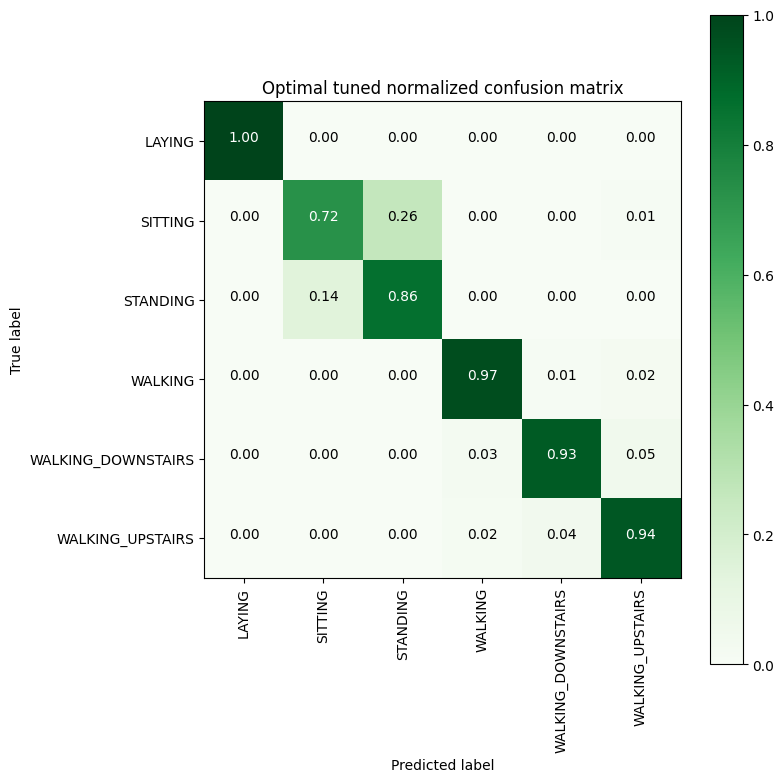

In [199]:
labels=['LAYING', 'SITTING','STANDING','WALKING','WALKING_DOWNSTAIRS','WALKING_UPSTAIRS']

plt.figure(figsize=(8,8))
cm = confusion_matrix_rnn(Y_val, best_model.predict(X_val_sc))
plot_confusion_matrix(cm, classes=labels, normalize=True, title='Optimal tuned normalized confusion matrix', cmap = plt.cm.Greens)
plt.show()